In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

C:\Users\User\AppData\Local\Temp\ipykernel_50088\2676221137.py:375: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.39307412 0.69695044 0.32924264 ... 0.28675577 0.28888214 0.44896719]
 [0.45747266 0.51683609 0.42215989 ... 0.44744836 0.28584447 0.55801944]
 [0.38487242 0.62674714 0.3411641  ... 0.35905225 0.21111786 0.59720535]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.33961118 0.4845079  0.34568651]
 [0.44896719 0.51620076 0.3997195  ... 0.41585662 0.27855407 0.57776428]
 [0.46780073 0.52414231 0.42356241 ... 0.48876063 0.37788578 0.5227825 ]]
Fold 2:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.38166311 0.62313675 0.34639831 ... 0.38227231 0.23789217 0.60767591]
 [0.39415169 0.71548931 0.32450565 ... 0.28754188 0.28967408 0.45019799]
 [0.45872677 0.53175632 0.4180791  ... 0.44867499 0.28662808 0.55954919]
 ...
 [0.54249162 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-23 17:53:45,490] A new study created in memory with name: no-name-3bcb8ab2-e749-4bec-9957-c444bfbc8b83
[I 2025-05-23 18:00:48,034] Trial 0 finished with value: 0.07206012234091759 and parameters: {'lr': 0.7649342788612542, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4371832983748416}. Best is trial 0 with value: 0.07206012234091759.


Cross Validation Accuracies:
[0.056449756026268005, 0.047760095447301865, 0.09963691234588623, 0.08443675190210342, 0.07201709598302841]
Mean Cross Validation Accuracy:
0.07206012234091759
Standard Deviation of Cross Validation Accuracy:
0.018696721643370662


[I 2025-05-23 18:06:07,029] Trial 1 finished with value: 0.08251337707042694 and parameters: {'lr': 0.0013967939206140725, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.44065725646457954}. Best is trial 0 with value: 0.07206012234091759.


Cross Validation Accuracies:
[0.0777195543050766, 0.08104904741048813, 0.07464973628520966, 0.0993419960141182, 0.07980655133724213]
Mean Cross Validation Accuracy:
0.08251337707042694
Standard Deviation of Cross Validation Accuracy:
0.008688971924909139


[I 2025-05-23 18:13:12,022] Trial 2 finished with value: 5.086327314376831 and parameters: {'lr': 0.4005920566210206, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1813408374866875}. Best is trial 0 with value: 0.07206012234091759.


Cross Validation Accuracies:
[6.105933666229248, 5.789912700653076, 6.357243537902832, 3.9020795822143555, 3.2764670848846436]
Mean Cross Validation Accuracy:
5.086327314376831
Standard Deviation of Cross Validation Accuracy:
1.2512309376905895


[I 2025-05-23 18:17:07,034] Trial 3 finished with value: 0.057678098976612094 and parameters: {'lr': 0.0010823497810514451, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19760129485035868}. Best is trial 3 with value: 0.057678098976612094.


Cross Validation Accuracies:
[0.04000397399067879, 0.051478251814842224, 0.06350371241569519, 0.07864321768283844, 0.054761338979005814]
Mean Cross Validation Accuracy:
0.057678098976612094
Standard Deviation of Cross Validation Accuracy:
0.012905768183561345


[I 2025-05-23 18:24:24,688] Trial 4 finished with value: 0.1218197375535965 and parameters: {'lr': 0.019254740495201973, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31452593996858297}. Best is trial 3 with value: 0.057678098976612094.


Cross Validation Accuracies:
[0.11294076591730118, 0.12191665172576904, 0.14760960638523102, 0.12121295183897018, 0.10541871190071106]
Mean Cross Validation Accuracy:
0.1218197375535965
Standard Deviation of Cross Validation Accuracy:
0.014236043659654175


[I 2025-05-23 18:28:36,302] Trial 5 finished with value: 0.06364448741078377 and parameters: {'lr': 0.00664579028320345, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4688786648683544}. Best is trial 3 with value: 0.057678098976612094.


Cross Validation Accuracies:
[0.0547165721654892, 0.05217396840453148, 0.06675796210765839, 0.07673661410808563, 0.06783732026815414]
Mean Cross Validation Accuracy:
0.06364448741078377
Standard Deviation of Cross Validation Accuracy:
0.009054919441012003


[I 2025-05-23 18:32:51,778] Trial 6 finished with value: 0.05700521767139435 and parameters: {'lr': 0.0011173720594563647, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24211918936170923}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.045908764004707336, 0.050335679203271866, 0.060580793768167496, 0.0699014738202095, 0.05829937756061554]
Mean Cross Validation Accuracy:
0.05700521767139435
Standard Deviation of Cross Validation Accuracy:
0.008347299494486038


[I 2025-05-23 18:39:26,751] Trial 7 finished with value: 0.061524692177772525 and parameters: {'lr': 0.025595084185026755, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3035825935968832}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.05014738067984581, 0.051270581781864166, 0.07033314555883408, 0.07868383824825287, 0.05718851462006569]
Mean Cross Validation Accuracy:
0.061524692177772525
Standard Deviation of Cross Validation Accuracy:
0.011184074191265967


[I 2025-05-23 18:45:18,915] Trial 8 finished with value: 28.158559608459473 and parameters: {'lr': 0.3170796279945854, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12462989688300063}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[33.06583023071289, 25.059595108032227, 32.87602233886719, 14.317343711853027, 35.47400665283203]
Mean Cross Validation Accuracy:
28.158559608459473
Standard Deviation of Cross Validation Accuracy:
7.759308777245764


[I 2025-05-23 18:49:22,508] Trial 9 finished with value: 0.059712447226047516 and parameters: {'lr': 0.011480722531212422, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4037033879147789}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.045874789357185364, 0.04867443069815636, 0.07067523896694183, 0.07851655781269073, 0.05482121929526329]
Mean Cross Validation Accuracy:
0.059712447226047516
Standard Deviation of Cross Validation Accuracy:
0.01273593398652406


[I 2025-05-23 18:54:46,804] Trial 10 finished with value: 0.059109295904636386 and parameters: {'lr': 0.09342302912966352, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.22625767762516308}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.05074447765946388, 0.04726641997694969, 0.06657706946134567, 0.07647277414798737, 0.0544857382774353]
Mean Cross Validation Accuracy:
0.059109295904636386
Standard Deviation of Cross Validation Accuracy:
0.010852273478373187


[I 2025-05-23 18:59:00,570] Trial 11 finished with value: 0.05916035920381546 and parameters: {'lr': 0.0010994094324206438, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.23048989413182794}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.041918668895959854, 0.046970609575510025, 0.06980367749929428, 0.07624874264001846, 0.06086009740829468]
Mean Cross Validation Accuracy:
0.05916035920381546
Standard Deviation of Cross Validation Accuracy:
0.01306941516241727


[I 2025-05-23 19:03:12,409] Trial 12 finished with value: 0.06086958944797516 and parameters: {'lr': 0.003618997020398975, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10704282938553963}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.05022396147251129, 0.04968411102890968, 0.06944061815738678, 0.07263782620429993, 0.06236143037676811]
Mean Cross Validation Accuracy:
0.06086958944797516
Standard Deviation of Cross Validation Accuracy:
0.009514450497035042


[I 2025-05-23 19:06:53,335] Trial 13 finished with value: 0.06476139947772026 and parameters: {'lr': 0.002681401625090322, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.23672412481462327}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.06316761672496796, 0.05620758235454559, 0.0687163844704628, 0.07714473456144333, 0.058570679277181625]
Mean Cross Validation Accuracy:
0.06476139947772026
Standard Deviation of Cross Validation Accuracy:
0.00752358746250257


[I 2025-05-23 19:11:58,774] Trial 14 finished with value: 0.15237223356962204 and parameters: {'lr': 0.05608255061672794, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.34341202396352943}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.10212404280900955, 0.1662125289440155, 0.18928712606430054, 0.14552226662635803, 0.15871520340442657]
Mean Cross Validation Accuracy:
0.15237223356962204
Standard Deviation of Cross Validation Accuracy:
0.028866239977205485


[I 2025-05-23 19:16:38,462] Trial 15 finished with value: 0.06584718376398087 and parameters: {'lr': 0.003373972439937076, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.17387109238596304}. Best is trial 6 with value: 0.05700521767139435.


Cross Validation Accuracies:
[0.04998613893985748, 0.06769750267267227, 0.07154815644025803, 0.08342663943767548, 0.05657748132944107]
Mean Cross Validation Accuracy:
0.06584718376398087
Standard Deviation of Cross Validation Accuracy:
0.011682997538651435


[I 2025-05-23 19:20:09,687] Trial 16 finished with value: 0.054298651218414304 and parameters: {'lr': 0.0010746058984986632, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27505000843881633}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05338387191295624, 0.03964228555560112, 0.05768955126404762, 0.05997864902019501, 0.060798898339271545]
Mean Cross Validation Accuracy:
0.054298651218414304
Standard Deviation of Cross Validation Accuracy:
0.00776736334156844


[I 2025-05-23 19:23:37,364] Trial 17 finished with value: 0.06293197199702263 and parameters: {'lr': 0.00856979320714541, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3615736546368465}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05152815580368042, 0.056460246443748474, 0.07171569764614105, 0.07530527561903, 0.0596504844725132]
Mean Cross Validation Accuracy:
0.06293197199702263
Standard Deviation of Cross Validation Accuracy:
0.009087913892454178


[I 2025-05-23 19:29:22,710] Trial 18 finished with value: 0.18959448337554932 and parameters: {'lr': 0.0029389033299347046, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.27585551868106944}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.1805219203233719, 0.19064337015151978, 0.18445731699466705, 0.21353884041309357, 0.1788109689950943]
Mean Cross Validation Accuracy:
0.18959448337554932
Standard Deviation of Cross Validation Accuracy:
0.012644512316133689


[I 2025-05-23 19:32:57,551] Trial 19 finished with value: 0.05865910723805427 and parameters: {'lr': 0.10774328243036053, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28620848297812695}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.04650899022817612, 0.04742002114653587, 0.06565273553133011, 0.07783036679029465, 0.05588342249393463]
Mean Cross Validation Accuracy:
0.05865910723805427
Standard Deviation of Cross Validation Accuracy:
0.0118160471804145


[I 2025-05-23 19:36:15,868] Trial 20 finished with value: 0.06495742946863174 and parameters: {'lr': 0.0019457863192083955, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3688853411736913}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05891149863600731, 0.05758124962449074, 0.0714297667145729, 0.07729317247867584, 0.059571459889411926]
Mean Cross Validation Accuracy:
0.06495742946863174
Standard Deviation of Cross Validation Accuracy:
0.00792504488402837


[I 2025-05-23 19:39:44,123] Trial 21 finished with value: 0.06254430115222931 and parameters: {'lr': 0.0010719821043184631, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17952671030850015}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.053894754499197006, 0.05167306959629059, 0.06860359758138657, 0.08093009144067764, 0.05761999264359474]
Mean Cross Validation Accuracy:
0.06254430115222931
Standard Deviation of Cross Validation Accuracy:
0.01088117185675541


[I 2025-05-23 19:43:18,334] Trial 22 finished with value: 0.0637624055147171 and parameters: {'lr': 0.0055625700673257025, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2612444721102217}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05740759149193764, 0.049981631338596344, 0.07447752356529236, 0.07824359834194183, 0.05870168283581734]
Mean Cross Validation Accuracy:
0.0637624055147171
Standard Deviation of Cross Validation Accuracy:
0.010774256472973998


[I 2025-05-23 19:46:46,246] Trial 23 finished with value: 0.061713476479053495 and parameters: {'lr': 0.0018806898400016239, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1450559009531439}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05017836391925812, 0.05142372474074364, 0.07284460961818695, 0.08042047172784805, 0.05370021238923073]
Mean Cross Validation Accuracy:
0.061713476479053495
Standard Deviation of Cross Validation Accuracy:
0.012465985802783347


[I 2025-05-23 19:50:11,197] Trial 24 finished with value: 0.05727450475096703 and parameters: {'lr': 0.0011254904372488544, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.20576688683654912}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.044090211391448975, 0.05150562897324562, 0.05684817209839821, 0.07903045415878296, 0.054898057132959366]
Mean Cross Validation Accuracy:
0.05727450475096703
Standard Deviation of Cross Validation Accuracy:
0.011715426723562739


[I 2025-05-23 19:53:35,112] Trial 25 finished with value: 0.06570906788110734 and parameters: {'lr': 0.014038366866246115, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2129735495855885}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05148975923657417, 0.05653614178299904, 0.07916032522916794, 0.07913964986801147, 0.06221946328878403]
Mean Cross Validation Accuracy:
0.06570906788110734
Standard Deviation of Cross Validation Accuracy:
0.011487606439039632


[I 2025-05-23 19:57:01,285] Trial 26 finished with value: 0.06353283524513245 and parameters: {'lr': 0.004411729781550506, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26256659073222544}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.052620671689510345, 0.05467204749584198, 0.07072745263576508, 0.07937321811914444, 0.06027078628540039]
Mean Cross Validation Accuracy:
0.06353283524513245
Standard Deviation of Cross Validation Accuracy:
0.010108512110208882


[I 2025-05-23 20:00:26,776] Trial 27 finished with value: 0.05735350921750069 and parameters: {'lr': 0.0019506901540909582, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14722414390611316}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.04716888442635536, 0.04756490886211395, 0.056058429181575775, 0.07734944671392441, 0.058625876903533936]
Mean Cross Validation Accuracy:
0.05735350921750069
Standard Deviation of Cross Validation Accuracy:
0.01097886102692521


[I 2025-05-23 20:05:43,945] Trial 28 finished with value: 0.13385844528675078 and parameters: {'lr': 0.0019182833496187177, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3155112751592718}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.13768813014030457, 0.11159119755029678, 0.22440649569034576, 0.08901239186525345, 0.1065940111875534]
Mean Cross Validation Accuracy:
0.13385844528675078
Standard Deviation of Cross Validation Accuracy:
0.0478831162602423


[I 2025-05-23 20:10:20,399] Trial 29 finished with value: 0.06508426442742347 and parameters: {'lr': 0.008147594637003982, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2542931464064082}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05154303088784218, 0.060791827738285065, 0.07594741880893707, 0.08142916858196259, 0.055709876120090485]
Mean Cross Validation Accuracy:
0.06508426442742347
Standard Deviation of Cross Validation Accuracy:
0.011617514274388238


[I 2025-05-23 20:14:10,449] Trial 30 finished with value: 0.07431434243917465 and parameters: {'lr': 0.7925397707925084, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.34339349111483897}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.06858494877815247, 0.05684300512075424, 0.09317756444215775, 0.07908895611763, 0.0738772377371788]
Mean Cross Validation Accuracy:
0.07431434243917465
Standard Deviation of Cross Validation Accuracy:
0.011973994488472226


[I 2025-05-23 20:17:34,432] Trial 31 finished with value: 0.06114501357078552 and parameters: {'lr': 0.0018087785379632413, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1525480201824016}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.050357475876808167, 0.04966117441654205, 0.07014539837837219, 0.07711610198020935, 0.05844491720199585]
Mean Cross Validation Accuracy:
0.06114501357078552
Standard Deviation of Cross Validation Accuracy:
0.01087770787699815


[I 2025-05-23 20:21:14,239] Trial 32 finished with value: 0.06337793916463852 and parameters: {'lr': 0.0015643032362946058, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21104443864179478}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.06358697265386581, 0.04594401270151138, 0.07594268023967743, 0.07674183696508408, 0.054674193263053894]
Mean Cross Validation Accuracy:
0.06337793916463852
Standard Deviation of Cross Validation Accuracy:
0.01196835128448541


[I 2025-05-23 20:25:57,496] Trial 33 finished with value: 0.06102380454540253 and parameters: {'lr': 0.002509826261858655, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15605036701137562}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.049128759652376175, 0.055962707847356796, 0.06877361238002777, 0.07610231637954712, 0.05515162646770477]
Mean Cross Validation Accuracy:
0.06102380454540253
Standard Deviation of Cross Validation Accuracy:
0.009889492492300433


[I 2025-05-23 20:29:44,892] Trial 34 finished with value: 0.057770851999521255 and parameters: {'lr': 0.0010773022264277778, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.20013920768665638}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.04757637158036232, 0.04380665346980095, 0.07363405078649521, 0.07980179041624069, 0.04403539374470711]
Mean Cross Validation Accuracy:
0.057770851999521255
Standard Deviation of Cross Validation Accuracy:
0.015649871618260234


[I 2025-05-23 20:33:21,924] Trial 35 finished with value: 0.06945686638355256 and parameters: {'lr': 0.0047264084390347925, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24299491809497445}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.07264554500579834, 0.054483577609062195, 0.07963231205940247, 0.07664595544338226, 0.06387694180011749]
Mean Cross Validation Accuracy:
0.06945686638355256
Standard Deviation of Cross Validation Accuracy:
0.009173061676991005


[I 2025-05-23 20:37:08,383] Trial 36 finished with value: 0.06334197893738747 and parameters: {'lr': 0.001420106885781037, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10221421764139052}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.05549798905849457, 0.057784222066402435, 0.06960686296224594, 0.0779145136475563, 0.05590630695223808]
Mean Cross Validation Accuracy:
0.06334197893738747
Standard Deviation of Cross Validation Accuracy:
0.008936594387706017


[I 2025-05-23 20:41:06,343] Trial 37 finished with value: 0.06267730444669724 and parameters: {'lr': 0.001071104205574169, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.49986545100426455}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.048860158771276474, 0.047200024127960205, 0.0768384039402008, 0.07822474092245102, 0.06226319447159767]
Mean Cross Validation Accuracy:
0.06267730444669724
Standard Deviation of Cross Validation Accuracy:
0.013212802333983103


[I 2025-05-23 20:45:37,784] Trial 38 finished with value: 0.06384495943784714 and parameters: {'lr': 0.0023671903261146426, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13217539868287217}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.053039249032735825, 0.059681523591279984, 0.067757248878479, 0.07932119816541672, 0.05942557752132416]
Mean Cross Validation Accuracy:
0.06384495943784714
Standard Deviation of Cross Validation Accuracy:
0.009038235289609424


[I 2025-05-23 20:51:31,119] Trial 39 finished with value: 0.10914052724838257 and parameters: {'lr': 0.0014838517609371982, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17295695839998892}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[0.11229730397462845, 0.10593702644109726, 0.11112112551927567, 0.11193189024925232, 0.10441529005765915]
Mean Cross Validation Accuracy:
0.10914052724838257
Standard Deviation of Cross Validation Accuracy:
0.003294540943546774


[I 2025-05-23 20:56:45,184] Trial 40 finished with value: 1.3459697723388673 and parameters: {'lr': 0.5135069910383675, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19404223122239353}. Best is trial 16 with value: 0.054298651218414304.


Cross Validation Accuracies:
[1.6666359901428223, 1.341712236404419, 1.6463291645050049, 0.998321533203125, 1.0768499374389648]
Mean Cross Validation Accuracy:
1.3459697723388673
Standard Deviation of Cross Validation Accuracy:
0.27797319943694976


[I 2025-05-23 20:59:56,604] Trial 41 finished with value: 0.05425665974617004 and parameters: {'lr': 0.0011347147276107058, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29079121503879984}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.036948151886463165, 0.04548609256744385, 0.049371227622032166, 0.0809520035982132, 0.058525823056697845]
Mean Cross Validation Accuracy:
0.05425665974617004
Standard Deviation of Cross Validation Accuracy:
0.015041554964540182


[I 2025-05-23 21:03:06,865] Trial 42 finished with value: 0.06202223524451256 and parameters: {'lr': 0.0013434121103428614, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3079151959678908}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.05362914502620697, 0.057166967540979385, 0.05831719562411308, 0.08416788280010223, 0.05682998523116112]
Mean Cross Validation Accuracy:
0.06202223524451256
Standard Deviation of Cross Validation Accuracy:
0.011181539002586916


[I 2025-05-23 21:06:15,478] Trial 43 finished with value: 0.062415314465761186 and parameters: {'lr': 0.003620492977072901, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22077611096241692}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.055632080882787704, 0.05799425020813942, 0.0701146125793457, 0.0749204158782959, 0.0534152127802372]
Mean Cross Validation Accuracy:
0.062415314465761186
Standard Deviation of Cross Validation Accuracy:
0.008511364757083266


[I 2025-05-23 21:09:26,437] Trial 44 finished with value: 0.06342962309718132 and parameters: {'lr': 0.0020421192612707865, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.28799119810896673}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.05438614264130592, 0.05344979465007782, 0.0668138638138771, 0.07999290525913239, 0.06250540912151337]
Mean Cross Validation Accuracy:
0.06342962309718132
Standard Deviation of Cross Validation Accuracy:
0.009675030617700229


[I 2025-05-23 21:12:34,020] Trial 45 finished with value: 0.061692602932453156 and parameters: {'lr': 0.03380305967232328, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.32368497078391634}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.051797054708004, 0.05152216926217079, 0.0701744332909584, 0.07852555066347122, 0.05644380673766136]
Mean Cross Validation Accuracy:
0.061692602932453156
Standard Deviation of Cross Validation Accuracy:
0.010809246345089193


[I 2025-05-23 21:16:00,592] Trial 46 finished with value: 0.4689092874526978 and parameters: {'lr': 0.0010399925489496273, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.245082897182169}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.47366610169410706, 0.47770071029663086, 0.4831337630748749, 0.4493902921676636, 0.4606555700302124]
Mean Cross Validation Accuracy:
0.4689092874526978
Standard Deviation of Cross Validation Accuracy:
0.012258606220133179


[I 2025-05-23 21:19:28,180] Trial 47 finished with value: 0.0607474111020565 and parameters: {'lr': 0.001427593494939906, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27346369019308586}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.054956015199422836, 0.04076950252056122, 0.06759022176265717, 0.08277484774589539, 0.05764646828174591]
Mean Cross Validation Accuracy:
0.0607474111020565
Standard Deviation of Cross Validation Accuracy:
0.013959261921760956


[I 2025-05-23 21:25:09,248] Trial 48 finished with value: 0.06501882374286652 and parameters: {'lr': 0.002818805323418977, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.19215852005762485}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.059712138026952744, 0.05410493537783623, 0.06997279077768326, 0.08092878758907318, 0.06037546694278717]
Mean Cross Validation Accuracy:
0.06501882374286652
Standard Deviation of Cross Validation Accuracy:
0.009449903426748065


[I 2025-05-23 21:29:08,183] Trial 49 finished with value: 0.06000971123576164 and parameters: {'lr': 0.004129234189522773, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.22870996400133006}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.04913308471441269, 0.04766879975795746, 0.06681476533412933, 0.0785723552107811, 0.057859551161527634]
Mean Cross Validation Accuracy:
0.06000971123576164
Standard Deviation of Cross Validation Accuracy:
0.011542121135716584


[I 2025-05-23 21:32:47,482] Trial 50 finished with value: 0.07033597379922867 and parameters: {'lr': 0.0026456562349923777, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16943404906249981}. Best is trial 41 with value: 0.05425665974617004.


Cross Validation Accuracies:
[0.06319433450698853, 0.06180451065301895, 0.06658823788166046, 0.09005246311426163, 0.07004032284021378]
Mean Cross Validation Accuracy:
0.07033597379922867
Standard Deviation of Cross Validation Accuracy:
0.010263155071446685


[I 2025-05-23 21:36:14,433] Trial 51 finished with value: 0.053183164447546005 and parameters: {'lr': 0.00100085910642581, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1189944979536972}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.05476187542080879, 0.04437877982854843, 0.04439731687307358, 0.08358131349086761, 0.03879653662443161]
Mean Cross Validation Accuracy:
0.053183164447546005
Standard Deviation of Cross Validation Accuracy:
0.01605131246869868


[I 2025-05-23 21:39:39,656] Trial 52 finished with value: 0.057876481860876086 and parameters: {'lr': 0.0013263564759144746, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12214005782452025}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.049849748611450195, 0.052085842937231064, 0.05252635106444359, 0.07940727472305298, 0.05551319196820259]
Mean Cross Validation Accuracy:
0.057876481860876086
Standard Deviation of Cross Validation Accuracy:
0.01091553045647519


[I 2025-05-23 21:42:56,264] Trial 53 finished with value: 0.6888701319694519 and parameters: {'lr': 0.23535525223884848, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11237246248410983}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.5692390203475952, 0.9088461399078369, 0.7497034668922424, 0.5990287661552429, 0.617533266544342]
Mean Cross Validation Accuracy:
0.6888701319694519
Standard Deviation of Cross Validation Accuracy:
0.126144489340011


[I 2025-05-23 21:46:14,365] Trial 54 finished with value: 0.060284579545259474 and parameters: {'lr': 0.0015757180422496294, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1388904272844679}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.054138120263814926, 0.05149645730853081, 0.07016156613826752, 0.06902698427438736, 0.05659976974129677]
Mean Cross Validation Accuracy:
0.060284579545259474
Standard Deviation of Cross Validation Accuracy:
0.007779105116192461


[I 2025-05-23 21:49:21,768] Trial 55 finished with value: 0.08482884094119073 and parameters: {'lr': 0.0010067883737911619, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1586746701822145}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.050498127937316895, 0.04910992458462715, 0.19214853644371033, 0.07693206518888474, 0.05545555055141449]
Mean Cross Validation Accuracy:
0.08482884094119073
Standard Deviation of Cross Validation Accuracy:
0.054584073023913104


[I 2025-05-23 21:52:51,464] Trial 56 finished with value: 0.061609522253274915 and parameters: {'lr': 0.00586302317388976, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2909537959924325}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.05712315812706947, 0.05480621010065079, 0.06851083040237427, 0.07491522282361984, 0.05269218981266022]
Mean Cross Validation Accuracy:
0.061609522253274915
Standard Deviation of Cross Validation Accuracy:
0.008609309600797126


[I 2025-05-23 21:55:59,291] Trial 57 finished with value: 0.058650749176740645 and parameters: {'lr': 0.0021822540748486015, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39186237414722197}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.043769411742687225, 0.04989910498261452, 0.04824081435799599, 0.09607041627168655, 0.05527399852871895]
Mean Cross Validation Accuracy:
0.058650749176740645
Standard Deviation of Cross Validation Accuracy:
0.019068540338960115


[I 2025-05-23 22:01:09,460] Trial 58 finished with value: 0.06524761468172073 and parameters: {'lr': 0.0031746959352485418, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.26804485854976823}. Best is trial 51 with value: 0.053183164447546005.


Cross Validation Accuracies:
[0.05949690192937851, 0.05826469883322716, 0.07384663820266724, 0.07600544393062592, 0.05862439051270485]
Mean Cross Validation Accuracy:
0.06524761468172073
Standard Deviation of Cross Validation Accuracy:
0.00794195196362357


[I 2025-05-23 22:05:01,928] Trial 59 finished with value: 0.030798666179180145 and parameters: {'lr': 0.0012502657102749708, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33547357378065584}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.025136487558484077, 0.02409687452018261, 0.035464946180582047, 0.042393650859594345, 0.026901371777057648]
Mean Cross Validation Accuracy:
0.030798666179180145
Standard Deviation of Cross Validation Accuracy:
0.007048134797527857


[I 2025-05-23 22:09:01,994] Trial 60 finished with value: 0.0369475070387125 and parameters: {'lr': 0.0012867798711888121, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.32864505143143946}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.02799174375832081, 0.03171113133430481, 0.042942605912685394, 0.0462031327188015, 0.03588892146945]
Mean Cross Validation Accuracy:
0.0369475070387125
Standard Deviation of Cross Validation Accuracy:
0.006787543695597224


[I 2025-05-23 22:12:31,618] Trial 61 finished with value: 0.03575509451329708 and parameters: {'lr': 0.0012433740700621765, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.33927327902027876}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.026092244312167168, 0.03787248209118843, 0.04162708297371864, 0.0417558029294014, 0.031427860260009766]
Mean Cross Validation Accuracy:
0.03575509451329708
Standard Deviation of Cross Validation Accuracy:
0.006116661024149322


[I 2025-05-23 22:16:14,117] Trial 62 finished with value: 0.03759890794754028 and parameters: {'lr': 0.0013063517722710527, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3338463422896367}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03681910037994385, 0.02810189127922058, 0.03943346440792084, 0.051044151186943054, 0.032595932483673096]
Mean Cross Validation Accuracy:
0.03759890794754028
Standard Deviation of Cross Validation Accuracy:
0.007745596840862685


[I 2025-05-23 22:19:49,390] Trial 63 finished with value: 0.03908892050385475 and parameters: {'lr': 0.0012845031515324261, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.34290571919696217}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03362112119793892, 0.03197160363197327, 0.03692518547177315, 0.05856974050402641, 0.03435695171356201]
Mean Cross Validation Accuracy:
0.03908892050385475
Standard Deviation of Cross Validation Accuracy:
0.009870447350601618


[I 2025-05-23 22:23:28,065] Trial 64 finished with value: 0.040483610704541206 and parameters: {'lr': 0.0017108629638542395, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3462965802826496}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.030705459415912628, 0.03096463717520237, 0.04569422826170921, 0.05667039379477501, 0.03838333487510681]
Mean Cross Validation Accuracy:
0.040483610704541206
Standard Deviation of Cross Validation Accuracy:
0.009795884241584472


[I 2025-05-23 22:26:55,401] Trial 65 finished with value: 0.03551986627280712 and parameters: {'lr': 0.001586601518805528, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3333429677140561}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03288240730762482, 0.027218015864491463, 0.0414506271481514, 0.04139486327767372, 0.03465341776609421]
Mean Cross Validation Accuracy:
0.03551986627280712
Standard Deviation of Cross Validation Accuracy:
0.0054095685110286265


[I 2025-05-23 22:30:42,965] Trial 66 finished with value: 0.03723147846758366 and parameters: {'lr': 0.0016528312456765006, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3363692432443674}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03184133023023605, 0.0381150059401989, 0.04185551777482033, 0.0442412868142128, 0.030104251578450203]
Mean Cross Validation Accuracy:
0.03723147846758366
Standard Deviation of Cross Validation Accuracy:
0.005498196695571661


[I 2025-05-23 22:34:31,677] Trial 67 finished with value: 0.17897313833236694 and parameters: {'lr': 0.002353851601013846, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.37780995976035053}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.17900292575359344, 0.21011210978031158, 0.16830366849899292, 0.1560274213552475, 0.18141956627368927]
Mean Cross Validation Accuracy:
0.17897313833236694
Standard Deviation of Cross Validation Accuracy:
0.017977569101064825


[I 2025-05-23 22:38:28,590] Trial 68 finished with value: 0.03851567916572094 and parameters: {'lr': 0.0013101443603744595, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3279666662603052}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.04353722929954529, 0.03135053813457489, 0.04562627896666527, 0.041559524834156036, 0.030504824593663216]
Mean Cross Validation Accuracy:
0.03851567916572094
Standard Deviation of Cross Validation Accuracy:
0.006333318698752223


[I 2025-05-23 22:42:15,285] Trial 69 finished with value: 0.06286211758852005 and parameters: {'lr': 0.0036580668794361547, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.42896955943011955}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.053115323185920715, 0.04894314706325531, 0.07372073084115982, 0.08039872348308563, 0.05813266336917877]
Mean Cross Validation Accuracy:
0.06286211758852005
Standard Deviation of Cross Validation Accuracy:
0.012137112563491299


[I 2025-05-23 22:46:09,484] Trial 70 finished with value: 0.06695680767297744 and parameters: {'lr': 0.0017377014465072447, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3255381568313901}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.05979325994849205, 0.04736293479800224, 0.07469529658555984, 0.0843815803527832, 0.0685509666800499]
Mean Cross Validation Accuracy:
0.06695680767297744
Standard Deviation of Cross Validation Accuracy:
0.012659261643354756


[I 2025-05-23 22:49:51,848] Trial 71 finished with value: 0.03895545490086079 and parameters: {'lr': 0.0013046075572355847, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3327388061460586}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.027170030400156975, 0.033454589545726776, 0.040709756314754486, 0.05748887360095978, 0.03595402464270592]
Mean Cross Validation Accuracy:
0.03895545490086079
Standard Deviation of Cross Validation Accuracy:
0.010244310773064622


[I 2025-05-23 22:53:33,134] Trial 72 finished with value: 0.04393359422683716 and parameters: {'lr': 0.002116410043313879, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35815842532732434}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.030895162373781204, 0.03358379378914833, 0.04769623652100563, 0.07010111212730408, 0.03739166632294655]
Mean Cross Validation Accuracy:
0.04393359422683716
Standard Deviation of Cross Validation Accuracy:
0.014274539327709267


[I 2025-05-23 22:57:11,193] Trial 73 finished with value: 0.03974156305193901 and parameters: {'lr': 0.0013671400214647098, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3346320608966333}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03459353744983673, 0.0348418690264225, 0.04344327747821808, 0.05319640412926674, 0.032632727175951004]
Mean Cross Validation Accuracy:
0.03974156305193901
Standard Deviation of Cross Validation Accuracy:
0.007691295791544947


[I 2025-05-23 23:00:38,701] Trial 74 finished with value: 0.04533149227499962 and parameters: {'lr': 0.0016811088040344618, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.37848950596806136}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03743484616279602, 0.042340099811553955, 0.041436463594436646, 0.06737998127937317, 0.0380660705268383]
Mean Cross Validation Accuracy:
0.04533149227499962
Standard Deviation of Cross Validation Accuracy:
0.011183907346440104


[I 2025-05-23 23:04:11,187] Trial 75 finished with value: 0.05561741441488266 and parameters: {'lr': 0.0029947289252740678, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.30378109494681976}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.0520363412797451, 0.0458454005420208, 0.053601279854774475, 0.07078155875205994, 0.05582249164581299]
Mean Cross Validation Accuracy:
0.05561741441488266
Standard Deviation of Cross Validation Accuracy:
0.00827495581431663


[I 2025-05-23 23:07:59,566] Trial 76 finished with value: 0.03617882877588272 and parameters: {'lr': 0.0013020796324823855, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35921534983976383}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.021792996674776077, 0.032840754836797714, 0.04177350178360939, 0.04605517536401749, 0.038431715220212936]
Mean Cross Validation Accuracy:
0.03617882877588272
Standard Deviation of Cross Validation Accuracy:
0.008390625580818422


[I 2025-05-23 23:12:09,552] Trial 77 finished with value: 0.10033533796668052 and parameters: {'lr': 0.01632194607612514, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3591978885538264}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.1111692264676094, 0.08089607954025269, 0.1492164134979248, 0.10318705439567566, 0.05720791593194008]
Mean Cross Validation Accuracy:
0.10033533796668052
Standard Deviation of Cross Validation Accuracy:
0.030830907451014897


[I 2025-05-23 23:15:59,995] Trial 78 finished with value: 0.04326142370700836 and parameters: {'lr': 0.0023625841207259033, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3502008134134381}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.034658078104257584, 0.03275098279118538, 0.042624060064554214, 0.06425386667251587, 0.04202013090252876]
Mean Cross Validation Accuracy:
0.04326142370700836
Standard Deviation of Cross Validation Accuracy:
0.011199255561908013


[I 2025-05-23 23:19:21,664] Trial 79 finished with value: 0.7025201797485352 and parameters: {'lr': 0.10976413266173177, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.41042687299973335}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.6906417012214661, 0.6908394694328308, 0.9178019165992737, 0.6032626628875732, 0.610055148601532]
Mean Cross Validation Accuracy:
0.7025201797485352
Standard Deviation of Cross Validation Accuracy:
0.11403999307741866


[I 2025-05-23 23:22:55,068] Trial 80 finished with value: 0.037330149486660955 and parameters: {'lr': 0.0017188275795732902, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31574659258287524}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.0243708323687315, 0.03263750672340393, 0.041143253445625305, 0.04899294674396515, 0.0395062081515789]
Mean Cross Validation Accuracy:
0.037330149486660955
Standard Deviation of Cross Validation Accuracy:
0.008309760877987096


[I 2025-05-23 23:26:47,142] Trial 81 finished with value: 0.037377651408314706 and parameters: {'lr': 0.0017598478673057445, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31548175492035657}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.033211711794137955, 0.03239700570702553, 0.042345039546489716, 0.048090945929288864, 0.030843554064631462]
Mean Cross Validation Accuracy:
0.037377651408314706
Standard Deviation of Cross Validation Accuracy:
0.006697849460474349


[I 2025-05-23 23:30:50,298] Trial 82 finished with value: 0.04229677692055702 and parameters: {'lr': 0.0018842489308606271, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.37430524387744196}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03183751180768013, 0.03881780058145523, 0.04246476665139198, 0.05382252857089043, 0.04454127699136734]
Mean Cross Validation Accuracy:
0.04229677692055702
Standard Deviation of Cross Validation Accuracy:
0.007202894630524182


[I 2025-05-23 23:35:12,275] Trial 83 finished with value: 0.03870821371674538 and parameters: {'lr': 0.0015994088973463464, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3103869487685059}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03333340585231781, 0.04552781581878662, 0.03963594138622284, 0.04283057525753975, 0.03221333026885986]
Mean Cross Validation Accuracy:
0.03870821371674538
Standard Deviation of Cross Validation Accuracy:
0.0052044901136043984


[I 2025-05-23 23:40:08,846] Trial 84 finished with value: 0.05182965248823166 and parameters: {'lr': 0.002720427972748594, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31503955191695804}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.05308486521244049, 0.05050293356180191, 0.03950494900345802, 0.061405424028635025, 0.054650090634822845]
Mean Cross Validation Accuracy:
0.05182965248823166
Standard Deviation of Cross Validation Accuracy:
0.007139808541033853


[I 2025-05-23 23:44:39,998] Trial 85 finished with value: 0.039779007807374 and parameters: {'lr': 0.001209452795912356, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.387639579984801}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.030046798288822174, 0.029743051156401634, 0.04710543155670166, 0.05709208548069, 0.03490767255425453]
Mean Cross Validation Accuracy:
0.039779007807374
Standard Deviation of Cross Validation Accuracy:
0.010701265146126016


[I 2025-05-23 23:49:07,036] Trial 86 finished with value: 0.05974800735712051 and parameters: {'lr': 0.010102740567812461, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2973942473635177}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.04971541464328766, 0.04874541610479355, 0.06837629526853561, 0.07689940184354782, 0.05500350892543793]
Mean Cross Validation Accuracy:
0.05974800735712051
Standard Deviation of Cross Validation Accuracy:
0.011071024174004802


[I 2025-05-23 23:53:41,916] Trial 87 finished with value: 0.038766708597540854 and parameters: {'lr': 0.002077750704770286, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31883325096623777}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.027220116928219795, 0.02685198187828064, 0.04460660740733147, 0.05459579452872276, 0.04055904224514961]
Mean Cross Validation Accuracy:
0.038766708597540854
Standard Deviation of Cross Validation Accuracy:
0.010612834978481226


[I 2025-05-23 23:58:34,020] Trial 88 finished with value: 0.17043511793017388 and parameters: {'lr': 0.004987795033131144, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.33691699163222727}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.05001896247267723, 0.05694018304347992, 0.08284531533718109, 0.33297425508499146, 0.3293968737125397]
Mean Cross Validation Accuracy:
0.17043511793017388
Standard Deviation of Cross Validation Accuracy:
0.13171251661616937


[I 2025-05-24 00:03:39,752] Trial 89 finished with value: 0.16160966008901595 and parameters: {'lr': 0.025052506178138836, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.36598698285936676}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.12526607513427734, 0.20008373260498047, 0.12134163081645966, 0.11875874549150467, 0.24259811639785767]
Mean Cross Validation Accuracy:
0.16160966008901595
Standard Deviation of Cross Validation Accuracy:
0.05063191788181407


[I 2025-05-24 00:08:09,901] Trial 90 finished with value: 0.04159844033420086 and parameters: {'lr': 0.0015097975575127617, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35302214997063436}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.029906148090958595, 0.03151809424161911, 0.04518076404929161, 0.059256087988615036, 0.04213110730051994]
Mean Cross Validation Accuracy:
0.04159844033420086
Standard Deviation of Cross Validation Accuracy:
0.01061350435277396


[I 2025-05-24 00:12:36,724] Trial 91 finished with value: 0.03908409476280213 and parameters: {'lr': 0.001183192955208038, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.32762978553489297}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.02784068137407303, 0.03335268050432205, 0.04058794304728508, 0.0575292743742466, 0.03610989451408386]
Mean Cross Validation Accuracy:
0.03908409476280213
Standard Deviation of Cross Validation Accuracy:
0.010105399860597565


[I 2025-05-24 00:16:55,430] Trial 92 finished with value: 0.038319554179906845 and parameters: {'lr': 0.0017576750618080305, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.29837735930690384}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.027683846652507782, 0.031101655215024948, 0.04059755802154541, 0.05683600902557373, 0.035378701984882355]
Mean Cross Validation Accuracy:
0.038319554179906845
Standard Deviation of Cross Validation Accuracy:
0.010216783772427969


[I 2025-05-24 00:21:15,037] Trial 93 finished with value: 0.035439589992165565 and parameters: {'lr': 0.0018442487681509933, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.30147926099037503}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.02709759958088398, 0.03306030482053757, 0.04113982245326042, 0.04741266742348671, 0.02848755568265915]
Mean Cross Validation Accuracy:
0.035439589992165565
Standard Deviation of Cross Validation Accuracy:
0.00773857630675473


[I 2025-05-24 00:26:41,381] Trial 94 finished with value: 0.03702912367880344 and parameters: {'lr': 0.001551074430213394, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.33938748151882775}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.03291343152523041, 0.033997878432273865, 0.0425603985786438, 0.048273101449012756, 0.027400808408856392]
Mean Cross Validation Accuracy:
0.03702912367880344
Standard Deviation of Cross Validation Accuracy:
0.007427703046025084


[I 2025-05-24 00:31:38,578] Trial 95 finished with value: 0.04000371098518372 and parameters: {'lr': 0.0023546464303161826, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.31956002937883216}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.036158815026283264, 0.03612401708960533, 0.04216217249631882, 0.04693606123328209, 0.03863748908042908]
Mean Cross Validation Accuracy:
0.04000371098518372
Standard Deviation of Cross Validation Accuracy:
0.004108971842408994


[I 2025-05-24 00:36:52,657] Trial 96 finished with value: 0.05988442152738571 and parameters: {'lr': 0.0032988672155724037, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.28383846180246886}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.050709474831819534, 0.052477993071079254, 0.0688331201672554, 0.06822524964809418, 0.05917626991868019]
Mean Cross Validation Accuracy:
0.05988442152738571
Standard Deviation of Cross Validation Accuracy:
0.007605063170443566


[I 2025-05-24 00:42:02,447] Trial 97 finished with value: 0.061594215035438535 and parameters: {'lr': 0.00401536209601469, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.34004760096430076}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.05318608507514, 0.049221381545066833, 0.07108752429485321, 0.07851435989141464, 0.055961724370718]
Mean Cross Validation Accuracy:
0.061594215035438535
Standard Deviation of Cross Validation Accuracy:
0.011242089056220829


[I 2025-05-24 00:46:40,167] Trial 98 finished with value: 0.03800682798027992 and parameters: {'lr': 0.0019516062884997346, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3063712886281666}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.030467383563518524, 0.03752943128347397, 0.047502681612968445, 0.04084378480911255, 0.033690858632326126]
Mean Cross Validation Accuracy:
0.03800682798027992
Standard Deviation of Cross Validation Accuracy:
0.005897767058711907


[I 2025-05-24 00:51:36,032] Trial 99 finished with value: 0.03586635477840901 and parameters: {'lr': 0.001594350513526135, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2802936769954576}. Best is trial 59 with value: 0.030798666179180145.


Cross Validation Accuracies:
[0.028425173833966255, 0.027343131601810455, 0.04772968590259552, 0.04087981581687927, 0.03495396673679352]
Mean Cross Validation Accuracy:
0.03586635477840901
Standard Deviation of Cross Validation Accuracy:
0.007677530541142502
Number of finished trials: 100
Best trial: {'lr': 0.0012502657102749708, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33547357378065584}
Best hyperparameters:  {'lr': 0.0012502657102749708, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.33547357378065584}
Fold 1:
Epoch 1/100
84/84 [==============================] - 17s 48ms/step - loss: 0.1864 - val_loss: 0.1377
Epoch 2/100
84/84 [==============================] - 2s 20ms/step - loss: 0.1195 - val_loss: 0.1278
Epoch 3/100
84/84 [==============================] - 2s 28ms/step - loss: 0.0916 - val_loss: 0.0986
Epoch 4/100
84/84 [==============================] - 2s 23

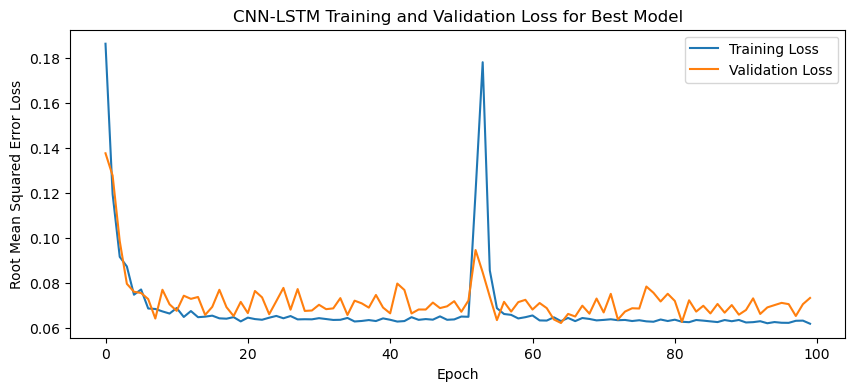

1/1 - 4s - loss: 0.0425 - 4s/epoch - 4s/step
Test Loss: 0.042541902512311935
1/1 [==============================] - 0s 43ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

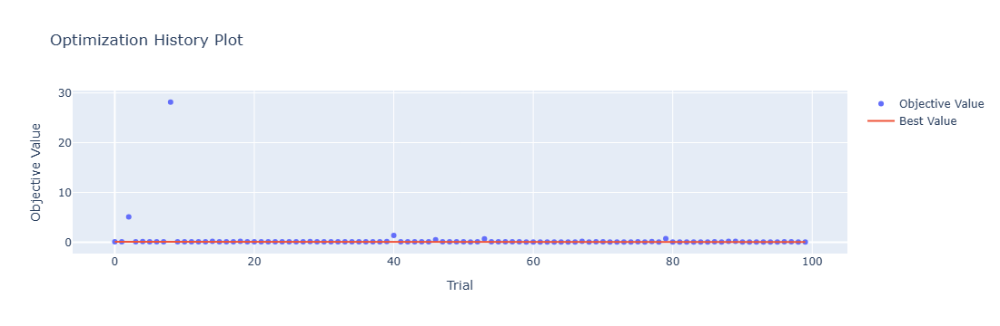

In [4]:
optuna.visualization.plot_optimization_history(study)

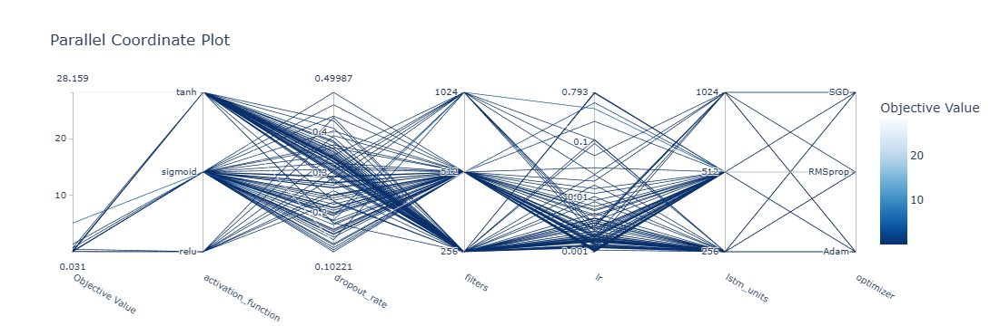

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

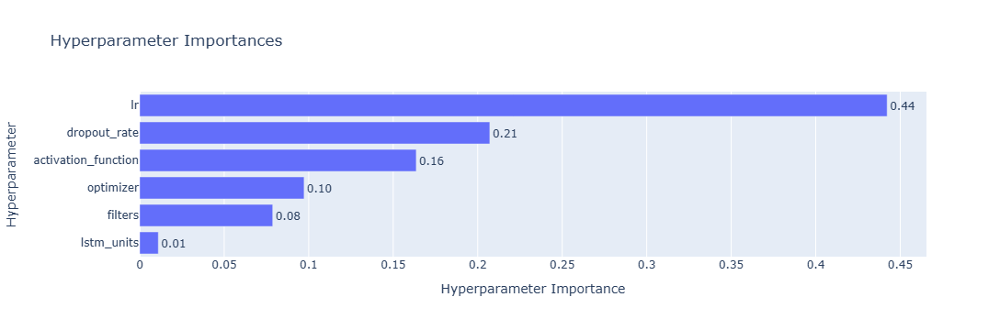

In [6]:
optuna.visualization.plot_param_importances(study)

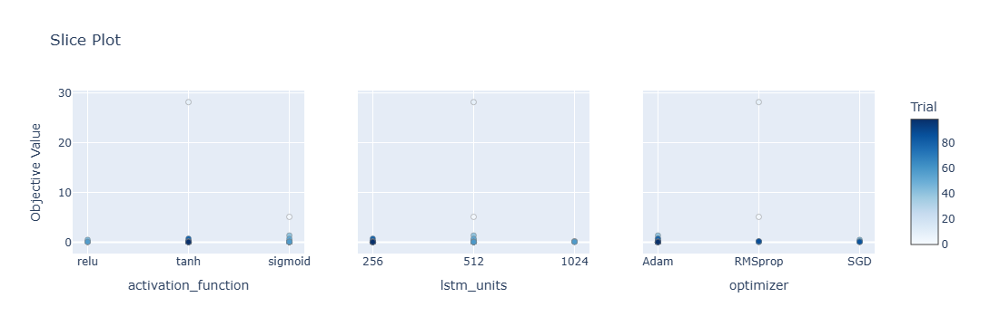

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

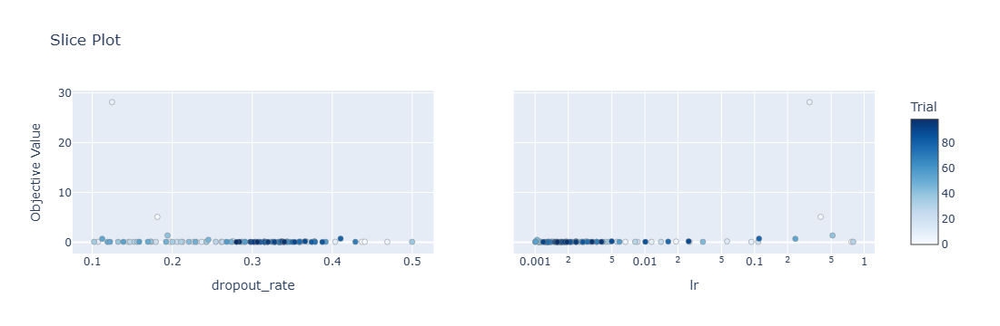

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 49s 444ms/step - loss: 0.1661 - accuracy: 0.4524 - mae: 0.1388 - rmse: 0.1661 - mape: 28.8488 - pearson: 0.5636 - val_loss: 0.0953 - val_accuracy: 0.0000e+00 - val_mae: 0.0768 - val_rmse: 0.0953 - val_mape: 18.1417 - val_pearson: 0.7225
Epoch 2/100
84/84 [==============================] - 27s 328ms/step - loss: 0.1111 - accuracy: 0.5952 - mae: 0.0907 - rmse: 0.1111 - mape: 19.2529 - pearson: 0.6966 - val_loss: 0.0975 - val_accuracy: 0.6000 - val_mae: 0.0798 - val_rmse: 0.0975 - val_mape: 17.1171 - val_pearson: 0.6488
Epoch 3/100
84/84 [==============================] - 16s 193ms/step - loss: 0.0982 - accuracy: 0.6905 - mae: 0.0809 - rmse: 0.0982 - mape: 17.6993 - pearson: 0.

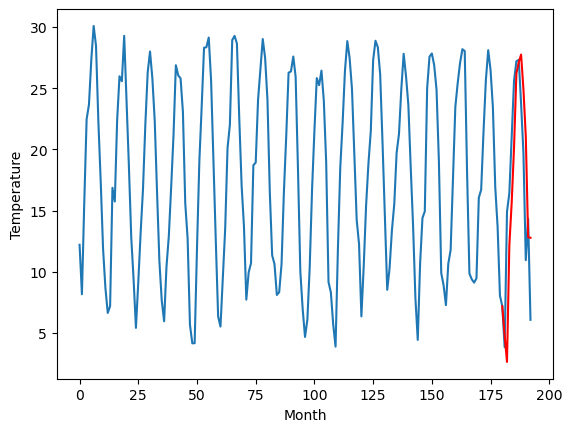

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		11.71		-1.16
12.78		9.56		-3.22
17.84		19.08		1.24
19.24		22.58		3.34
23.26		27.09		3.83
26.74		33.12		6.38
27.96		34.03		6.07
28.30		34.66		6.36
26.17		31.83		5.66
23.54		27.97		4.43
18.03		19.75		1.72
17.79		19.70		1.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 11.710293403863908, 9.562191597223283, 19.07522737145424, 22.578590742349625, 27.09490477204323, 33.11904799103737, 34.02736698746681, 34.661286226511, 31.82747232079506, 27.965941540002824, 19.753134838342667, 19.700752436220647]


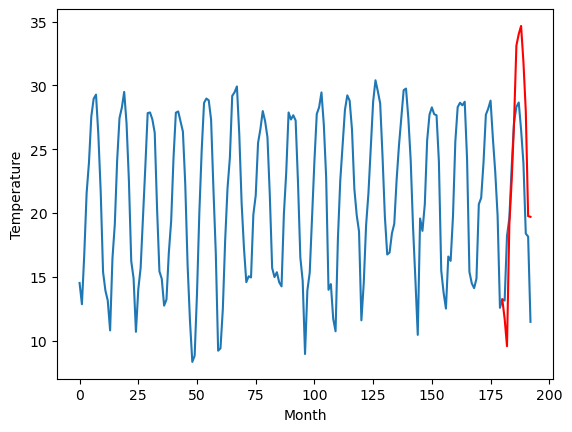

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.02		-1.32
16.20		11.87		-4.33
22.18		21.39		-0.79
23.82		24.89		1.07
27.80		29.40		1.60
31.94		35.43		3.49
33.70		36.34		2.64
33.98		36.97		2.99
30.41		34.14		3.73
26.53		30.28		3.75
18.17		22.06		3.89
20.35		22.01		1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 14.020293403863906, 11.872191597223281, 21.38522737145424, 24.888590742349624, 29.404904772043228, 35.429047991037365, 36.33736698746681, 36.971286226511, 34.13747327446937, 30.27594344735145, 22.063137699365612, 22.01075529724359]


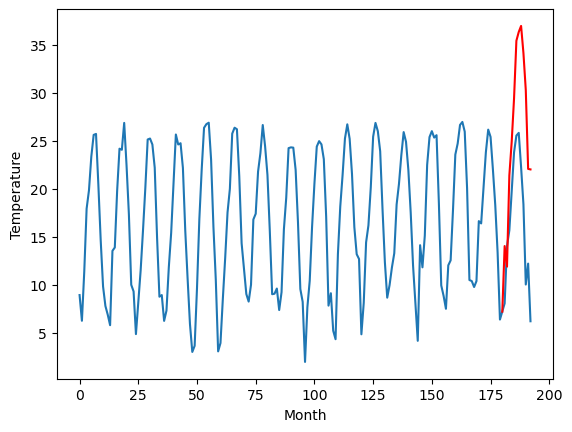

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		8.41		-0.59
7.43		6.26		-1.17
15.34		15.78		0.44
17.13		19.28		2.15
21.10		23.79		2.69
24.38		29.82		5.44
25.01		30.73		5.72
25.06		31.36		6.30
22.55		28.53		5.98
20.24		24.67		4.43
12.15		16.45		4.30
14.92		16.40		1.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 8.410293403863907, 6.262193504571915, 15.775231186151505, 19.278592649698258, 23.794902864694595, 29.819046083688736, 30.72736508011818, 31.36128431916237, 28.527471367120743, 24.66593748688698, 16.453130785226822, 16.4007483831048]


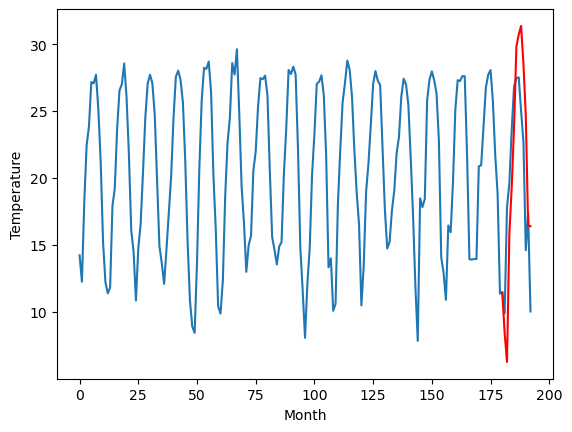

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.73		0.38
10.26		11.58		1.32
20.16		21.10		0.94
22.09		24.60		2.51
25.95		29.11		3.16
31.15		35.14		3.99
31.58		36.05		4.47
32.34		36.68		4.34
30.33		33.85		3.52
25.98		29.99		4.01
18.41		21.77		3.36
20.74		21.72		0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 13.73029143691063, 11.582191537618638, 21.09522540450096, 24.598584960699082, 29.11489517569542, 35.139038394689564, 36.04735739111901, 36.68127466320992, 33.84746075749398, 29.985928069353108, 21.77312136769295, 21.720735039114956]


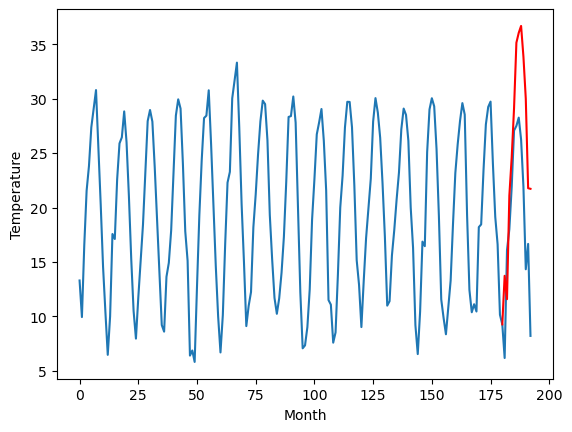

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.80		1.28
12.17		10.65		-1.52
17.07		20.17		3.10
20.44		23.67		3.23
23.95		28.18		4.23
28.52		34.21		5.69
30.51		35.12		4.61
30.99		35.75		4.76
27.98		32.92		4.94
24.38		29.06		4.68
16.21		20.84		4.63
17.26		20.79		3.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.800294387340546, 10.65219043493271, 20.1652281165123, 23.668591487407685, 28.18490551710129, 34.209048736095426, 35.11736773252487, 35.751288938522336, 32.917475032806394, 29.05594615936279, 20.84314041137695, 20.79075800925493]


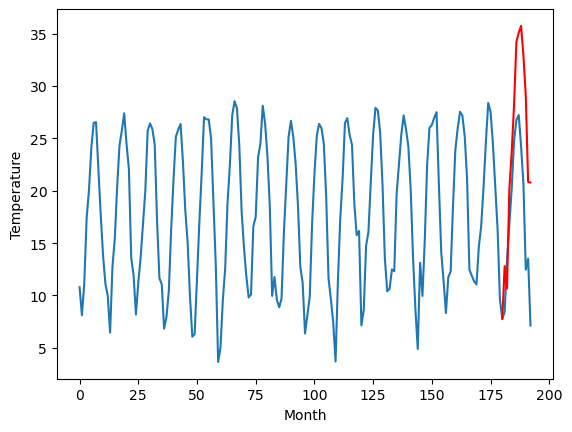

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		10.29		0.08
10.85		8.14		-2.71
17.83		17.66		-0.17
18.86		21.16		2.30
22.57		25.67		3.10
26.90		31.70		4.80
28.52		32.61		4.09
28.46		33.24		4.78
24.41		30.41		6.00
21.18		26.55		5.37
12.53		18.33		5.80
14.47		18.28		3.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.290293403863906, 8.142191597223281, 17.655227371454238, 21.158590742349624, 25.674904772043227, 31.699047991037368, 32.60736698746681, 33.241286226511, 30.407473274469375, 26.545943447351455, 18.333137699365615, 18.280755297243594]


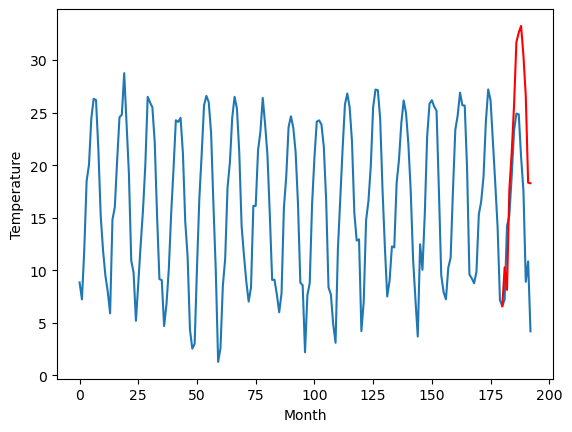

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.35		0.44
8.53		6.20		-2.33
15.05		15.72		0.67
18.68		19.22		0.54
21.70		23.73		2.03
26.49		29.76		3.27
28.61		30.67		2.06
28.56		31.30		2.74
24.05		28.47		4.42
20.20		24.61		4.41
10.70		16.39		5.69
12.76		16.34		3.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 8.350294387340545, 6.20219258069992, 15.715228354930877, 19.218591725826265, 23.73490575551987, 29.75904897451401, 30.667367970943452, 31.301287209987642, 28.467474257946016, 24.605944430828096, 16.39313772916794, 16.34075532704592]


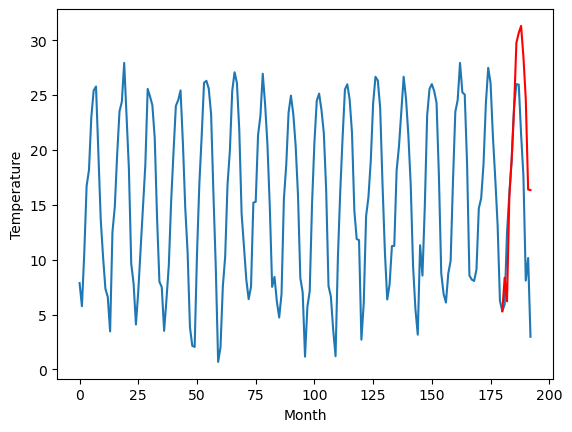

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		7.37		0.29
2.81		5.22		2.41
15.28		14.74		-0.54
17.88		18.24		0.36
22.57		22.75		0.18
28.76		28.78		0.02
29.33		29.69		0.36
29.27		30.32		1.05
25.53		27.49		1.96
21.57		23.63		2.06
11.53		15.41		3.88
13.33		15.36		2.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 7.370291436910629, 5.222191537618637, 14.735225404500962, 18.238584960699082, 22.75489279150963, 28.779032195806504, 29.687351192235948, 30.32126846432686, 27.487454558610917, 23.625921870470048, 15.413115168809892, 15.360728840231896]


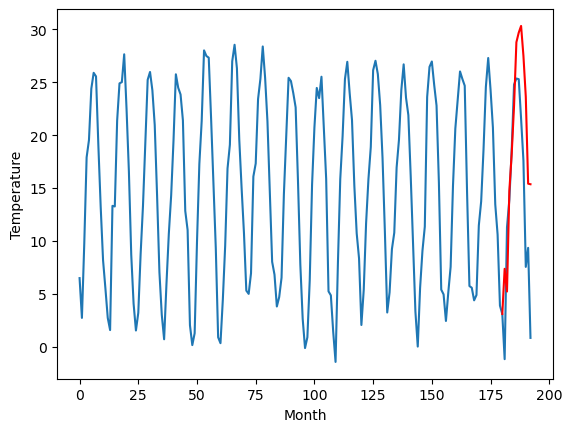

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.99		1.09
2.73		3.84		1.11
13.48		13.36		-0.12
16.54		16.86		0.32
21.01		21.37		0.36
27.49		27.40		-0.09
28.50		28.31		-0.19
29.10		28.94		-0.16
25.24		26.11		0.87
20.77		22.25		1.48
10.11		14.03		3.92
11.34		13.98		2.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 5.9902914369106295, 3.8421915376186373, 13.355229219198227, 16.85858877539635, 21.374898990392687, 27.399042209386828, 28.30736120581627, 28.94128044486046, 26.107467492818834, 22.245934804677965, 14.033128103017809, 13.980743737667801]


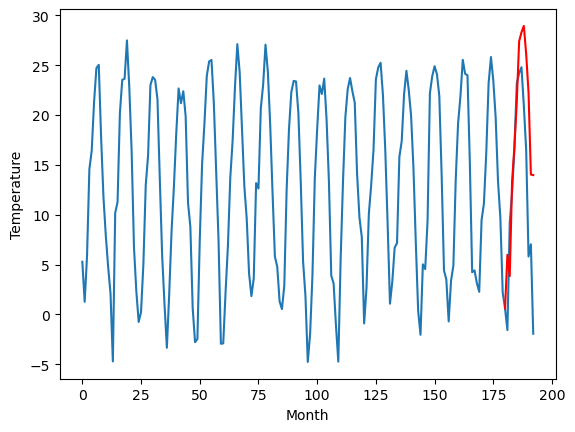

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		4.79		1.11
-0.63		2.64		3.27
11.10		12.16		1.06
15.07		15.66		0.59
20.22		20.17		-0.05
27.53		26.20		-1.33
28.12		27.11		-1.01
28.83		27.74		-1.09
24.78		24.91		0.13
20.43		21.05		0.62
9.57		12.83		3.26
8.67		12.78		4.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 4.790293403863907, 2.6421935045719147, 12.155231186151504, 15.658592649698257, 20.174902864694594, 26.199046083688735, 27.10736508011818, 27.741284319162368, 24.907471367120742, 21.045937486886977, 12.833130785226821, 12.7807483831048]


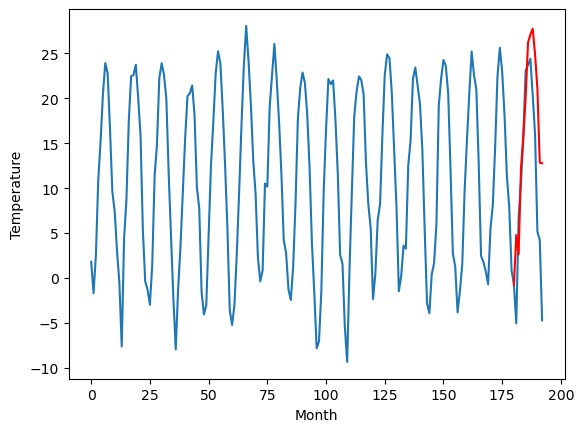

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.790291
1                 1   12.87  11.710293
2                 2   15.34  14.020293
3                 3    9.00   8.410293
4                 4   13.35  13.730291
5                 5   11.52  12.800294
6                 6   10.21  10.290293
7                 7    7.91   8.350294
8                 8    7.08   7.370291
9                 9    4.90   5.990291
10               10    3.68   4.790293


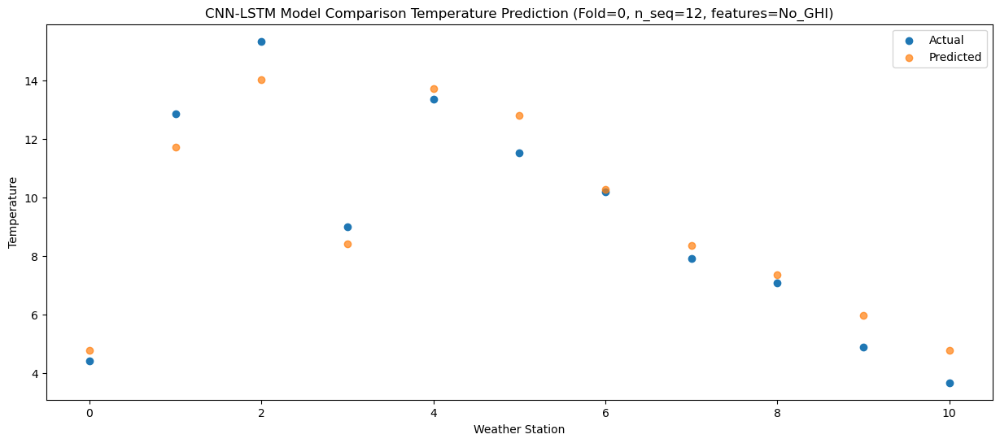

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   2.642192
1                 1   12.78   9.562192
2                 2   16.20  11.872192
3                 3    7.43   6.262194
4                 4   10.26  11.582192
5                 5   12.17  10.652190
6                 6   10.85   8.142192
7                 7    8.53   6.202193
8                 8    2.81   5.222192
9                 9    2.73   3.842192
10               10   -0.63   2.642194


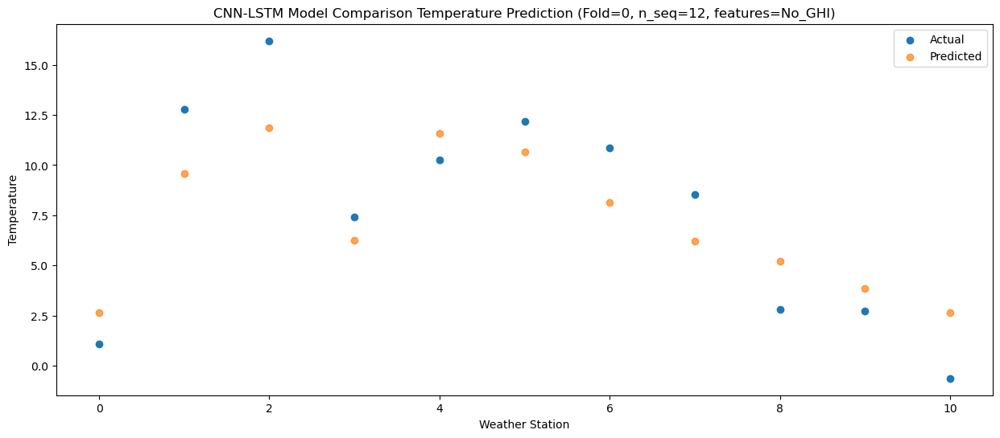

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  12.155225
1                 1   17.84  19.075227
2                 2   22.18  21.385227
3                 3   15.34  15.775231
4                 4   20.16  21.095225
5                 5   17.07  20.165228
6                 6   17.83  17.655227
7                 7   15.05  15.715228
8                 8   15.28  14.735225
9                 9   13.48  13.355229
10               10   11.10  12.155231


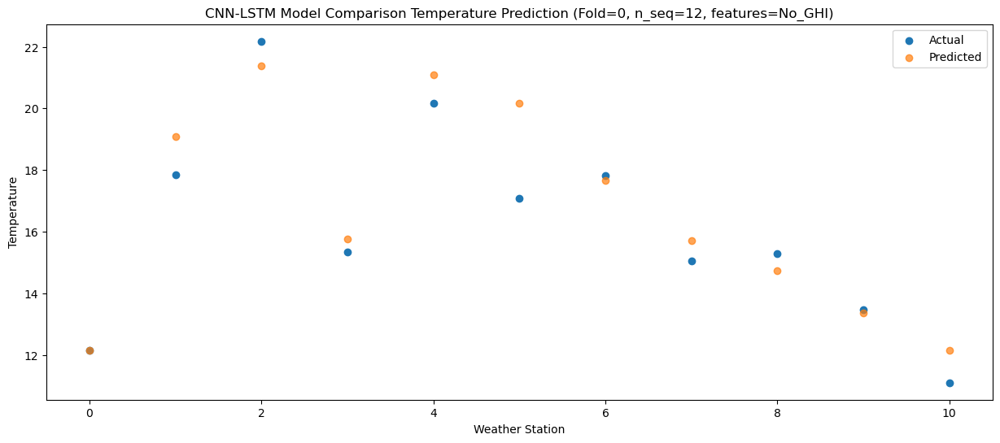

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.658585
1                 1   19.24  22.578591
2                 2   23.82  24.888591
3                 3   17.13  19.278593
4                 4   22.09  24.598585
5                 5   20.44  23.668591
6                 6   18.86  21.158591
7                 7   18.68  19.218592
8                 8   17.88  18.238585
9                 9   16.54  16.858589
10               10   15.07  15.658593


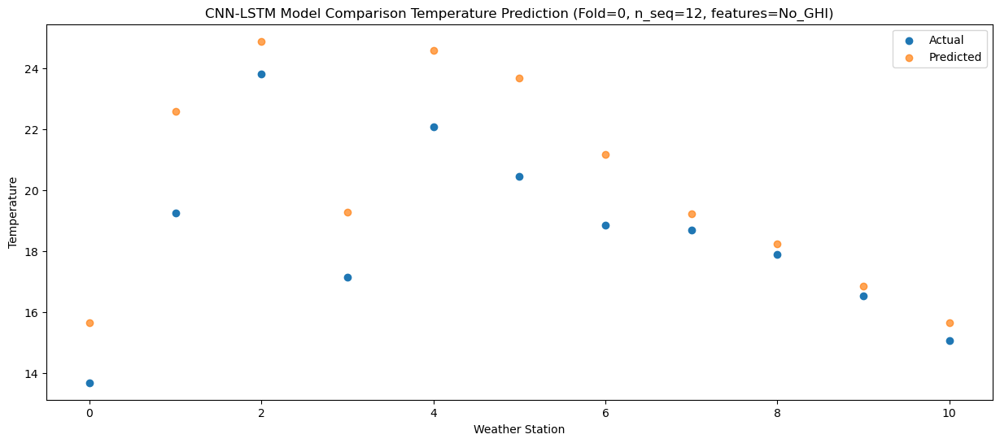

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  20.174893
1                 1   23.26  27.094905
2                 2   27.80  29.404905
3                 3   21.10  23.794903
4                 4   25.95  29.114895
5                 5   23.95  28.184906
6                 6   22.57  25.674905
7                 7   21.70  23.734906
8                 8   22.57  22.754893
9                 9   21.01  21.374899
10               10   20.22  20.174903


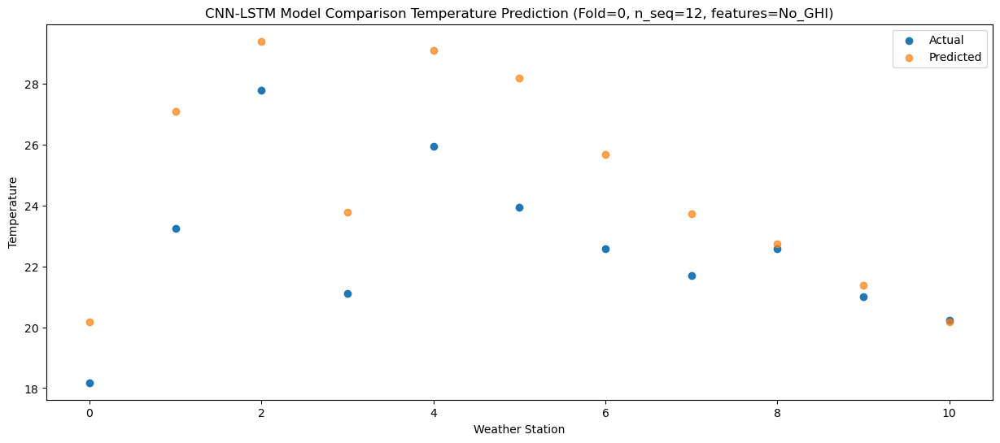

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  26.199036
1                 1   26.74  33.119048
2                 2   31.94  35.429048
3                 3   24.38  29.819046
4                 4   31.15  35.139038
5                 5   28.52  34.209049
6                 6   26.90  31.699048
7                 7   26.49  29.759049
8                 8   28.76  28.779032
9                 9   27.49  27.399042
10               10   27.53  26.199046


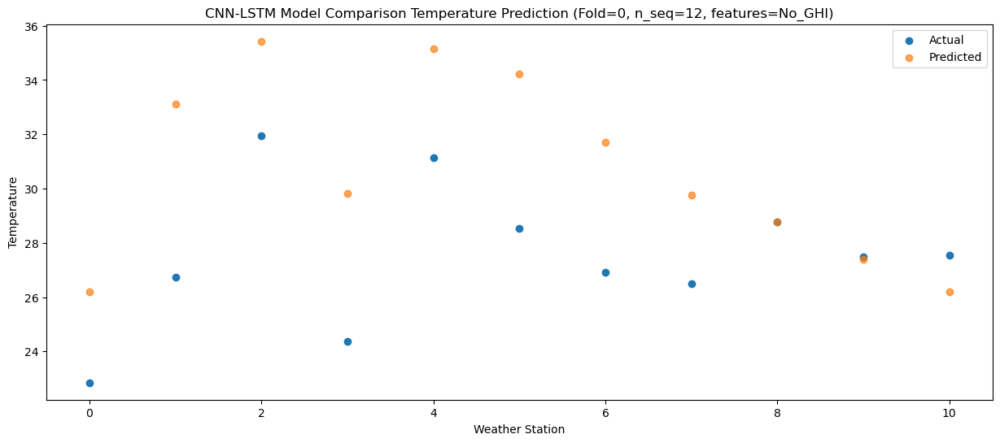

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44  27.107355
1                 1   27.96  34.027367
2                 2   33.70  36.337367
3                 3   25.01  30.727365
4                 4   31.58  36.047357
5                 5   30.51  35.117368
6                 6   28.52  32.607367
7                 7   28.61  30.667368
8                 8   29.33  29.687351
9                 9   28.50  28.307361
10               10   28.12  27.107365


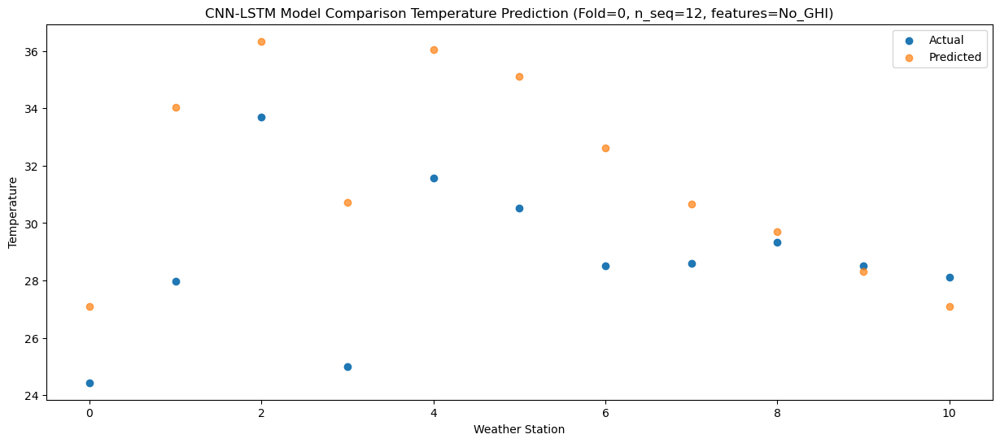

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  27.741272
1                 1   28.30  34.661286
2                 2   33.98  36.971286
3                 3   25.06  31.361284
4                 4   32.34  36.681275
5                 5   30.99  35.751289
6                 6   28.46  33.241286
7                 7   28.56  31.301287
8                 8   29.27  30.321268
9                 9   29.10  28.941280
10               10   28.83  27.741284


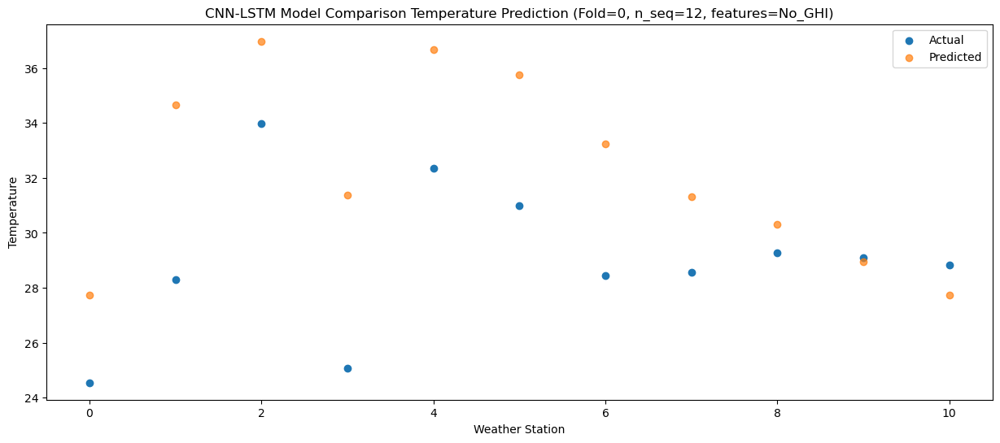

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  24.907457
1                 1   26.17  31.827472
2                 2   30.41  34.137473
3                 3   22.55  28.527471
4                 4   30.33  33.847461
5                 5   27.98  32.917475
6                 6   24.41  30.407473
7                 7   24.05  28.467474
8                 8   25.53  27.487455
9                 9   25.24  26.107467
10               10   24.78  24.907471


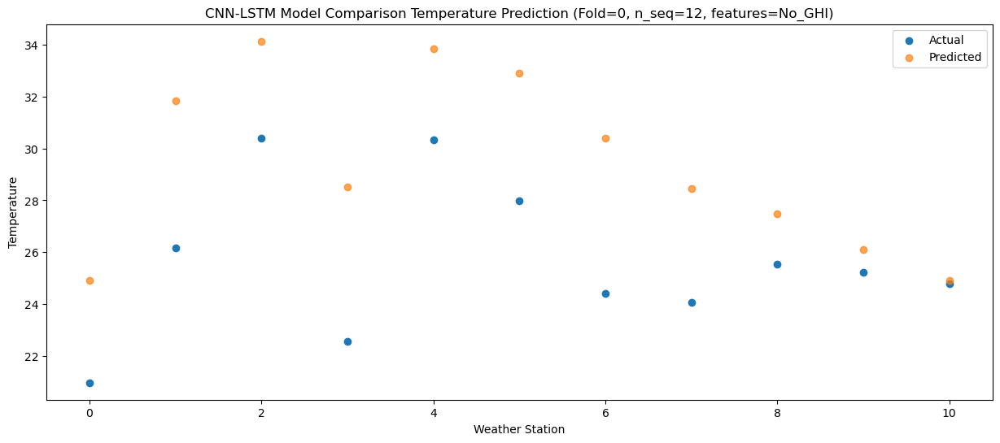

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  21.045925
1                 1   23.54  27.965942
2                 2   26.53  30.275943
3                 3   20.24  24.665937
4                 4   25.98  29.985928
5                 5   24.38  29.055946
6                 6   21.18  26.545943
7                 7   20.20  24.605944
8                 8   21.57  23.625922
9                 9   20.77  22.245935
10               10   20.43  21.045937


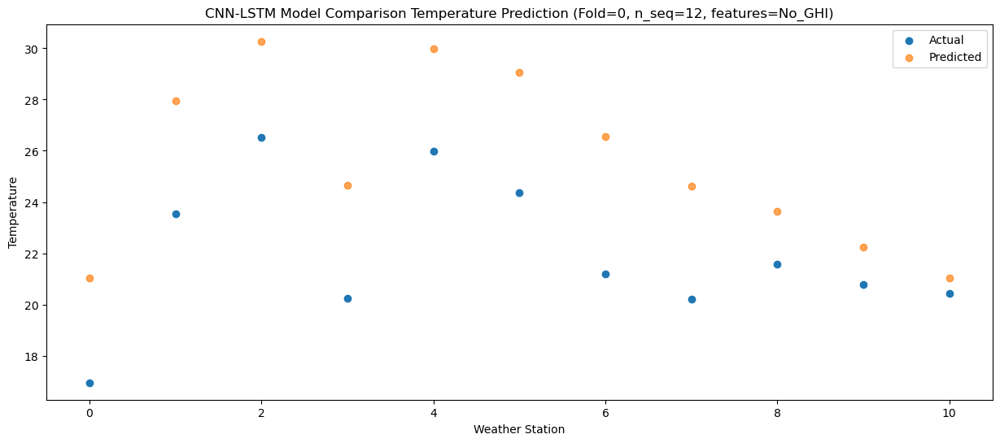

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19  12.833118
1                 1   18.03  19.753135
2                 2   18.17  22.063138
3                 3   12.15  16.453131
4                 4   18.41  21.773121
5                 5   16.21  20.843140
6                 6   12.53  18.333138
7                 7   10.70  16.393138
8                 8   11.53  15.413115
9                 9   10.11  14.033128
10               10    9.57  12.833131


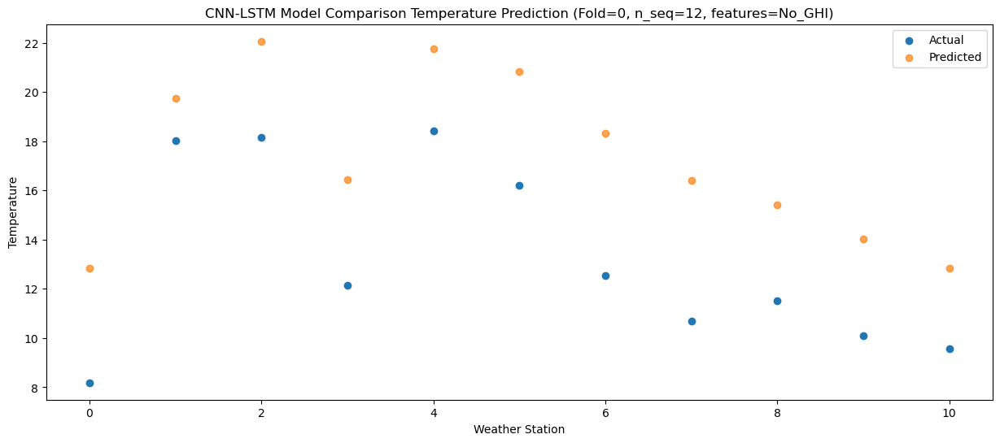

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57  12.780734
1                 1   17.79  19.700752
2                 2   20.35  22.010755
3                 3   14.92  16.400748
4                 4   20.74  21.720735
5                 5   17.26  20.790758
6                 6   14.47  18.280755
7                 7   12.76  16.340755
8                 8   13.33  15.360729
9                 9   11.34  13.980744
10               10    8.67  12.780748


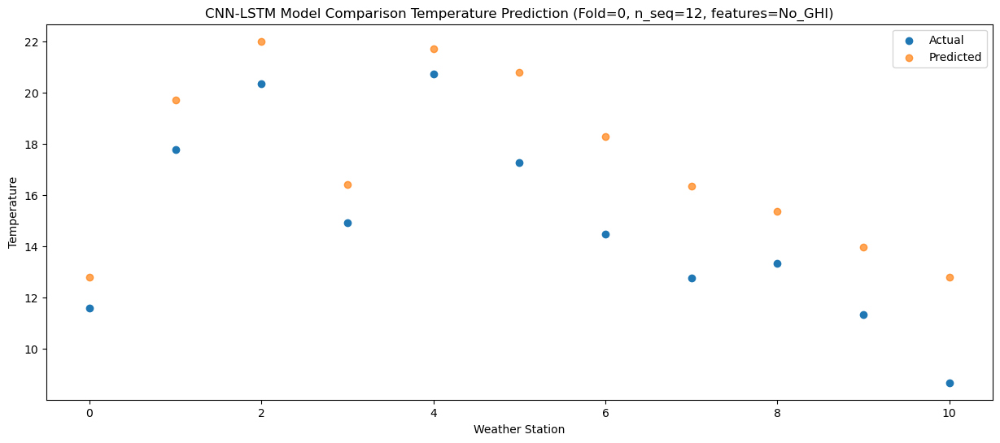

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 4.79029144 11.7102934  14.0202934   8.4102934  13.73029144 12.80029439
  10.2902934   8.35029439  7.37029144  5.99029144  4.7902934 ]
 [ 2.64219154  9.5621916  11

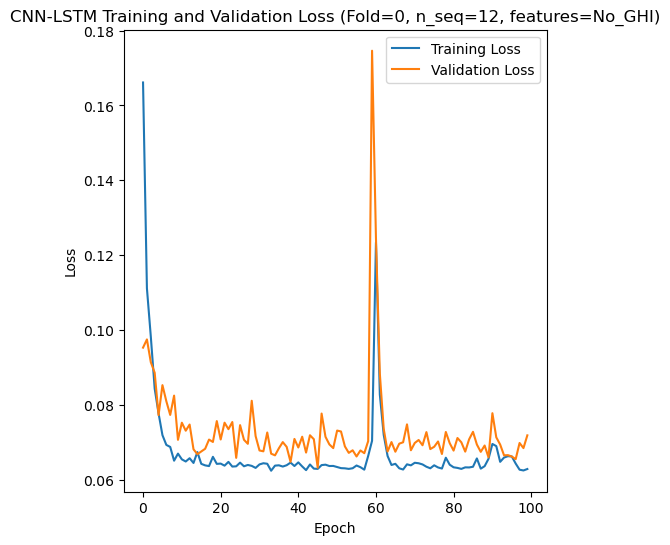

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 45s 285ms/step - loss: 0.2041 - accuracy: 0.3929 - mae: 0.1735 - rmse: 0.2041 - mape: 35.7037 - pearson: 0.4637 - val_loss: 0.1009 - val_accuracy: 0.8000 - val_mae: 0.0797 - val_rmse: 0.1009 - val_mape: 18.0738 - val_pearson: 0.7242
Epoch 2/100
84/84 [==============================] - 18s 211ms/step - loss: 0.1218 - accuracy: 0.5000 - mae: 0.0999 - rmse: 0.1218 - mape: 21.2925 - pearson: 0.6712 - val_loss: 0.1047 - val_accuracy: 0.8000 - val_mae: 0.0802 - val_rmse: 0.1047 - val_mape: 18.7605 - val_pearson: 0.6615
Epoch 3/100
84/84 [==============================] - 18s 221ms/step - loss: 0.1038 - accuracy: 0.6786 - mae: 0.0850 - rmse: 0.1038 - mape: 18.3467 - pearson: 0.7366

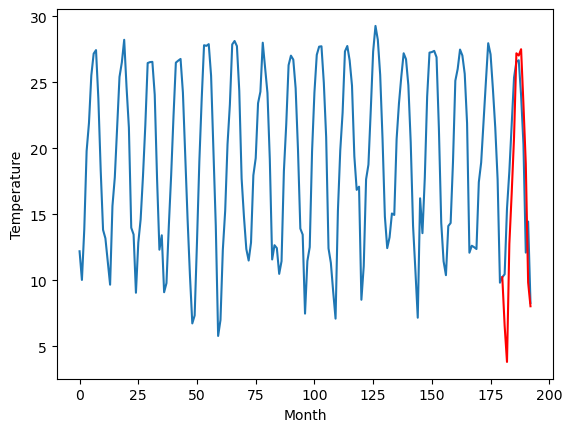

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		10.79		-1.21
12.66		8.06		-4.60
19.43		16.98		-2.45
21.57		20.83		-0.74
25.30		25.08		-0.22
29.44		31.43		1.99
30.82		31.26		0.44
31.09		31.74		0.65
27.35		27.59		0.24
23.57		23.07		-0.50
15.91		14.08		-1.83
17.54		12.28		-5.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 10.794345211982726, 8.063316178321838, 16.980531525611877, 20.829156947135925, 25.077867579460143, 31.427367758750915, 31.260107305645942, 31.737005737423896, 27.587963607907295, 23.0718913346529, 14.077345398068427, 12.27762213051319]


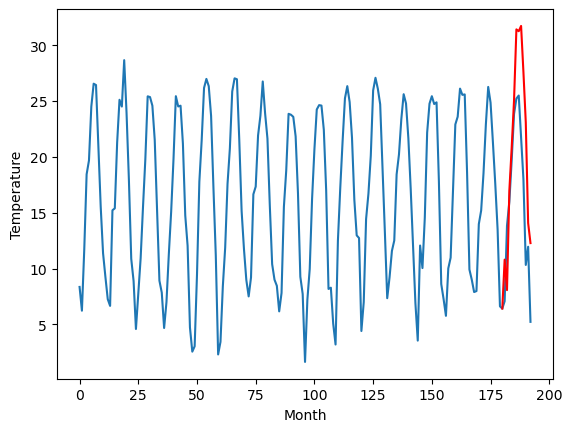

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		6.94		-1.83
9.26		4.21		-5.05
16.32		13.13		-3.19
17.72		16.98		-0.74
21.84		21.23		-0.61
25.72		27.58		1.86
26.49		27.41		0.92
27.15		27.89		0.74
24.13		23.74		-0.39
20.35		19.22		-1.13
12.61		10.23		-2.38
15.21		8.43		-6.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 6.944345211982727, 4.213316178321838, 13.130531525611877, 16.979156947135927, 21.227867579460145, 27.577367758750917, 27.410107305645944, 27.887005737423898, 23.737963607907297, 19.221891334652902, 10.22734539806843, 8.427622130513193]


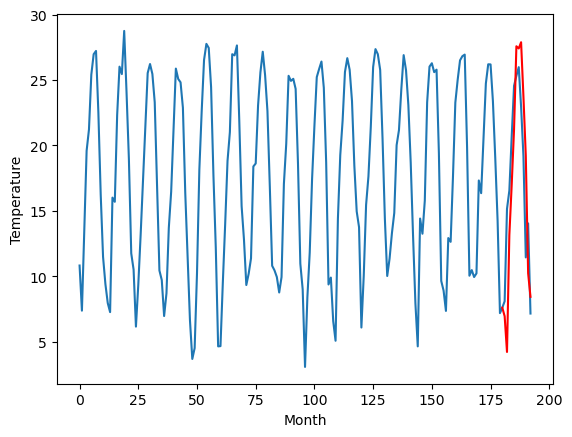

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.41		-1.31
9.13		6.68		-2.45
16.50		15.60		-0.90
18.84		19.45		0.61
22.73		23.70		0.97
26.62		30.05		3.43
26.50		29.88		3.38
27.47		30.36		2.89
24.46		26.21		1.75
21.77		21.69		-0.08
14.61		12.70		-1.91
17.98		10.90		-7.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 9.414345211982727, 6.683316178321839, 15.600531525611878, 19.449156947135926, 23.697867579460144, 30.047367758750916, 29.880107305645943, 30.357005737423897, 26.207963607907296, 21.6918913346529, 12.697345398068428, 10.897622130513192]


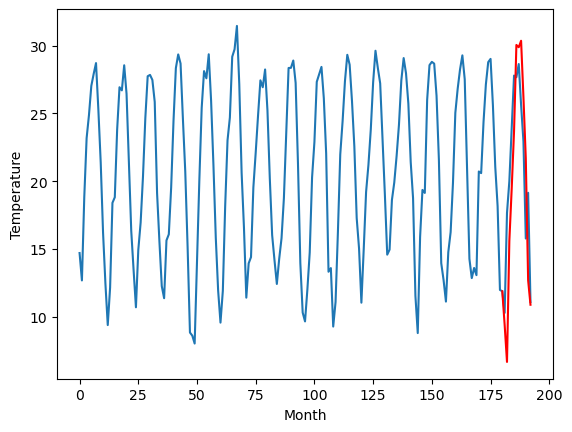

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.30		-1.40
13.00		10.57		-2.43
20.61		19.49		-1.12
22.91		23.34		0.43
27.03		27.59		0.56
30.50		33.94		3.44
30.59		33.77		3.18
31.56		34.25		2.69
27.98		30.10		2.12
24.94		25.58		0.64
17.39		16.59		-0.80
21.27		14.79		-6.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 13.304345211982728, 10.57331617832184, 19.49053152561188, 23.339156947135926, 27.587867579460145, 33.937367758750916, 33.77010730564594, 34.2470057374239, 30.097963607907296, 25.5818913346529, 16.58734539806843, 14.787622130513192]


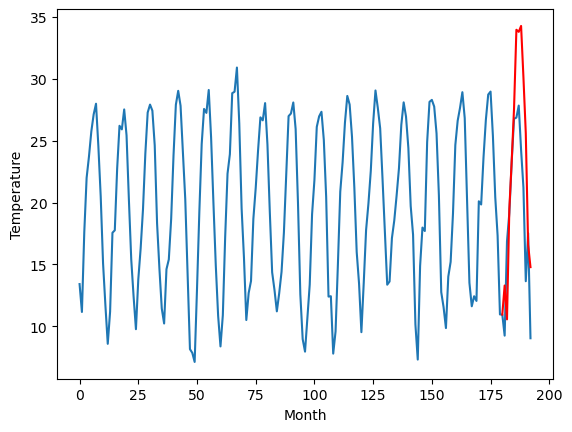

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.01		0.10
12.29		9.28		-3.01
19.63		18.20		-1.43
21.90		22.05		0.15
27.49		26.30		-1.19
31.76		32.65		0.89
31.10		32.48		1.38
30.51		32.96		2.45
30.15		28.81		-1.34
25.83		24.29		-1.54
19.36		15.30		-4.06
19.62		13.50		-6.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 12.014345211982727, 9.283316178321838, 18.20053152561188, 22.049156947135927, 26.297867579460146, 32.64736775875092, 32.480107305645944, 32.9570057374239, 28.807963607907297, 24.291891334652902, 15.29734539806843, 13.497622130513193]


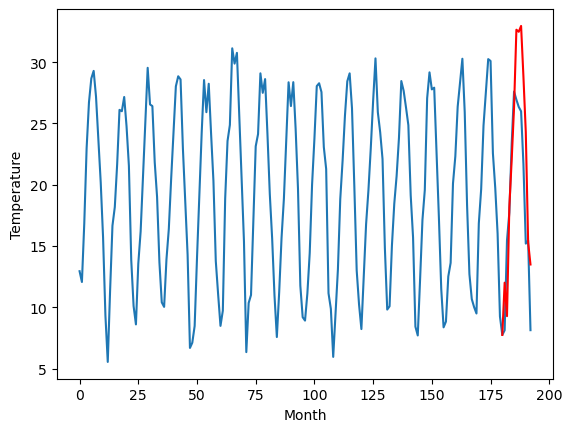

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		11.54		-1.21
13.53		8.81		-4.72
19.81		17.73		-2.08
22.38		21.58		-0.80
26.15		25.83		-0.32
30.16		32.18		2.02
31.52		32.01		0.49
31.78		32.49		0.71
28.45		28.34		-0.11
24.50		23.82		-0.68
16.90		14.83		-2.07
18.42		13.03		-5.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 11.544345211982726, 8.813316178321838, 17.730531525611877, 21.579156947135925, 25.827867579460143, 32.17736775875092, 32.010107305645946, 32.4870057374239, 28.337963607907298, 23.821891334652904, 14.82734539806843, 13.027622130513194]


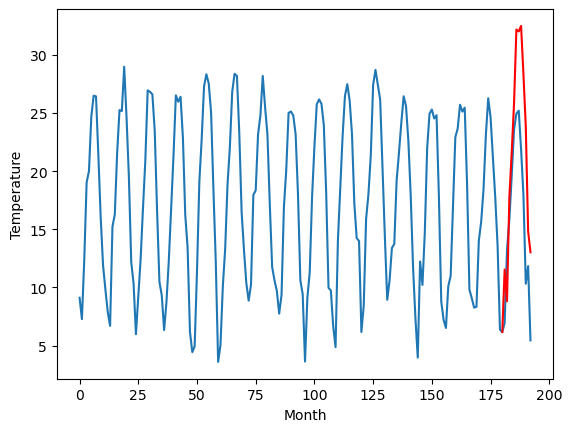

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		7.71		-1.10
5.81		4.98		-0.83
17.13		13.90		-3.23
18.84		17.75		-1.09
23.50		22.00		-1.50
29.58		28.35		-1.23
30.57		28.18		-2.39
31.79		28.66		-3.13
28.08		24.51		-3.57
22.88		19.99		-2.89
13.58		11.00		-2.58
15.99		9.20		-6.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 7.714345211982726, 4.983316178321838, 13.900531525611877, 17.749156947135923, 21.99786757946014, 28.347367758750913, 28.18010730564594, 28.657005737423894, 24.507963607907293, 19.991891334652898, 10.997345398068425, 9.197622130513189]


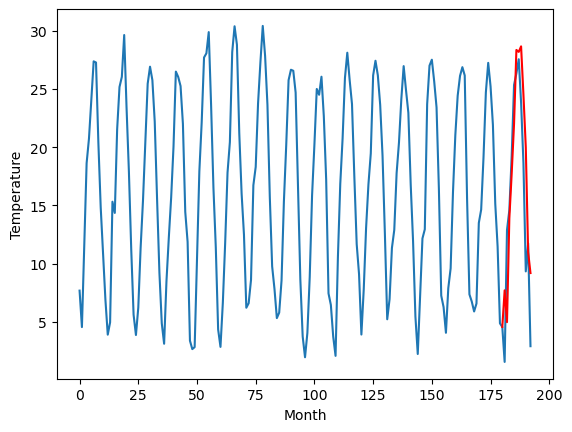

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.28		-1.06
2.56		3.55		0.99
15.12		12.47		-2.65
16.92		16.32		-0.60
21.73		20.57		-1.16
27.76		26.92		-0.84
29.27		26.75		-2.52
29.66		27.23		-2.43
27.15		23.08		-4.07
20.90		18.56		-2.34
13.15		9.57		-3.58
12.34		7.77		-4.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 6.284345211982727, 3.5533161783218388, 12.470531525611879, 16.319156947135927, 20.567867579460145, 26.917367758750917, 26.750107305645944, 27.227005737423898, 23.077963607907297, 18.561891334652902, 9.56734539806843, 7.7676221305131925]


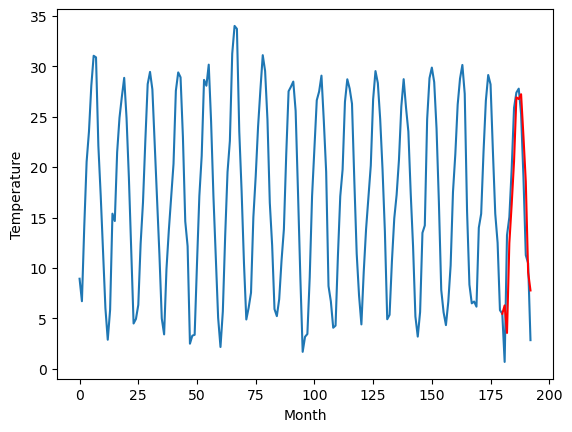

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.52		-1.52
4.67		4.79		0.12
15.38		13.71		-1.67
19.14		17.56		-1.58
23.69		21.81		-1.88
30.80		28.16		-2.64
31.47		27.99		-3.48
31.32		28.47		-2.85
29.37		24.32		-5.05
21.93		19.80		-2.13
15.68		10.81		-4.87
14.07		9.01		-5.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 7.524345211982727, 4.793316178321838, 13.710531525611877, 17.559156947135925, 21.807867579460144, 28.157367758750915, 27.990107305645942, 28.467005737423897, 24.317963607907295, 19.8018913346529, 10.807345398068428, 9.007622130513191]


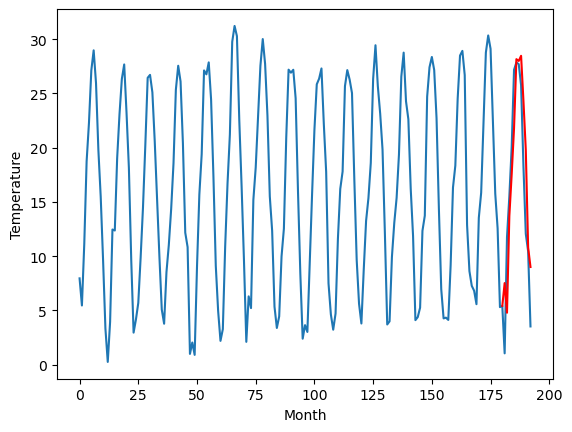

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.55		0.43
5.16		3.82		-1.34
12.38		12.74		0.36
17.03		16.59		-0.44
21.57		20.84		-0.73
27.66		27.19		-0.47
29.89		27.02		-2.87
29.67		27.50		-2.17
25.97		23.35		-2.62
21.55		18.83		-2.72
12.23		9.84		-2.39
11.46		8.04		-3.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 6.554345211982727, 3.8233161783218383, 12.740531525611878, 16.589156947135926, 20.837867579460145, 27.187367758750916, 27.020107305645944, 27.497005737423898, 23.347963607907296, 18.8318913346529, 9.837345398068429, 8.037622130513192]


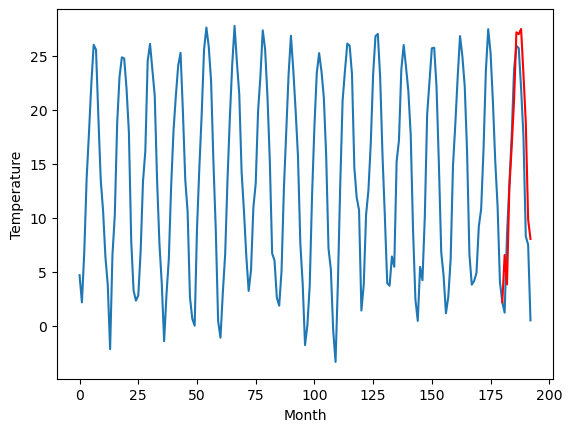

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   6.554345
1                 1   12.00  10.794345
2                 2    8.77   6.944345
3                 3   10.72   9.414345
4                 4   14.70  13.304345
5                 5   11.91  12.014345
6                 6   12.75  11.544345
7                 7    8.81   7.714345
8                 8    7.34   6.284345
9                 9    9.04   7.524345
10               10    6.12   6.554345


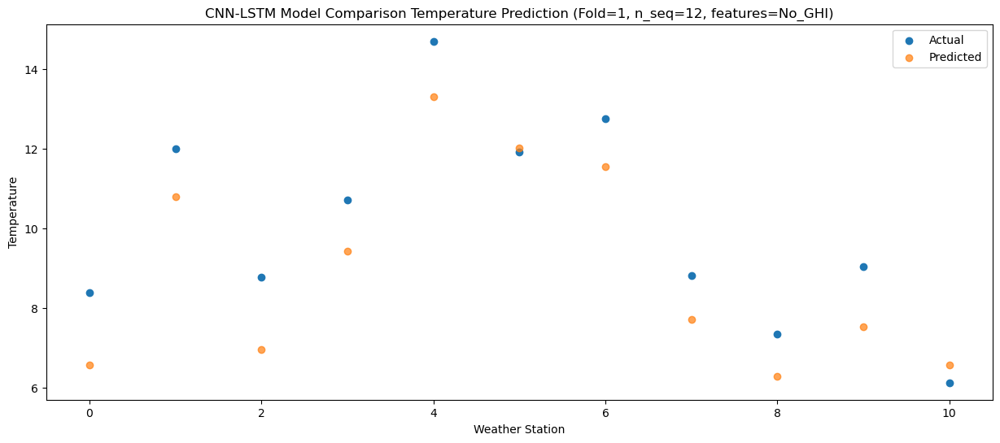

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   3.823316
1                 1   12.66   8.063316
2                 2    9.26   4.213316
3                 3    9.13   6.683316
4                 4   13.00  10.573316
5                 5   12.29   9.283316
6                 6   13.53   8.813316
7                 7    5.81   4.983316
8                 8    2.56   3.553316
9                 9    4.67   4.793316
10               10    5.16   3.823316


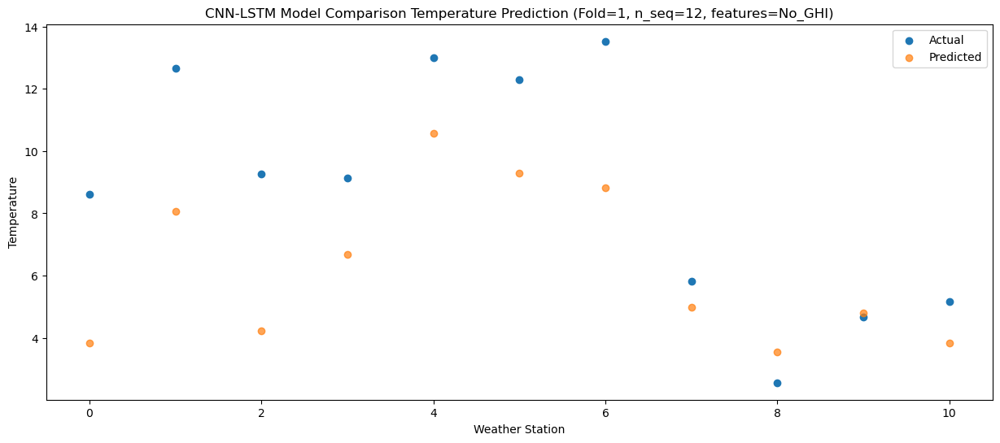

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  12.740532
1                 1   19.43  16.980532
2                 2   16.32  13.130532
3                 3   16.50  15.600532
4                 4   20.61  19.490532
5                 5   19.63  18.200532
6                 6   19.81  17.730532
7                 7   17.13  13.900532
8                 8   15.12  12.470532
9                 9   15.38  13.710532
10               10   12.38  12.740532


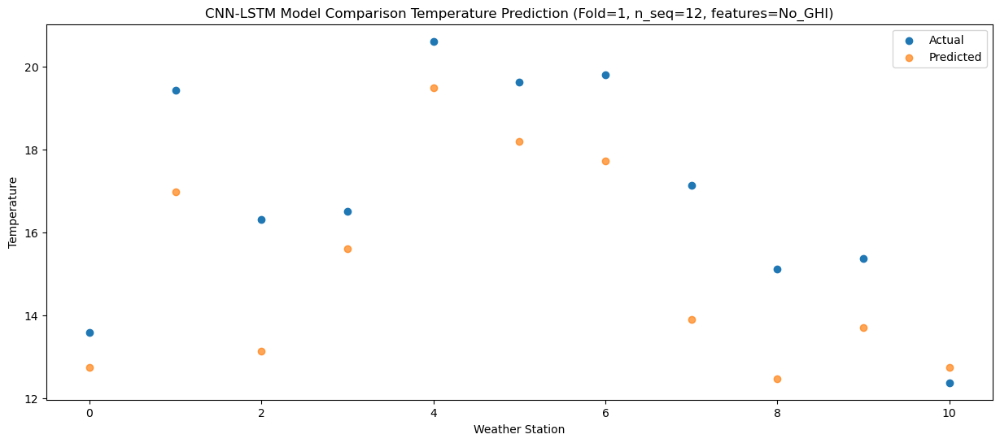

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  16.589157
1                 1   21.57  20.829157
2                 2   17.72  16.979157
3                 3   18.84  19.449157
4                 4   22.91  23.339157
5                 5   21.90  22.049157
6                 6   22.38  21.579157
7                 7   18.84  17.749157
8                 8   16.92  16.319157
9                 9   19.14  17.559157
10               10   17.03  16.589157


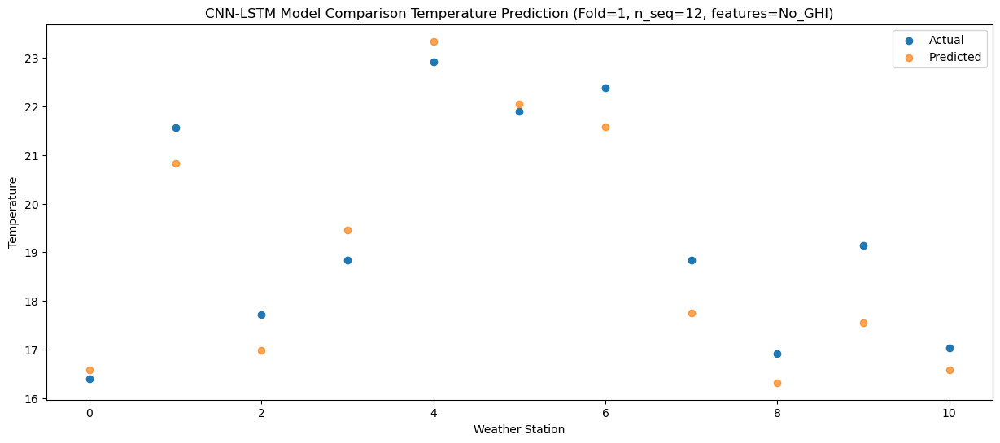

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.837868
1                 1   25.30  25.077868
2                 2   21.84  21.227868
3                 3   22.73  23.697868
4                 4   27.03  27.587868
5                 5   27.49  26.297868
6                 6   26.15  25.827868
7                 7   23.50  21.997868
8                 8   21.73  20.567868
9                 9   23.69  21.807868
10               10   21.57  20.837868


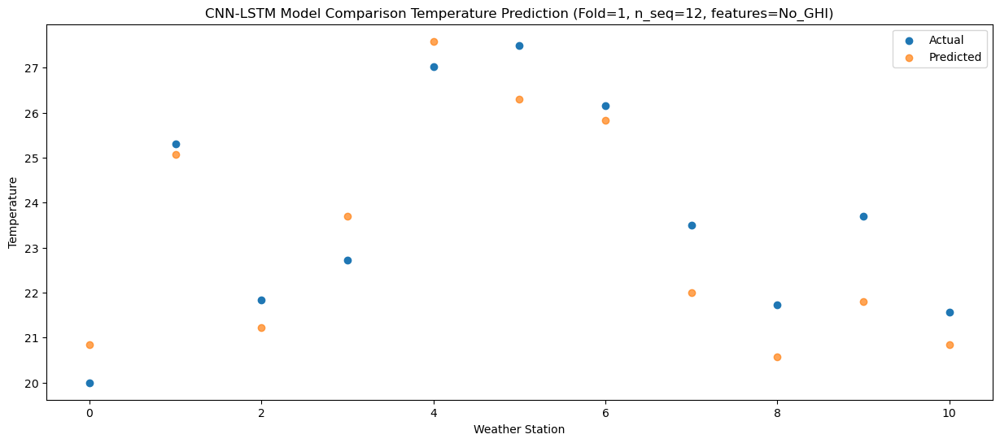

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  27.187368
1                 1   29.44  31.427368
2                 2   25.72  27.577368
3                 3   26.62  30.047368
4                 4   30.50  33.937368
5                 5   31.76  32.647368
6                 6   30.16  32.177368
7                 7   29.58  28.347368
8                 8   27.76  26.917368
9                 9   30.80  28.157368
10               10   27.66  27.187368


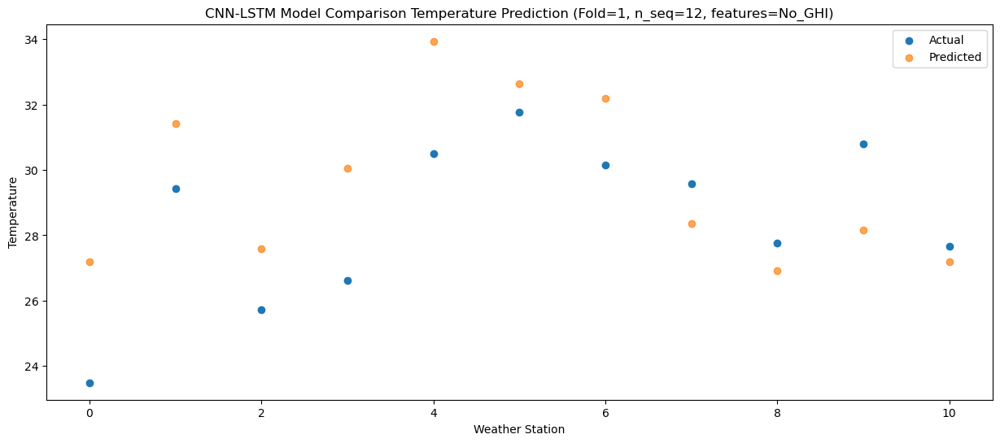

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  27.020107
1                 1   30.82  31.260107
2                 2   26.49  27.410107
3                 3   26.50  29.880107
4                 4   30.59  33.770107
5                 5   31.10  32.480107
6                 6   31.52  32.010107
7                 7   30.57  28.180107
8                 8   29.27  26.750107
9                 9   31.47  27.990107
10               10   29.89  27.020107


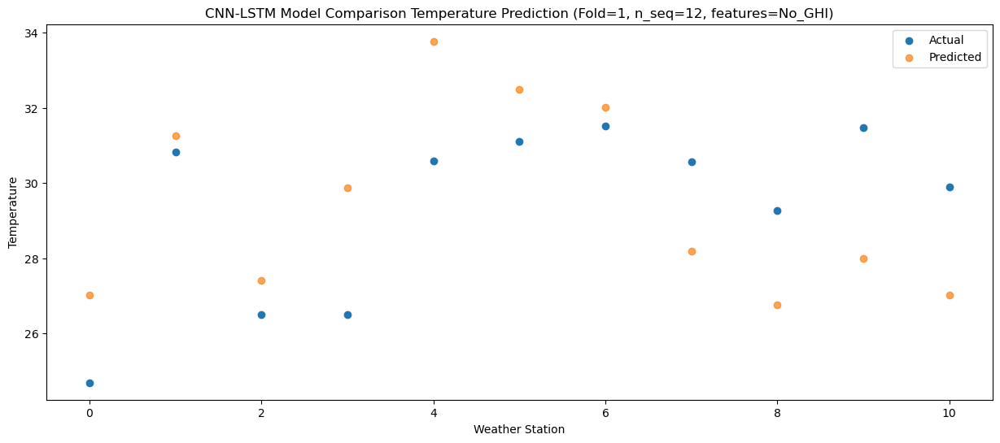

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  27.497006
1                 1   31.09  31.737006
2                 2   27.15  27.887006
3                 3   27.47  30.357006
4                 4   31.56  34.247006
5                 5   30.51  32.957006
6                 6   31.78  32.487006
7                 7   31.79  28.657006
8                 8   29.66  27.227006
9                 9   31.32  28.467006
10               10   29.67  27.497006


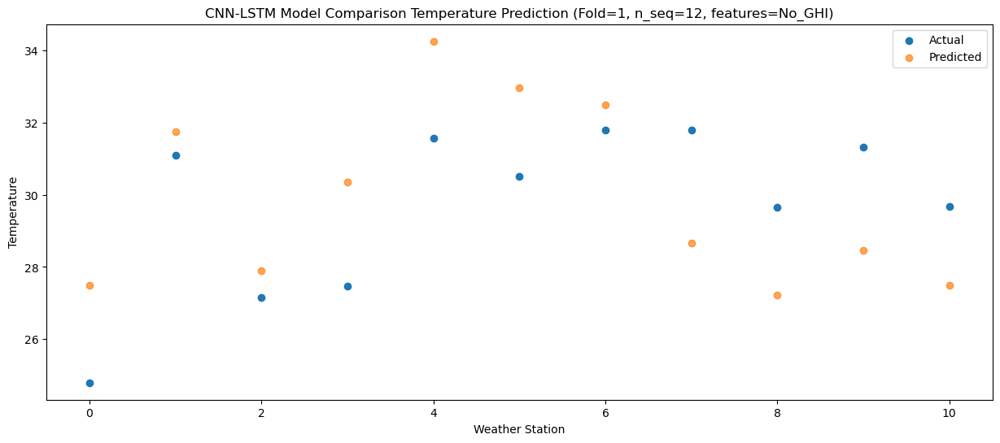

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  23.347964
1                 1   27.35  27.587964
2                 2   24.13  23.737964
3                 3   24.46  26.207964
4                 4   27.98  30.097964
5                 5   30.15  28.807964
6                 6   28.45  28.337964
7                 7   28.08  24.507964
8                 8   27.15  23.077964
9                 9   29.37  24.317964
10               10   25.97  23.347964


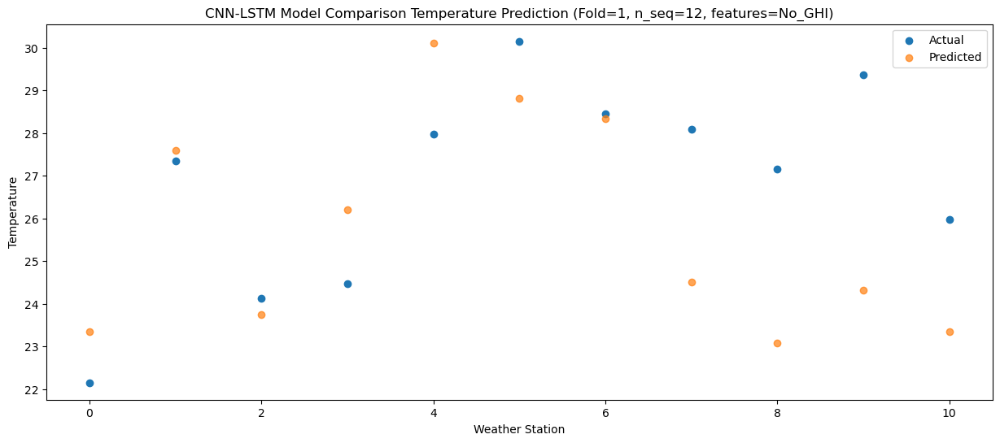

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  18.831891
1                 1   23.57  23.071891
2                 2   20.35  19.221891
3                 3   21.77  21.691891
4                 4   24.94  25.581891
5                 5   25.83  24.291891
6                 6   24.50  23.821891
7                 7   22.88  19.991891
8                 8   20.90  18.561891
9                 9   21.93  19.801891
10               10   21.55  18.831891


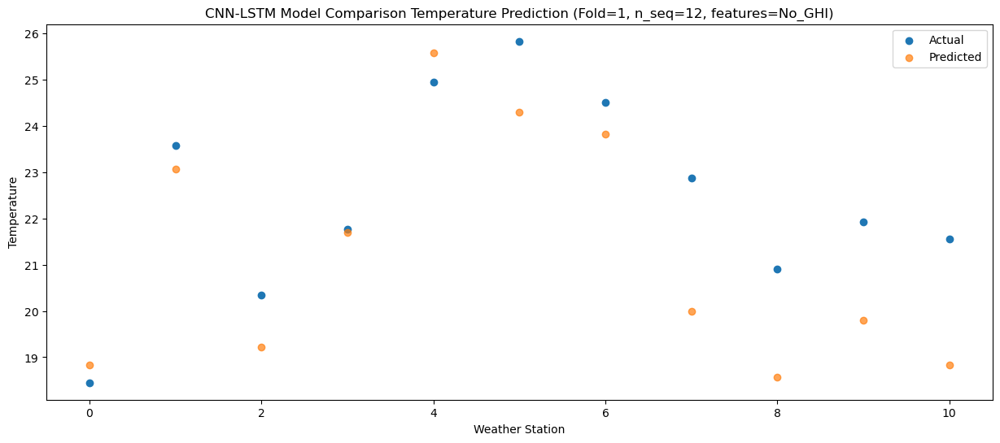

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24   9.837345
1                 1   15.91  14.077345
2                 2   12.61  10.227345
3                 3   14.61  12.697345
4                 4   17.39  16.587345
5                 5   19.36  15.297345
6                 6   16.90  14.827345
7                 7   13.58  10.997345
8                 8   13.15   9.567345
9                 9   15.68  10.807345
10               10   12.23   9.837345


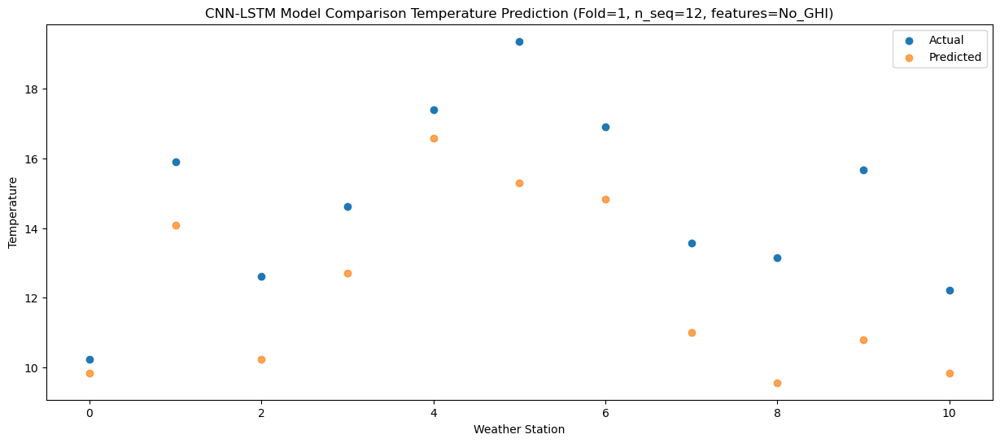

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59   8.037622
1                 1   17.54  12.277622
2                 2   15.21   8.427622
3                 3   17.98  10.897622
4                 4   21.27  14.787622
5                 5   19.62  13.497622
6                 6   18.42  13.027622
7                 7   15.99   9.197622
8                 8   12.34   7.767622
9                 9   14.07   9.007622
10               10   11.46   8.037622


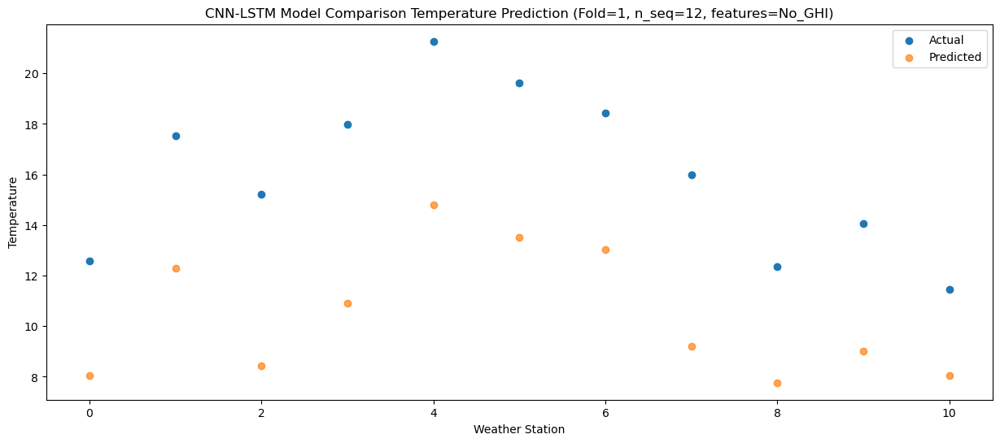

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 6.55434521 10.79434521  6.94434521  9.41434521 13.30434521 12.01434521
  11.54434521  7.71434521  6.28434521  7.52434521  6.55434521]
 [ 3.82331618  8.06331618  4

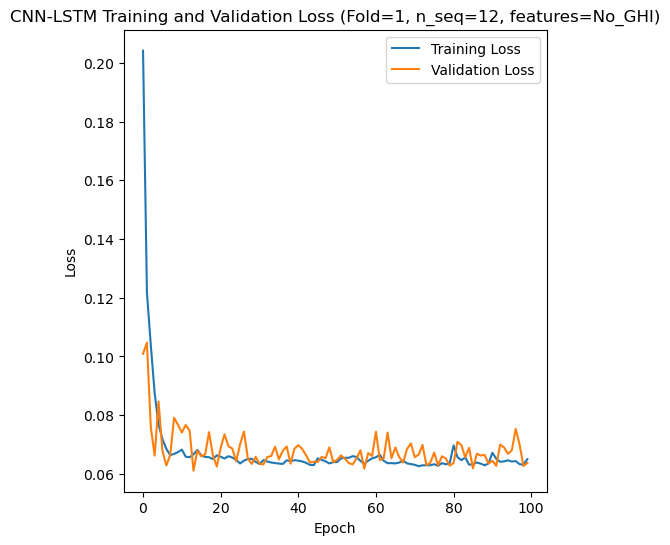

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 45s 283ms/step - loss: 0.1850 - accuracy: 0.4524 - mae: 0.1549 - rmse: 0.1850 - mape: 33.0070 - pearson: 0.5211 - val_loss: 0.1977 - val_accuracy: 0.9000 - val_mae: 0.1796 - val_rmse: 0.1977 - val_mape: 41.1056 - val_pearson: 0.7869
Epoch 2/100
84/84 [==============================] - 17s 206ms/step - loss: 0.1234 - accuracy: 0.5833 - mae: 0.1003 - rmse: 0.1234 - mape: 21.1797 - pearson: 0.6612 - val_loss: 0.0604 - val_accuracy: 0.9000 - val_mae: 0.0456 - val_rmse: 0.0604 - val_mape: 9.9772 - val_pearson: 0.9058
Epoch 3/100
84/84 [==============================] - 18s 209ms/step - loss: 0.0933 - accuracy: 0.6190 - mae: 0.0751 - rmse: 0.0933 - mape: 16.2552 - pearson: 0.7644 

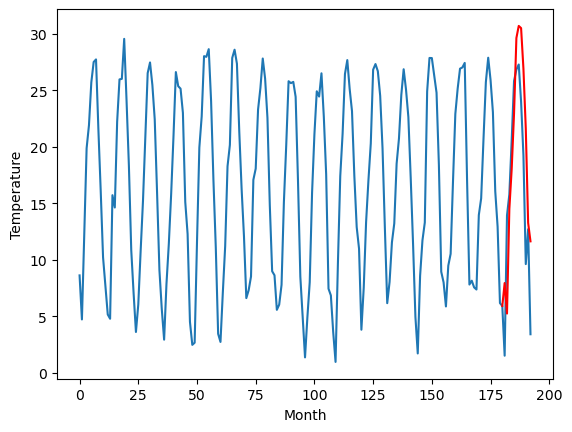

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		7.97		-0.56
4.49		5.27		0.78
14.68		14.53		-0.15
18.44		18.07		-0.37
23.62		22.99		-0.63
30.87		29.67		-1.20
31.56		30.73		-0.83
32.32		30.54		-1.78
30.08		26.94		-3.14
21.82		21.64		-0.18
15.11		13.30		-1.81
12.72		11.66		-1.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 7.971895561218261, 5.271021709442138, 14.525849208831787, 18.074927673339843, 22.98691593170166, 29.665908679962158, 30.73488555908203, 30.543376401662826, 26.94259257674217, 21.63531585097313, 13.299836114645004, 11.664882019758224]


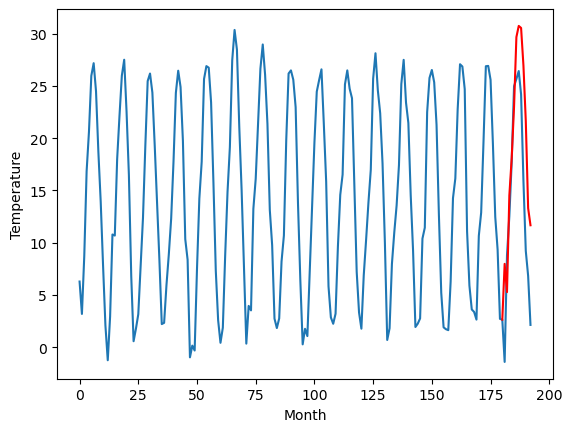

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		5.64		-1.30
9.67		2.94		-6.73
11.48		12.20		0.72
13.29		15.74		2.45
16.87		20.66		3.79
18.09		27.34		9.25
18.88		28.40		9.52
18.93		28.21		9.28
17.65		24.61		6.96
16.51		19.31		2.80
9.66		10.97		1.31
10.56		9.33		-1.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 5.641895561218262, 2.9410226631164553, 12.195850162506105, 15.744928627014161, 20.656916885375978, 27.335909633636476, 28.40488651275635, 28.213377355337144, 24.61259353041649, 19.305316804647447, 10.969837068319322, 9.334882973432542]


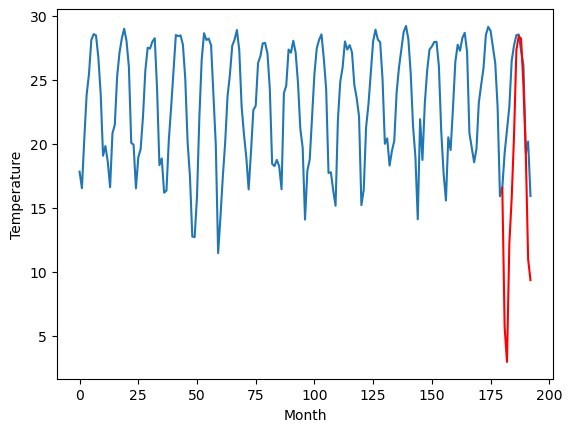

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		17.18		2.44
14.76		14.48		-0.28
18.87		23.74		4.87
23.37		27.28		3.91
28.63		32.20		3.57
34.20		38.88		4.68
36.20		39.94		3.74
37.26		39.75		2.49
34.09		36.15		2.06
30.26		30.85		0.59
22.18		22.51		0.33
20.26		20.87		0.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 17.181895561218262, 14.481022663116455, 23.735850162506104, 27.28492862701416, 32.19691688537598, 38.875909633636475, 39.94488651275635, 39.75337735533714, 36.15259353041649, 30.845316804647446, 22.50983706831932, 20.874881900548935]


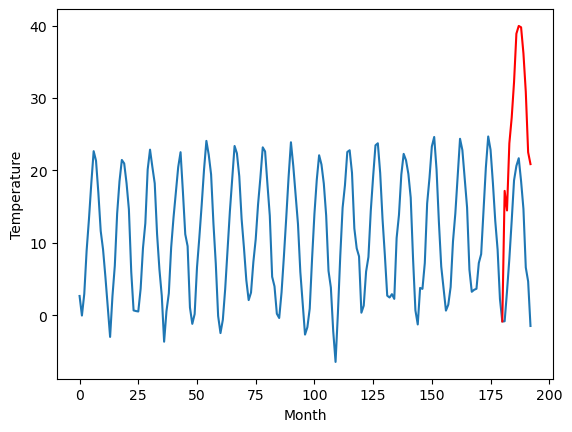

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.04		-0.99
2.29		-0.66		-2.95
9.62		8.60		-1.02
10.49		12.14		1.65
14.96		17.06		2.10
18.44		23.74		5.30
19.03		24.80		5.77
19.20		24.61		5.41
16.66		21.01		4.35
13.92		15.71		1.79
5.65		7.37		1.72
9.06		5.73		-3.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 2.041895561218262, -0.6589773368835448, 8.595850162506103, 12.14492862701416, 17.056916885375976, 23.735909633636474, 24.804886512756347, 24.613377355337143, 21.01259353041649, 15.705316804647445, 7.36983706831932, 5.734882973432541]


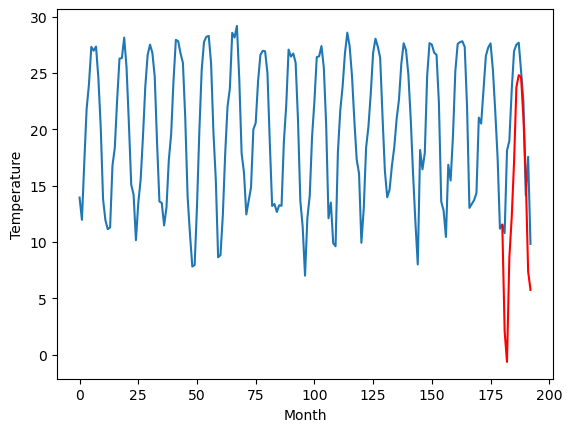

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.30		-0.05
11.00		10.60		-0.40
19.38		19.86		0.48
21.50		23.40		1.90
25.54		28.32		2.78
30.09		35.00		4.91
30.17		36.06		5.89
31.28		35.87		4.59
28.54		32.27		3.73
25.24		26.97		1.73
17.60		18.63		1.03
20.84		16.99		-3.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 13.301894607543945, 10.601020755767822, 19.85584825515747, 23.404926719665525, 28.31691497802734, 34.99590772628784, 36.06488460540771, 35.87337544798851, 32.272591623067854, 26.96531489729881, 18.629833253622053, 16.994879158735273]


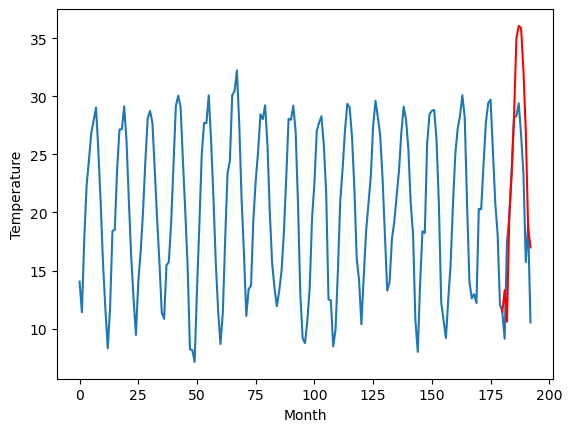

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.41		0.06
10.24		10.71		0.47
20.61		19.97		-0.64
22.31		23.51		1.20
26.39		28.43		2.04
31.95		35.11		3.16
32.84		36.17		3.33
33.40		35.98		2.58
31.13		32.38		1.25
26.62		27.08		0.46
18.65		18.74		0.09
20.94		17.10		-3.84
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.411895561218262, 10.711022663116456, 19.965850162506104, 23.51492862701416, 28.426916885375977, 35.10590963363647, 36.174886512756345, 35.98337735533714, 32.382593530416486, 27.075316804647443, 18.739837068319318, 17.104882973432538]


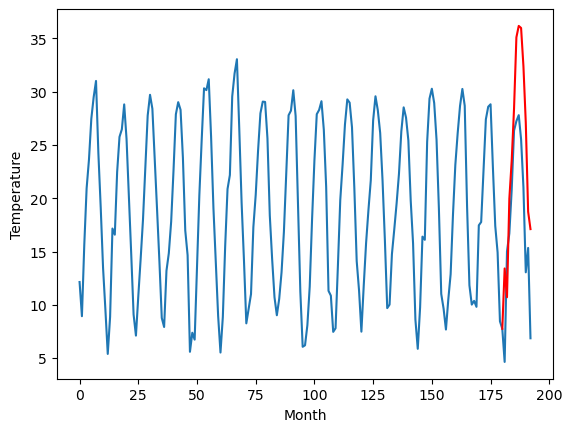

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		11.50		-1.18
15.60		8.80		-6.80
18.70		18.06		-0.64
25.36		21.60		-3.76
30.37		26.52		-3.85
35.36		33.20		-2.16
34.16		34.26		0.10
33.64		34.07		0.43
31.46		30.47		-0.99
24.90		25.17		0.27
19.50		16.83		-2.67
16.15		15.19		-0.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 11.501895561218262, 8.801022663116456, 18.055850162506104, 21.60492862701416, 26.516916885375977, 33.195909633636475, 34.26488651275635, 34.07337735533714, 30.47259353041649, 25.165316804647446, 16.82983516097069, 15.194881066083909]


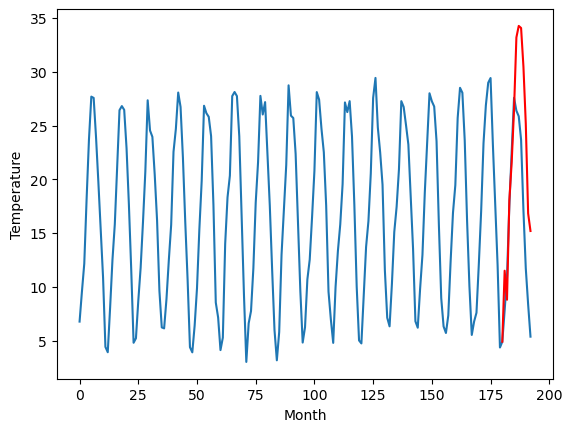

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		6.13		-0.58
5.79		3.43		-2.36
5.39		12.69		7.30
9.25		16.23		6.98
11.47		21.15		9.68
15.71		27.83		12.12
18.69		28.89		10.20
18.29		28.70		10.41
16.51		25.10		8.59
11.53		19.80		8.27
10.27		11.46		1.19
3.76		9.82		6.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 6.131895561218261, 3.4310226631164547, 12.685850162506103, 16.23492862701416, 21.146916885375976, 27.825909633636474, 28.894886512756347, 28.703377355337143, 25.102593530416488, 19.79531775832176, 11.459836114645004, 9.824882019758224]


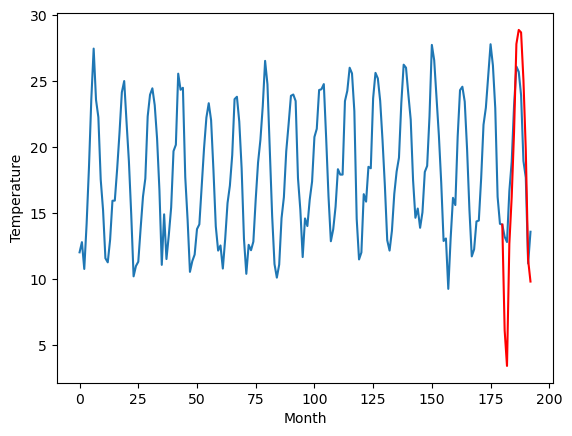

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.40		-0.23
12.13		8.70		-3.43
19.01		17.96		-1.05
21.80		21.50		-0.30
25.82		26.42		0.60
30.11		33.10		2.99
31.68		34.16		2.48
31.77		33.97		2.20
27.66		30.37		2.71
24.38		25.07		0.69
15.47		16.73		1.26
17.39		15.09		-2.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 11.401894607543944, 8.701020755767821, 17.95584825515747, 21.504926719665526, 26.416914978027343, 33.09590772628784, 34.164884605407714, 33.97337544798851, 30.372591623067855, 25.065314897298812, 16.729833253622054, 15.094878085851668]


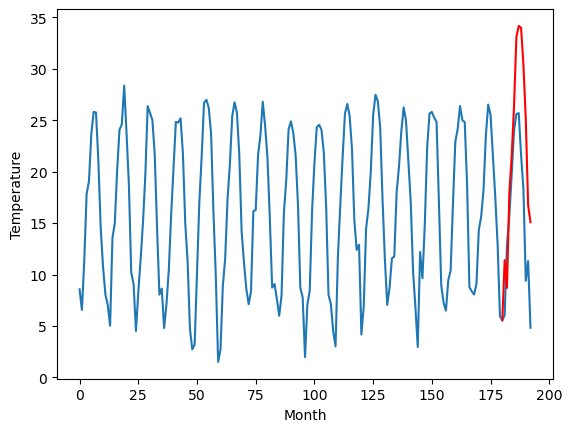

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		7.93		-0.97
10.25		5.23		-5.02
16.46		14.49		-1.97
18.43		18.03		-0.40
23.34		22.95		-0.39
28.75		29.63		0.88
30.06		30.69		0.63
30.14		30.50		0.36
25.65		26.90		1.25
21.89		21.60		-0.29
11.67		13.26		1.59
13.77		11.62		-2.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 7.931895561218262, 5.231022663116455, 14.485850162506104, 18.03492862701416, 22.946916885375977, 29.625909633636475, 30.694886512756348, 30.503377355337143, 26.90259353041649, 21.595316804647446, 13.259837068319321, 11.624881900548935]


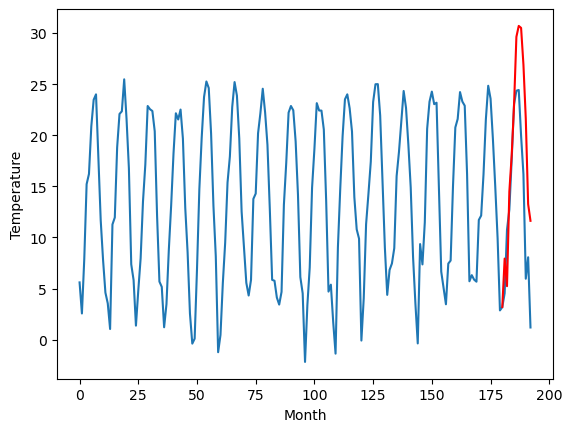

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   7.931896
1                 1    8.53   7.971896
2                 2    6.94   5.641896
3                 3   14.74  17.181896
4                 4    3.03   2.041896
5                 5   13.35  13.301895
6                 6   13.35  13.411896
7                 7   12.68  11.501896
8                 8    6.71   6.131896
9                 9   11.63  11.401895
10               10    8.90   7.931896


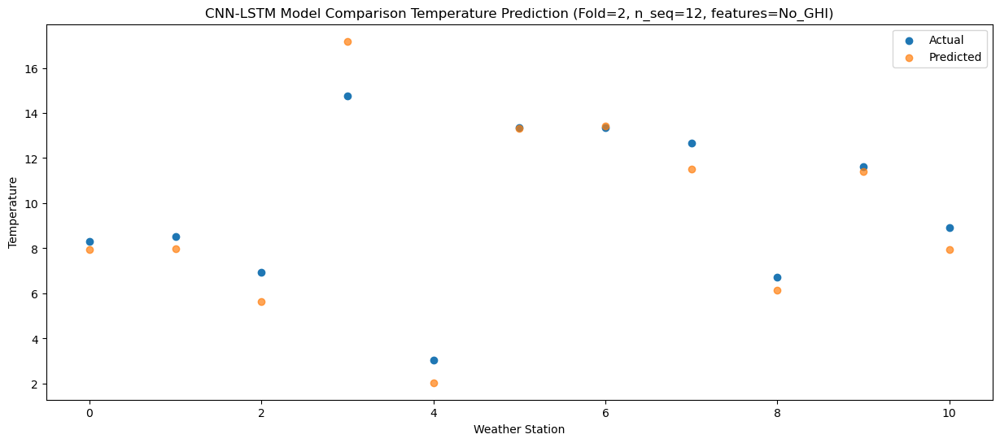

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   5.231023
1                 1    4.49   5.271022
2                 2    9.67   2.941023
3                 3   14.76  14.481023
4                 4    2.29  -0.658977
5                 5   11.00  10.601021
6                 6   10.24  10.711023
7                 7   15.60   8.801023
8                 8    5.79   3.431023
9                 9   12.13   8.701021
10               10   10.25   5.231023


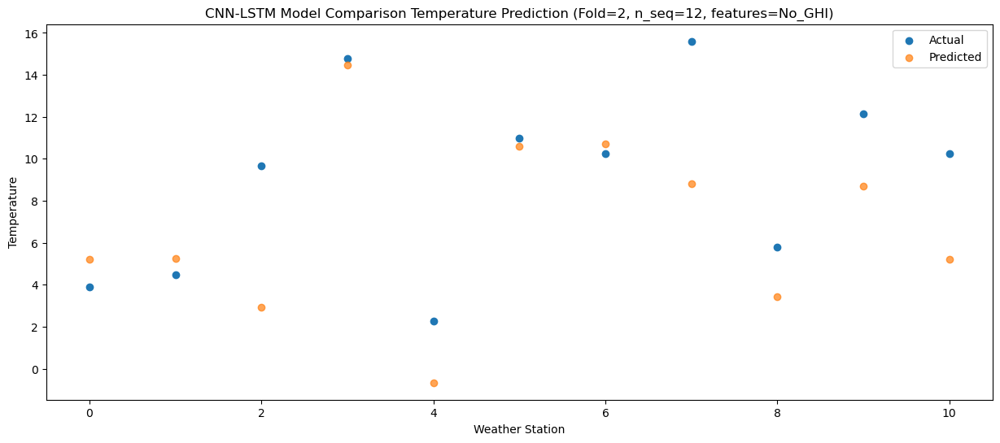

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  14.485850
1                 1   14.68  14.525849
2                 2   11.48  12.195850
3                 3   18.87  23.735850
4                 4    9.62   8.595850
5                 5   19.38  19.855848
6                 6   20.61  19.965850
7                 7   18.70  18.055850
8                 8    5.39  12.685850
9                 9   19.01  17.955848
10               10   16.46  14.485850


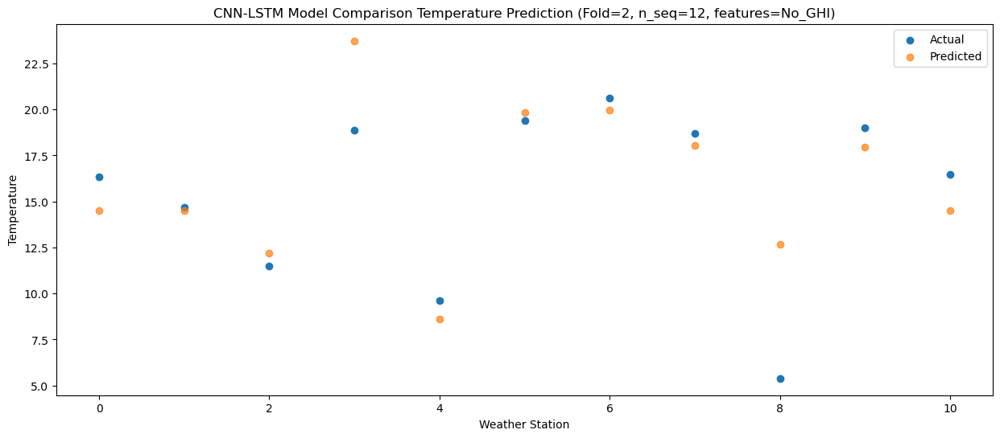

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  18.034929
1                 1   18.44  18.074928
2                 2   13.29  15.744929
3                 3   23.37  27.284929
4                 4   10.49  12.144929
5                 5   21.50  23.404927
6                 6   22.31  23.514929
7                 7   25.36  21.604929
8                 8    9.25  16.234929
9                 9   21.80  21.504927
10               10   18.43  18.034929


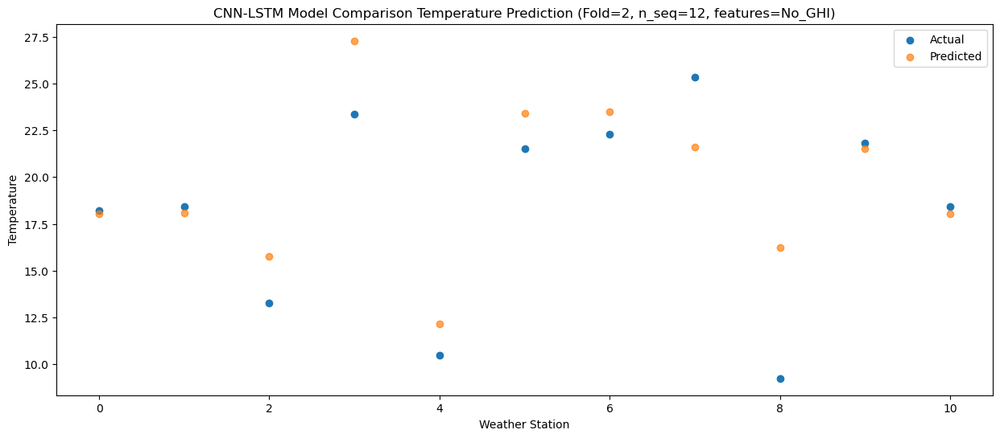

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  22.946917
1                 1   23.62  22.986916
2                 2   16.87  20.656917
3                 3   28.63  32.196917
4                 4   14.96  17.056917
5                 5   25.54  28.316915
6                 6   26.39  28.426917
7                 7   30.37  26.516917
8                 8   11.47  21.146917
9                 9   25.82  26.416915
10               10   23.34  22.946917


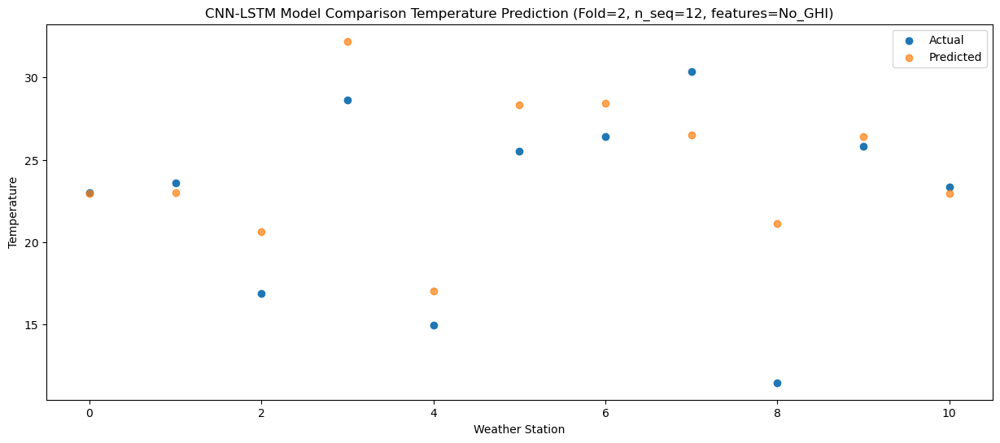

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  29.625910
1                 1   30.87  29.665909
2                 2   18.09  27.335910
3                 3   34.20  38.875910
4                 4   18.44  23.735910
5                 5   30.09  34.995908
6                 6   31.95  35.105910
7                 7   35.36  33.195910
8                 8   15.71  27.825910
9                 9   30.11  33.095908
10               10   28.75  29.625910


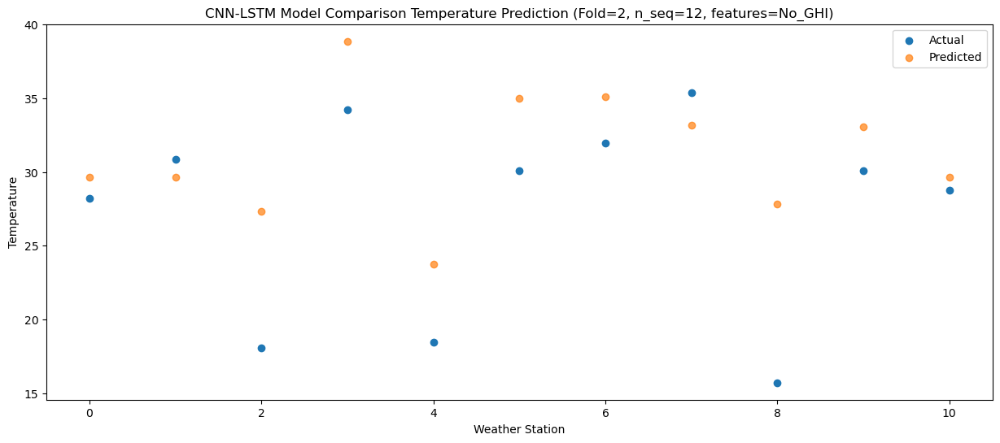

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  30.694887
1                 1   31.56  30.734886
2                 2   18.88  28.404887
3                 3   36.20  39.944887
4                 4   19.03  24.804887
5                 5   30.17  36.064885
6                 6   32.84  36.174887
7                 7   34.16  34.264887
8                 8   18.69  28.894887
9                 9   31.68  34.164885
10               10   30.06  30.694887


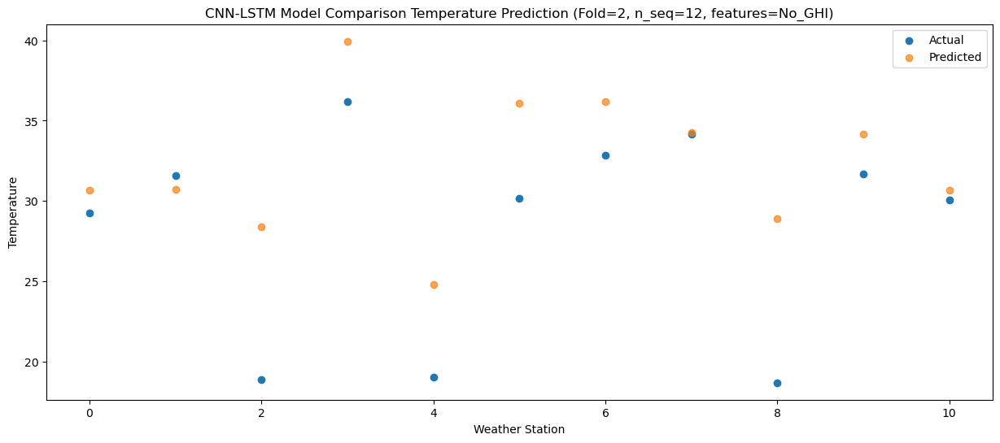

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  30.503377
1                 1   32.32  30.543376
2                 2   18.93  28.213377
3                 3   37.26  39.753377
4                 4   19.20  24.613377
5                 5   31.28  35.873375
6                 6   33.40  35.983377
7                 7   33.64  34.073377
8                 8   18.29  28.703377
9                 9   31.77  33.973375
10               10   30.14  30.503377


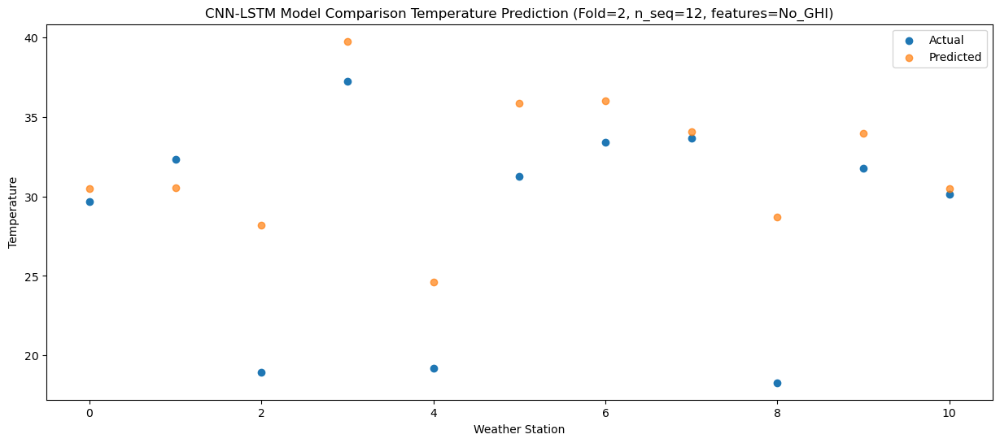

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  26.902594
1                 1   30.08  26.942593
2                 2   17.65  24.612594
3                 3   34.09  36.152594
4                 4   16.66  21.012594
5                 5   28.54  32.272592
6                 6   31.13  32.382594
7                 7   31.46  30.472594
8                 8   16.51  25.102594
9                 9   27.66  30.372592
10               10   25.65  26.902594


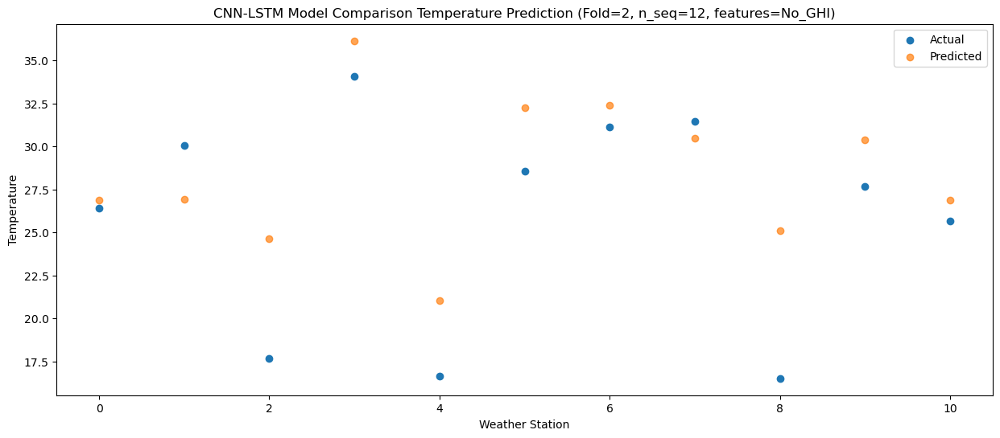

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  21.595317
1                 1   21.82  21.635316
2                 2   16.51  19.305317
3                 3   30.26  30.845317
4                 4   13.92  15.705317
5                 5   25.24  26.965315
6                 6   26.62  27.075317
7                 7   24.90  25.165317
8                 8   11.53  19.795318
9                 9   24.38  25.065315
10               10   21.89  21.595317


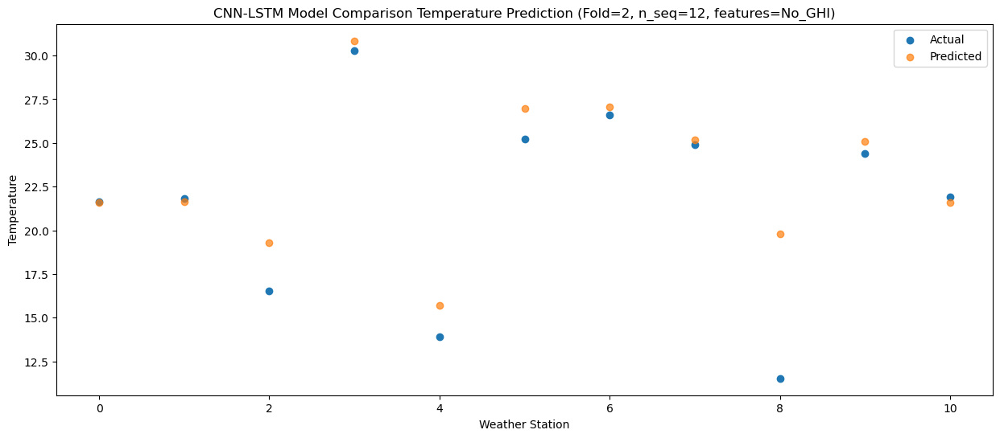

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  13.259837
1                 1   15.11  13.299836
2                 2    9.66  10.969837
3                 3   22.18  22.509837
4                 4    5.65   7.369837
5                 5   17.60  18.629833
6                 6   18.65  18.739837
7                 7   19.50  16.829835
8                 8   10.27  11.459836
9                 9   15.47  16.729833
10               10   11.67  13.259837


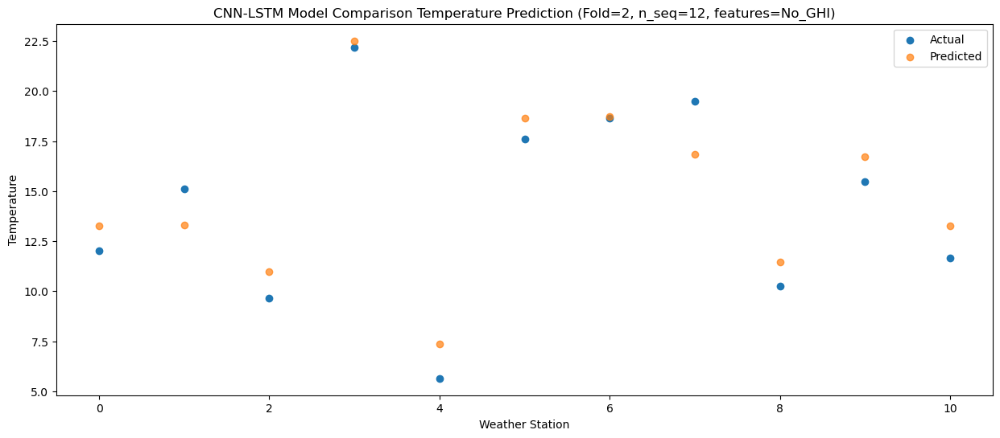

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  11.624882
1                 1   12.72  11.664882
2                 2   10.56   9.334883
3                 3   20.26  20.874882
4                 4    9.06   5.734883
5                 5   20.84  16.994879
6                 6   20.94  17.104883
7                 7   16.15  15.194881
8                 8    3.76   9.824882
9                 9   17.39  15.094878
10               10   13.77  11.624882


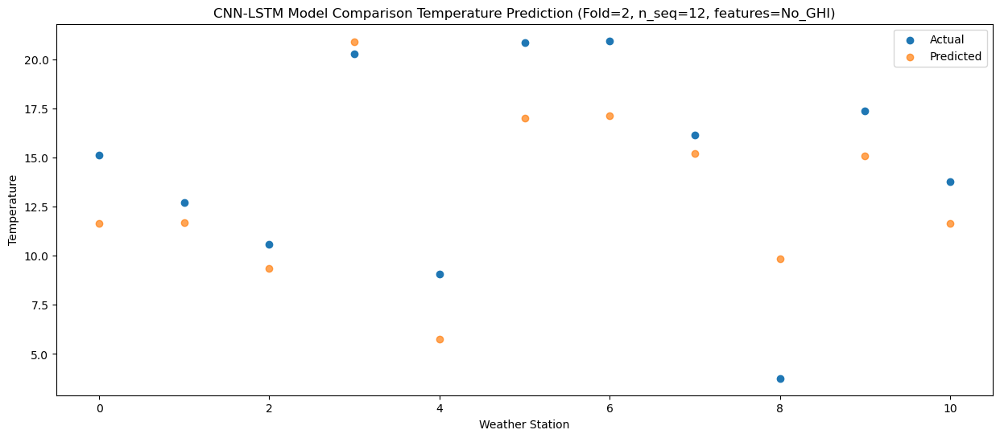

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 7.93189556  7.97189556  5.64189556 17.18189556  2.04189556 13.30189461
  13.41189556 11.50189556  6.13189556 11.40189461  7.93189556]
 [ 5.23102266  5.27102171  2

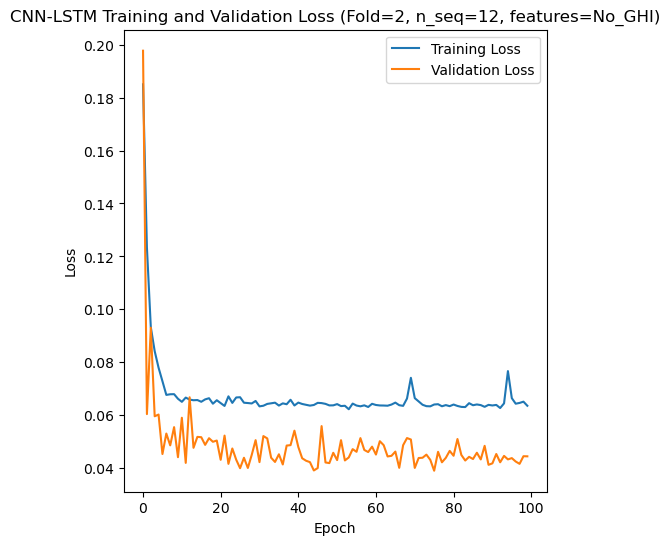

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 45s 303ms/step - loss: 0.1745 - accuracy: 0.5238 - mae: 0.1474 - rmse: 0.1745 - mape: 33.2002 - pearson: 0.5179 - val_loss: 0.1563 - val_accuracy: 0.2000 - val_mae: 0.1218 - val_rmse: 0.1563 - val_mape: 27.3585 - val_pearson: 0.4752
Epoch 2/100
84/84 [==============================] - 18s 210ms/step - loss: 0.1232 - accuracy: 0.6190 - mae: 0.1004 - rmse: 0.1232 - mape: 22.0672 - pearson: 0.6785 - val_loss: 0.0999 - val_accuracy: 0.1000 - val_mae: 0.0825 - val_rmse: 0.0999 - val_mape: 21.2118 - val_pearson: 0.7652
Epoch 3/100
84/84 [==============================] - 18s 215ms/step - loss: 0.0933 - accuracy: 0.7738 - mae: 0.0758 - rmse: 0.0933 - mape: 17.1904 - pearson: 0.7879

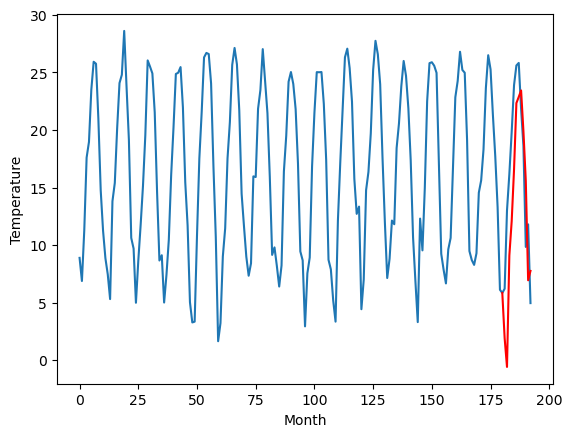

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.62		-0.13
4.03		5.13		1.10
16.00		14.80		-1.20
17.86		17.80		-0.06
22.08		22.29		0.21
28.79		28.04		-0.75
30.10		28.58		-1.52
30.67		29.14		-1.53
27.94		25.58		-2.36
21.34		21.30		-0.04
13.63		12.65		-0.98
14.94		13.47		-1.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 7.618939661979676, 5.1281109094619755, 14.800316834449768, 17.79603006839752, 22.28503563404083, 28.041904473304747, 28.575038576126097, 29.14249494075775, 25.58431293964386, 21.299856209754942, 12.652989411354064, 13.466795051097868]


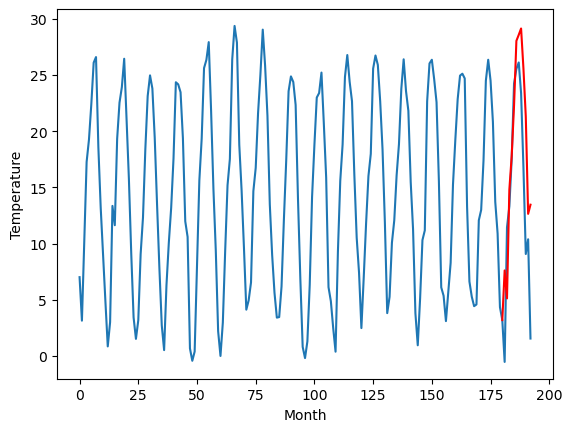

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		5.74		-2.54
10.58		3.25		-7.33
11.73		12.92		1.19
17.46		15.92		-1.54
22.26		20.41		-1.85
27.11		26.16		-0.95
30.24		26.70		-3.54
28.04		27.26		-0.78
24.73		23.70		-1.03
16.07		19.42		3.35
11.73		10.77		-0.96
7.81		11.59		3.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 5.738939661979675, 3.2481109094619747, 12.920316834449768, 15.916030068397522, 20.405035634040832, 26.161904473304748, 26.695038576126098, 27.26249494075775, 23.70431293964386, 19.419856209754943, 10.772989411354065, 11.58679505109787]


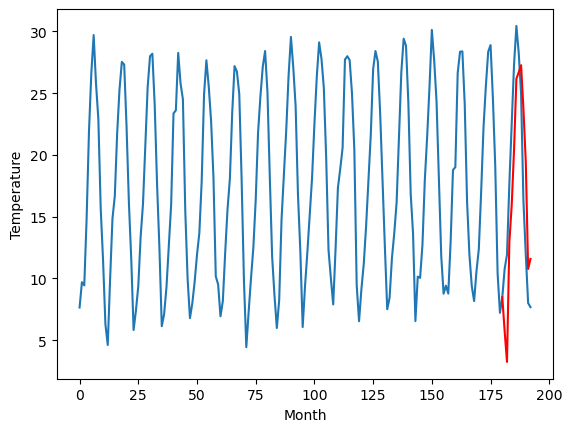

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.37		0.18
4.87		3.88		-0.99
15.08		13.55		-1.53
17.43		16.55		-0.88
21.50		21.04		-0.46
27.42		26.79		-0.63
28.41		27.33		-1.08
28.93		27.89		-1.04
24.80		24.33		-0.47
21.22		20.05		-1.17
11.56		11.40		-0.16
13.05		12.22		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 6.368939661979676, 3.8781109094619755, 13.550316834449768, 16.54603006839752, 21.03503563404083, 26.791904473304747, 27.325038576126097, 27.89249494075775, 24.33431293964386, 20.049856209754942, 11.402989411354064, 12.216795051097868]


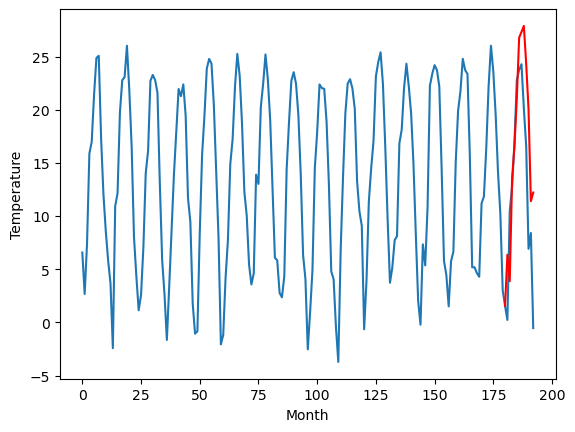

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.29		0.19
1.23		2.80		1.57
14.31		12.47		-1.84
17.60		15.47		-2.13
22.17		19.96		-2.21
29.65		25.71		-3.94
29.65		26.25		-3.40
29.77		26.81		-2.96
26.41		23.25		-3.16
20.99		18.97		-2.02
11.25		10.32		-0.93
10.89		11.14		0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 5.288939661979676, 2.7981109094619754, 12.470316834449768, 15.466030068397522, 19.955035634040833, 25.71190447330475, 26.2450385761261, 26.81249494075775, 23.25431293964386, 18.969856209754944, 10.322989411354065, 11.13679505109787]


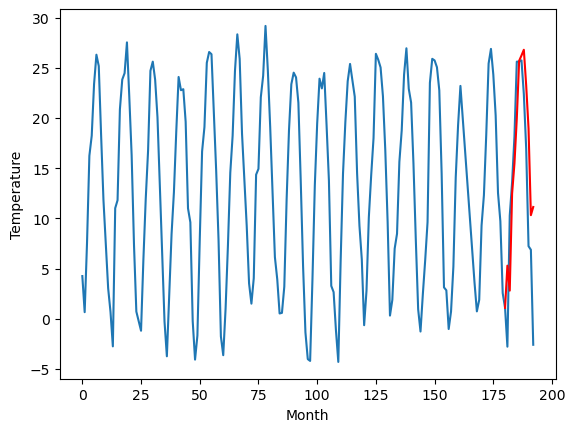

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		2.97		0.17
0.08		0.48		0.40
11.41		10.15		-1.26
14.86		13.15		-1.71
19.14		17.64		-1.50
25.85		23.39		-2.46
26.23		23.93		-2.30
26.55		24.49		-2.06
23.29		20.93		-2.36
18.71		16.65		-2.06
7.86		8.00		0.14
8.91		8.82		-0.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 2.9689396619796753, 0.4781109094619751, 10.150316834449768, 13.146030068397522, 17.635035634040833, 23.39190447330475, 23.9250385761261, 24.49249494075775, 20.93431293964386, 16.649856209754944, 8.002989411354065, 8.81679505109787]


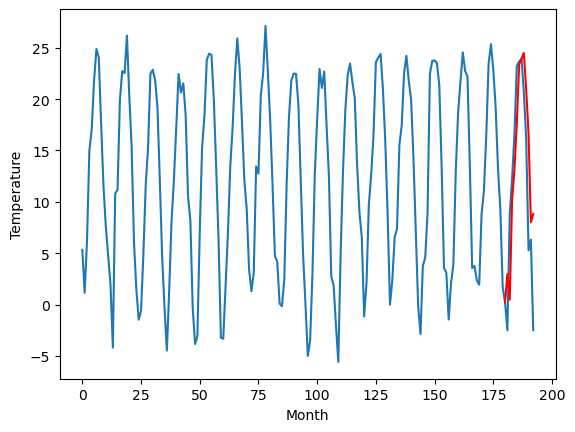

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.05		-1.55
5.70		1.56		-4.14
8.67		11.23		2.56
13.45		14.23		0.78
18.50		18.72		0.22
25.89		24.47		-1.42
27.73		25.01		-2.72
25.81		25.57		-0.24
23.94		22.01		-1.93
15.97		17.73		1.76
13.23		9.08		-4.15
8.47		9.90		1.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 4.048939661979675, 1.5581109094619752, 11.230316834449768, 14.226030068397522, 18.71503563404083, 24.471904473304747, 25.005038576126097, 25.57249494075775, 22.014312939643858, 17.729856209754942, 9.082989411354063, 9.896795051097868]


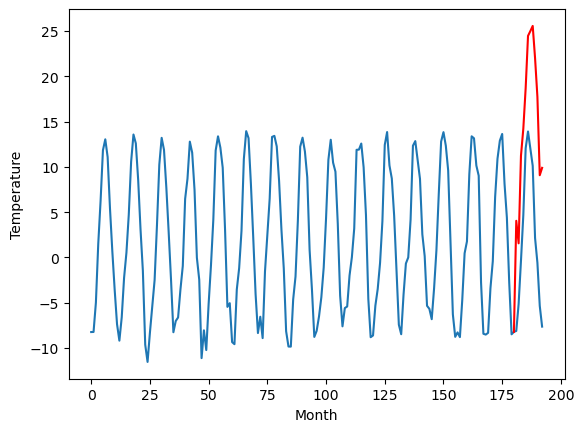

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-9.52		-1.83
-4.84		-12.01		-7.17
-3.24		-2.34		0.90
4.73		0.66		-4.07
9.16		5.15		-4.01
16.80		10.90		-5.90
17.88		11.44		-6.44
16.65		12.00		-4.65
12.68		8.44		-4.24
2.33		4.16		1.83
-0.19		-4.49		-4.30
-7.46		-3.67		3.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -9.521060338020325, -12.011889090538025, -2.339683165550232, 0.6560300683975218, 5.145035634040832, 10.901904473304748, 11.435038576126098, 12.002494940757751, 8.44431293964386, 4.159856209754944, -4.487010588645935, -3.6732049489021303]


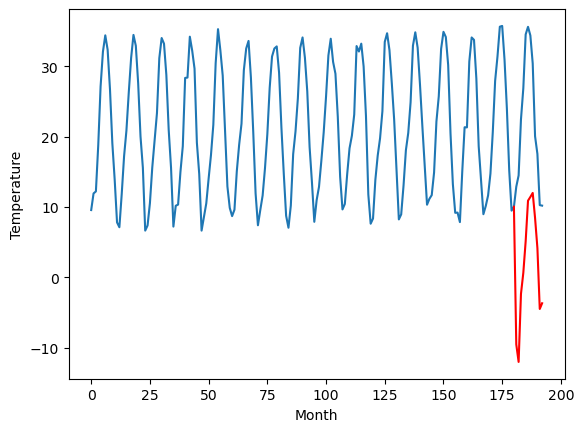

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.29		-2.50
11.72		5.80		-5.92
11.50		15.47		3.97
13.69		18.47		4.78
17.98		22.96		4.98
19.68		28.71		9.03
18.86		29.25		10.39
19.41		29.81		10.40
18.86		26.25		7.39
16.10		21.97		5.87
13.28		13.32		0.04
9.58		14.14		4.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 8.288939661979676, 5.798110909461975, 15.470316834449768, 18.466030068397522, 22.955035634040833, 28.71190447330475, 29.2450385761261, 29.81249494075775, 26.25431293964386, 21.969856209754944, 13.322989411354065, 14.13679505109787]


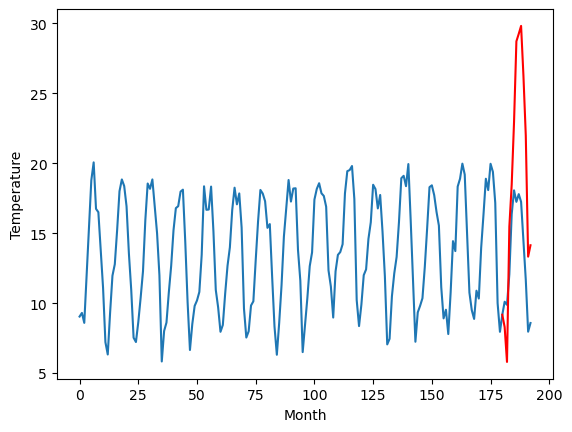

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.76		1.74
5.90		5.27		-0.63
10.90		14.94		4.04
15.52		17.94		2.42
20.35		22.43		2.08
26.22		28.18		1.96
28.36		28.72		0.36
28.98		29.28		0.30
25.66		25.72		0.06
21.22		21.44		0.22
12.30		12.79		0.49
10.70		13.61		2.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 7.758939661979674, 5.268110909461974, 14.940316834449767, 17.93603006839752, 22.42503563404083, 28.181904473304748, 28.715038576126098, 29.28249494075775, 25.72431293964386, 21.439856209754943, 12.792989411354064, 13.606795051097869]


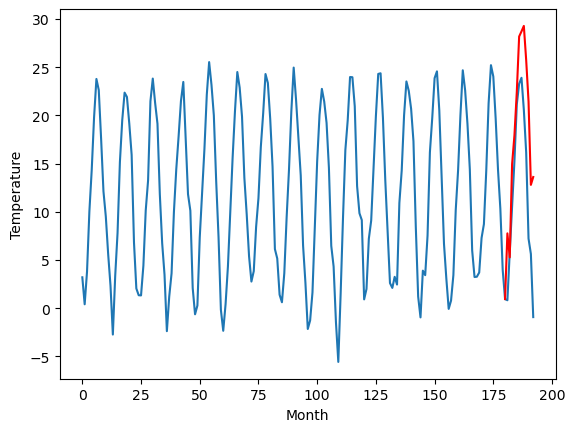

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.92		0.28
0.84		-0.57		-1.41
8.03		9.10		1.07
12.90		12.10		-0.80
17.16		16.59		-0.57
23.33		22.34		-0.99
24.97		22.88		-2.09
24.70		23.44		-1.26
20.44		19.88		-0.56
16.32		15.60		-0.72
6.10		6.95		0.85
5.69		7.77		2.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 1.9189396619796755, -0.5718890905380247, 9.100316834449767, 12.096030068397521, 16.585035634040832, 22.341904473304748, 22.875038576126098, 23.44249494075775, 19.88431293964386, 15.599856209754943, 6.952989411354064, 7.766795051097869]


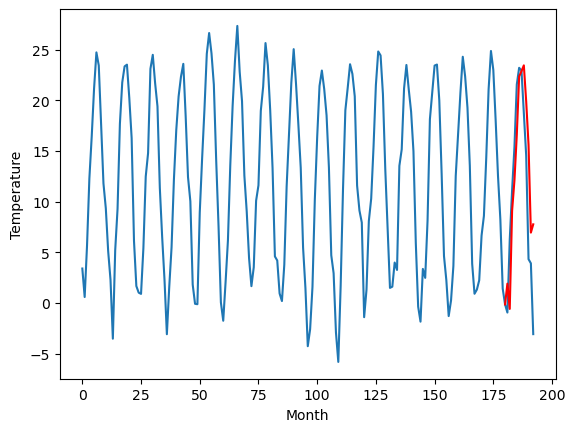

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92    1.91894
1                 1    7.75    7.61894
2                 2    8.28    5.73894
3                 3    6.19    6.36894
4                 4    5.10    5.28894
5                 5    2.80    2.96894
6                 6    5.60    4.04894
7                 7   -7.69   -9.52106
8                 8   10.79    8.28894
9                 9    6.02    7.75894
10               10    1.64    1.91894


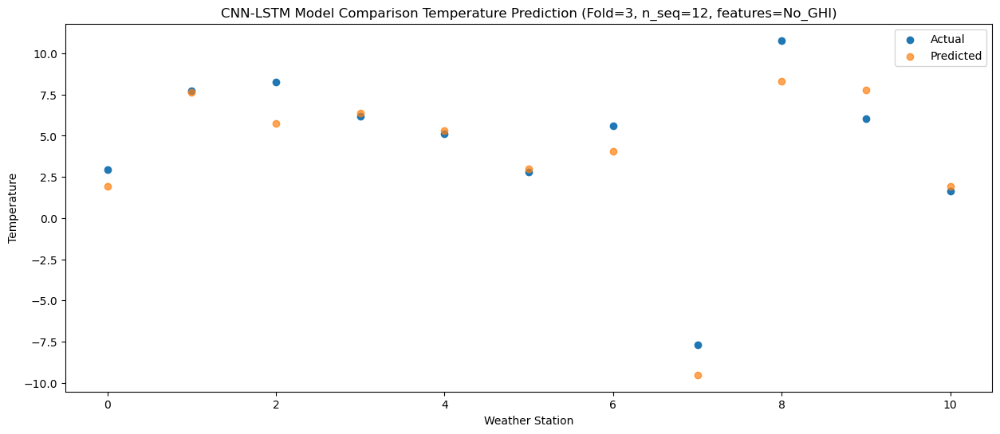

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -0.571889
1                 1    4.03   5.128111
2                 2   10.58   3.248111
3                 3    4.87   3.878111
4                 4    1.23   2.798111
5                 5    0.08   0.478111
6                 6    5.70   1.558111
7                 7   -4.84 -12.011889
8                 8   11.72   5.798111
9                 9    5.90   5.268111
10               10    0.84  -0.571889


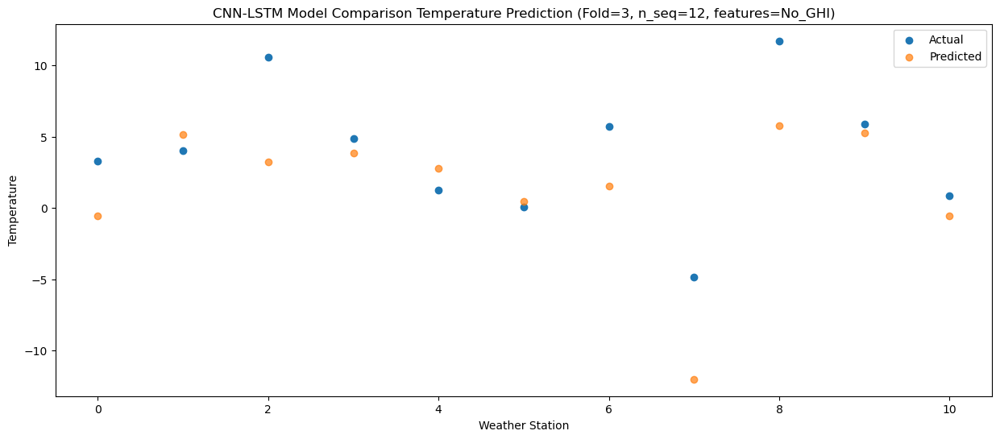

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   9.100317
1                 1   16.00  14.800317
2                 2   11.73  12.920317
3                 3   15.08  13.550317
4                 4   14.31  12.470317
5                 5   11.41  10.150317
6                 6    8.67  11.230317
7                 7   -3.24  -2.339683
8                 8   11.50  15.470317
9                 9   10.90  14.940317
10               10    8.03   9.100317


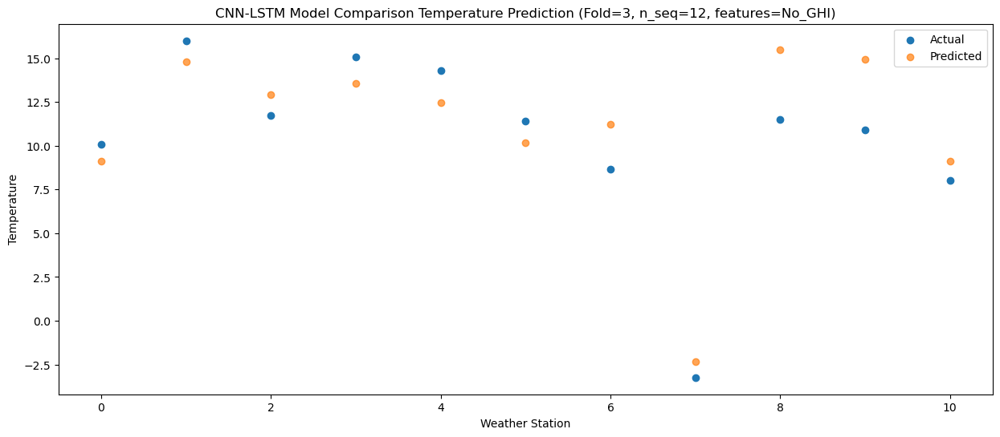

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25   12.09603
1                 1   17.86   17.79603
2                 2   17.46   15.91603
3                 3   17.43   16.54603
4                 4   17.60   15.46603
5                 5   14.86   13.14603
6                 6   13.45   14.22603
7                 7    4.73    0.65603
8                 8   13.69   18.46603
9                 9   15.52   17.93603
10               10   12.90   12.09603


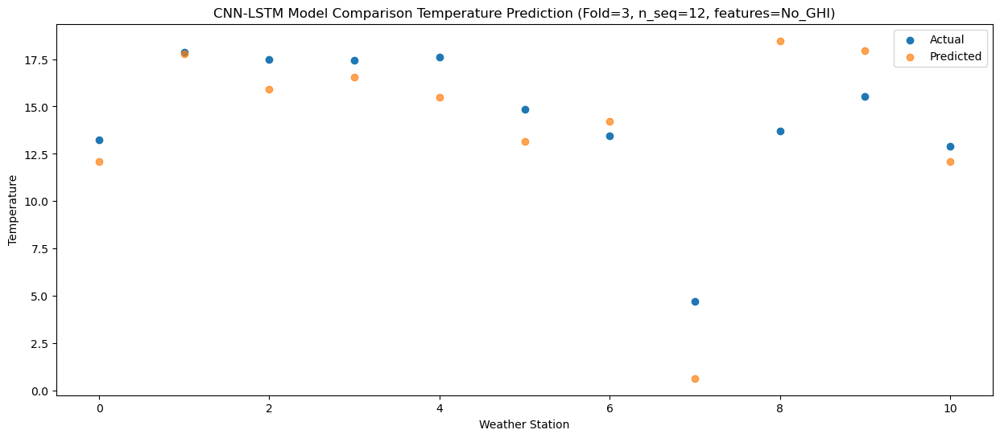

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  16.585036
1                 1   22.08  22.285036
2                 2   22.26  20.405036
3                 3   21.50  21.035036
4                 4   22.17  19.955036
5                 5   19.14  17.635036
6                 6   18.50  18.715036
7                 7    9.16   5.145036
8                 8   17.98  22.955036
9                 9   20.35  22.425036
10               10   17.16  16.585036


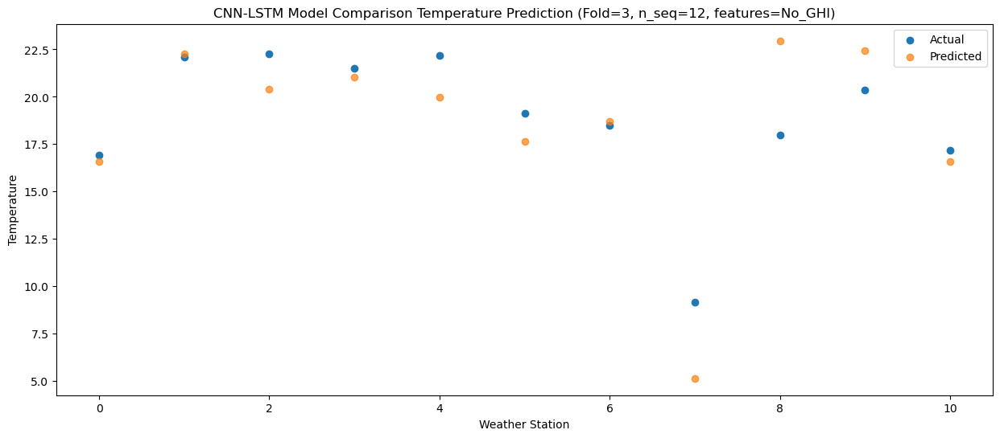

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  22.341904
1                 1   28.79  28.041904
2                 2   27.11  26.161904
3                 3   27.42  26.791904
4                 4   29.65  25.711904
5                 5   25.85  23.391904
6                 6   25.89  24.471904
7                 7   16.80  10.901904
8                 8   19.68  28.711904
9                 9   26.22  28.181904
10               10   23.33  22.341904


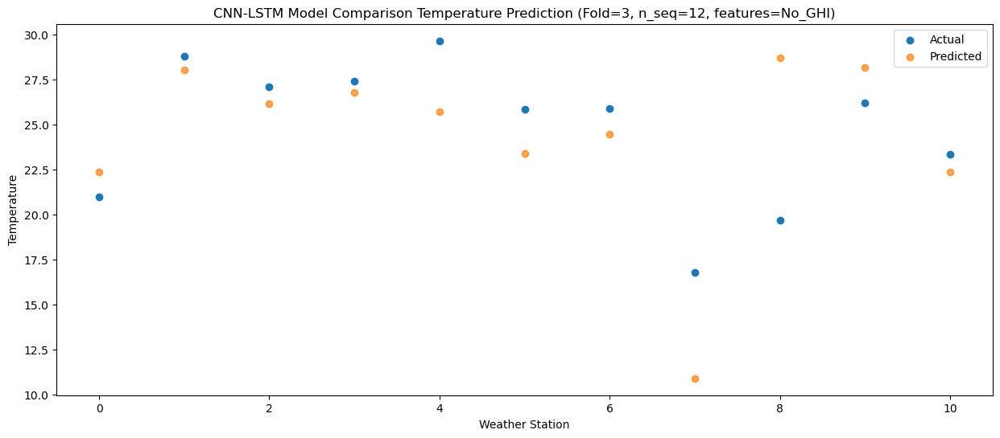

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  22.875039
1                 1   30.10  28.575039
2                 2   30.24  26.695039
3                 3   28.41  27.325039
4                 4   29.65  26.245039
5                 5   26.23  23.925039
6                 6   27.73  25.005039
7                 7   17.88  11.435039
8                 8   18.86  29.245039
9                 9   28.36  28.715039
10               10   24.97  22.875039


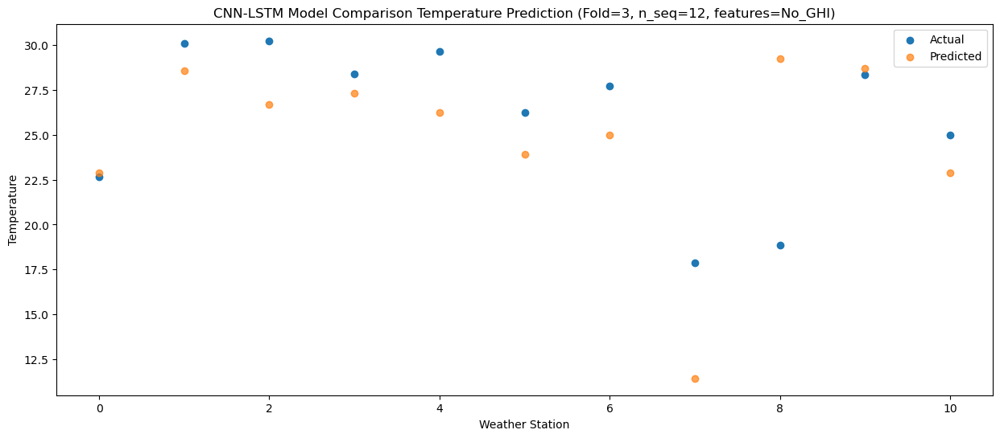

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  23.442495
1                 1   30.67  29.142495
2                 2   28.04  27.262495
3                 3   28.93  27.892495
4                 4   29.77  26.812495
5                 5   26.55  24.492495
6                 6   25.81  25.572495
7                 7   16.65  12.002495
8                 8   19.41  29.812495
9                 9   28.98  29.282495
10               10   24.70  23.442495


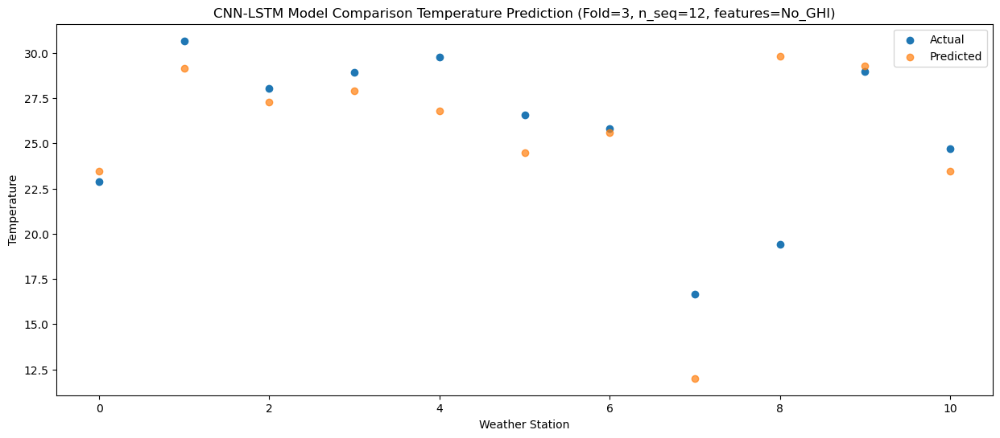

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  19.884313
1                 1   27.94  25.584313
2                 2   24.73  23.704313
3                 3   24.80  24.334313
4                 4   26.41  23.254313
5                 5   23.29  20.934313
6                 6   23.94  22.014313
7                 7   12.68   8.444313
8                 8   18.86  26.254313
9                 9   25.66  25.724313
10               10   20.44  19.884313


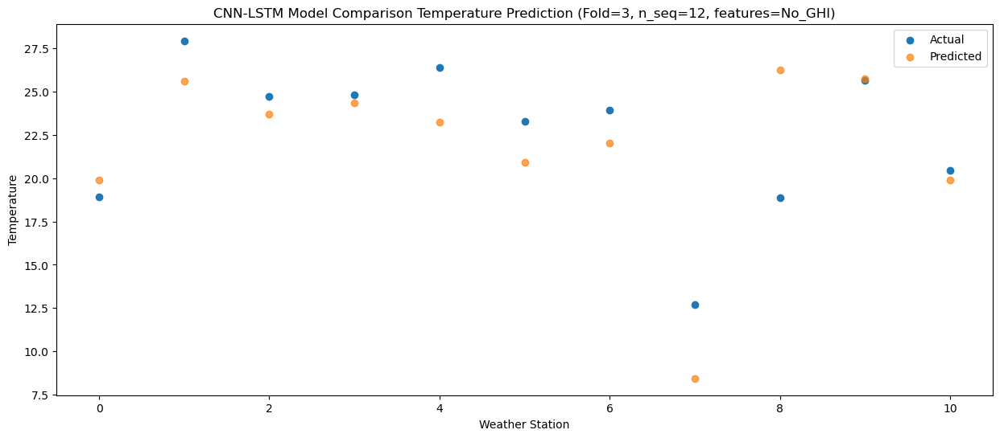

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68  15.599856
1                 1   21.34  21.299856
2                 2   16.07  19.419856
3                 3   21.22  20.049856
4                 4   20.99  18.969856
5                 5   18.71  16.649856
6                 6   15.97  17.729856
7                 7    2.33   4.159856
8                 8   16.10  21.969856
9                 9   21.22  21.439856
10               10   16.32  15.599856


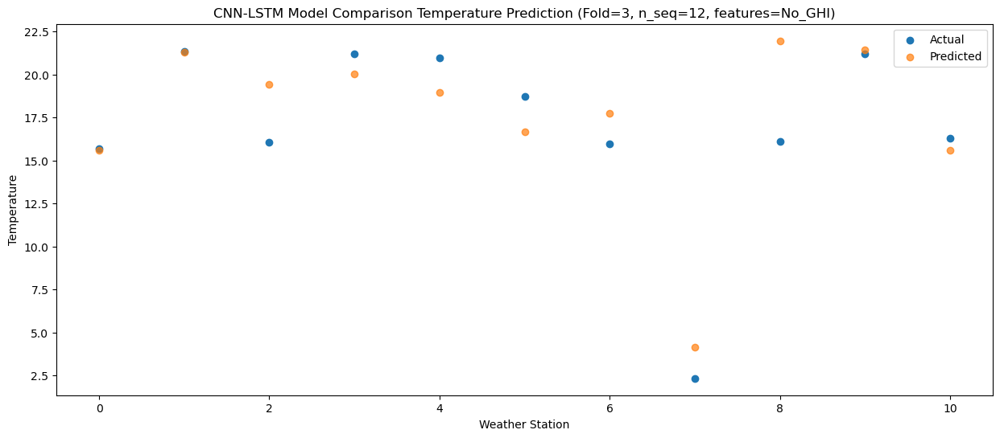

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   6.952989
1                 1   13.63  12.652989
2                 2   11.73  10.772989
3                 3   11.56  11.402989
4                 4   11.25  10.322989
5                 5    7.86   8.002989
6                 6   13.23   9.082989
7                 7   -0.19  -4.487011
8                 8   13.28  13.322989
9                 9   12.30  12.792989
10               10    6.10   6.952989


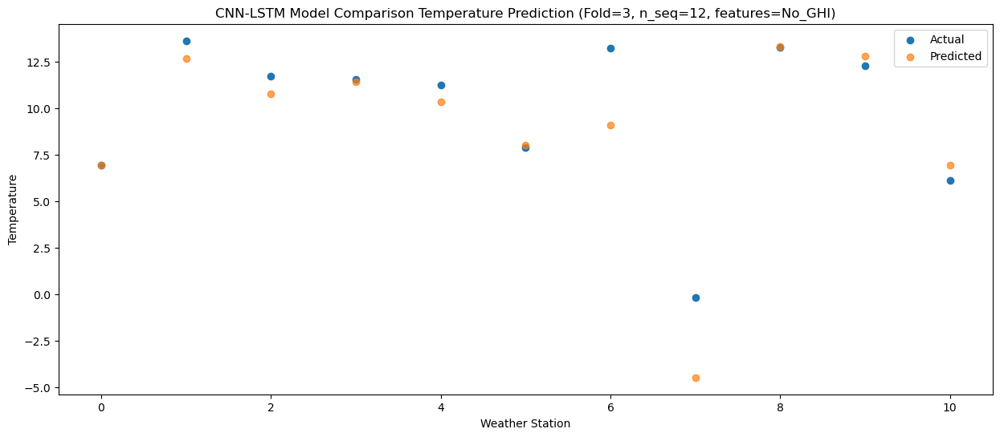

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   7.766795
1                 1   14.94  13.466795
2                 2    7.81  11.586795
3                 3   13.05  12.216795
4                 4   10.89  11.136795
5                 5    8.91   8.816795
6                 6    8.47   9.896795
7                 7   -7.46  -3.673205
8                 8    9.58  14.136795
9                 9   10.70  13.606795
10               10    5.69   7.766795


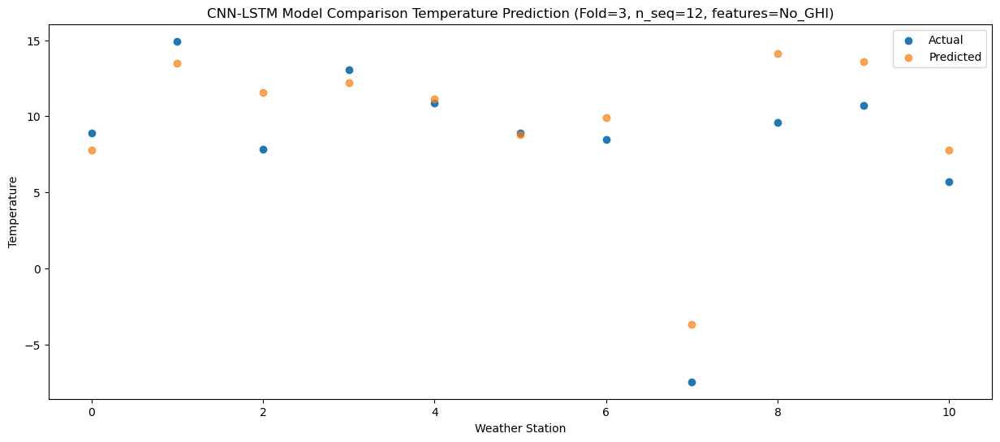

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[  1.91893966   7.61893966   5.73893966   6.36893966   5.28893966
    2.96893966   4.04893966  -9.52106034   8.28893966   7.75893966
    1.91893966]
 [ -0.57188909 

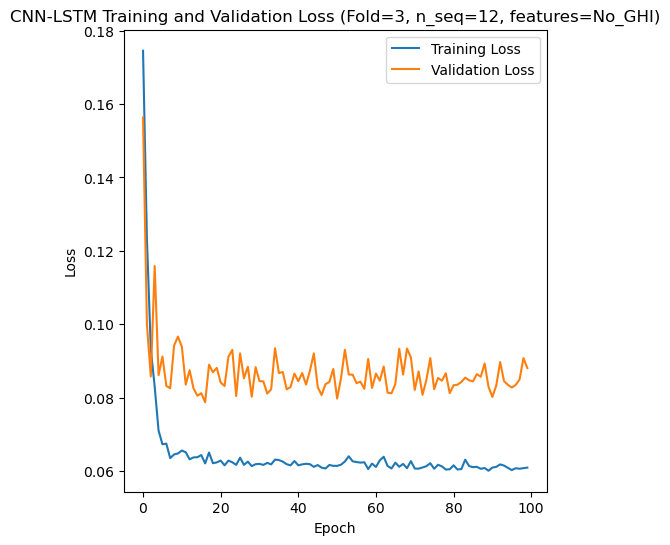

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 45s 287ms/step - loss: 0.1776 - accuracy: 0.4643 - mae: 0.1505 - rmse: 0.1776 - mape: 31.4721 - pearson: 0.5201 - val_loss: 0.1026 - val_accuracy: 0.7000 - val_mae: 0.0857 - val_rmse: 0.1026 - val_mape: 20.7133 - val_pearson: 0.7598
Epoch 2/100
84/84 [==============================] - 18s 216ms/step - loss: 0.1043 - accuracy: 0.5238 - mae: 0.0848 - rmse: 0.1043 - mape: 18.0814 - pearson: 0.6952 - val_loss: 0.1006 - val_accuracy: 0.7000 - val_mae: 0.0832 - val_rmse: 0.1006 - val_mape: 19.3422 - val_pearson: 0.7217
Epoch 3/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0979 - accuracy: 0.5952 - mae: 0.0786 - rmse: 0.0979 - mape: 16.6730 - pearson: 0.7394

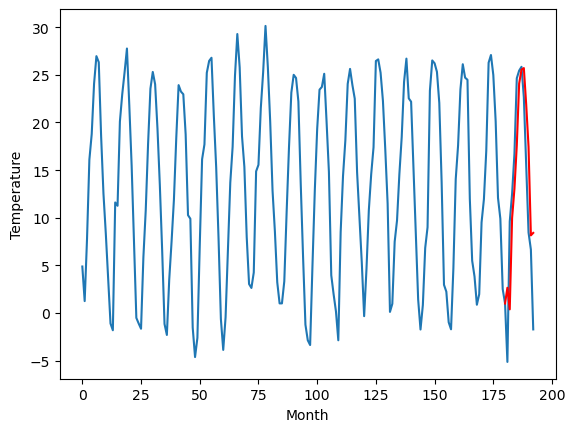

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.93		-1.66
9.02		1.66		-7.36
10.62		11.25		0.63
12.06		14.32		2.26
16.10		18.87		2.77
17.73		25.34		7.61
18.10		26.81		8.71
18.38		26.98		8.60
17.09		23.17		6.08
15.25		18.72		3.47
8.09		9.42		1.33
9.89		9.68		-0.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 3.9311018729209897, 1.6639483714103696, 11.251430823802949, 14.319707229137421, 18.866729094982148, 25.34462340116501, 26.80724592447281, 26.975585787892342, 23.173252194523812, 18.721212475895882, 9.42413625061512, 9.683749108910561]


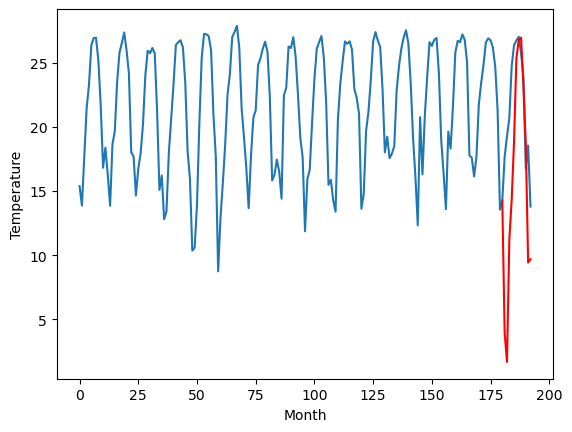

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		14.42		-0.99
13.49		12.15		-1.34
22.82		21.74		-1.08
23.89		24.81		0.92
28.36		29.36		1.00
32.62		35.84		3.22
33.28		37.30		4.02
33.93		37.47		3.54
30.81		33.66		2.85
27.42		29.21		1.79
18.75		19.91		1.16
22.26		20.17		-2.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 14.421210770606995, 12.154059176445008, 21.741675143241885, 24.81016350269318, 29.357297425270083, 35.83518982410431, 37.29776335239411, 37.46617778122425, 33.663875420689585, 29.21186335861683, 19.914826233983042, 20.174562712311747]


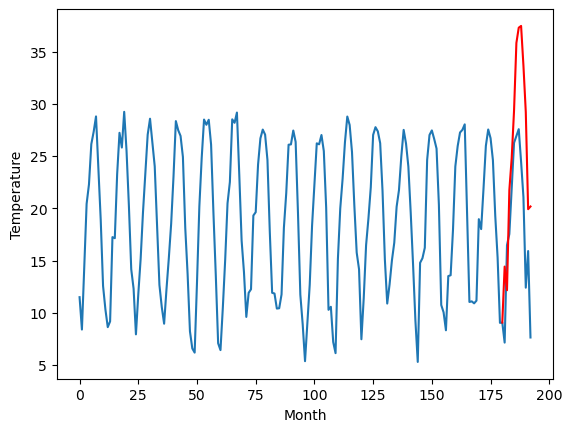

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.53		-0.04
7.11		8.26		1.15
18.07		17.85		-0.22
19.76		20.92		1.16
23.92		25.47		1.55
29.60		31.95		2.35
31.19		33.41		2.22
31.56		33.58		2.02
28.77		29.77		1.00
24.12		25.32		1.20
16.12		16.03		-0.09
18.12		16.28		-1.84
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 10.531140139102936, 8.263935616016388, 17.851740410327913, 20.92007951974869, 25.467244913578035, 31.945400526523592, 33.408115317821505, 33.57663766086102, 29.77436963260174, 25.322310363650324, 16.02513686358929, 16.284949844479563]


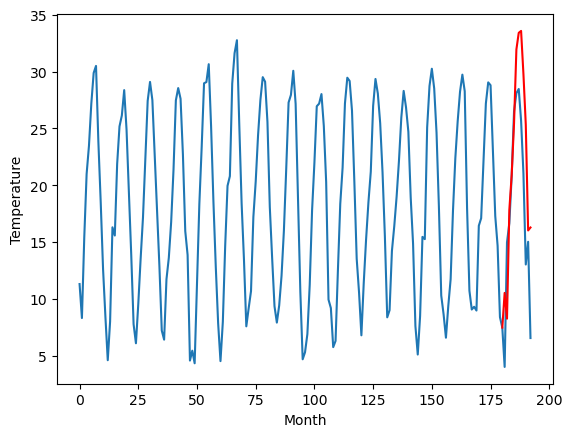

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.35		-0.36
6.82		8.08		1.26
17.74		17.67		-0.07
19.92		20.74		0.82
23.45		25.29		1.84
30.30		31.77		1.47
31.79		33.23		1.44
32.16		33.40		1.24
28.73		29.59		0.86
23.86		25.14		1.28
16.02		15.85		-0.17
17.76		16.11		-1.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.351126430034638, 8.08390617132187, 17.671742436885836, 20.740044353008273, 25.287215468883517, 31.765425918102267, 33.228168127536776, 33.3967081284523, 29.59444987535477, 25.14238106966019, 15.845179913043978, 16.105006632804873]


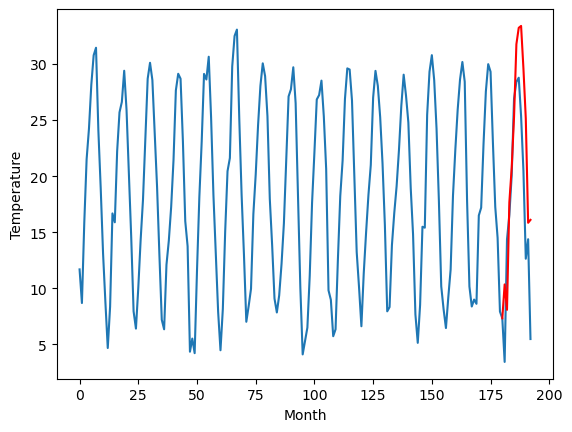

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.73		0.14
9.02		8.46		-0.56
18.27		18.05		-0.22
20.50		21.12		0.62
25.99		25.67		-0.32
30.95		32.15		1.20
30.69		33.61		2.92
31.01		33.78		2.77
30.32		29.97		-0.35
24.62		25.52		0.90
17.68		16.22		-1.46
18.09		16.48		-1.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.730993988513946, 8.46374631166458, 18.05159402132034, 21.11963296175003, 25.66672778367996, 32.14510894060135, 33.6079807305336, 33.77653643727302, 29.97426745533943, 25.522148581743238, 16.224836798906324, 16.484604659080503]


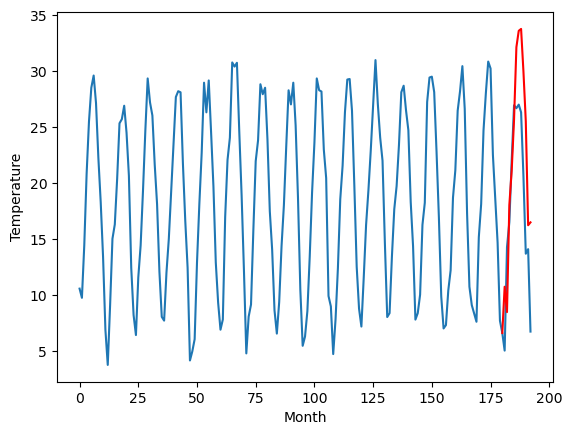

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.60		-1.19
11.46		7.33		-4.13
17.86		16.92		-0.94
20.59		19.99		-0.60
24.04		24.54		0.50
28.06		31.02		2.96
29.80		32.48		2.68
29.93		32.65		2.72
25.96		28.84		2.88
22.16		24.39		2.23
14.00		15.09		1.09
15.91		15.35		-0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 9.601233360767365, 7.334095594882966, 16.921683905124667, 19.990219233036044, 24.537358877658846, 31.01518881082535, 32.47772896051407, 32.64612571656704, 28.843823356032374, 24.391825122237208, 15.094818515181544, 15.354547125697138]


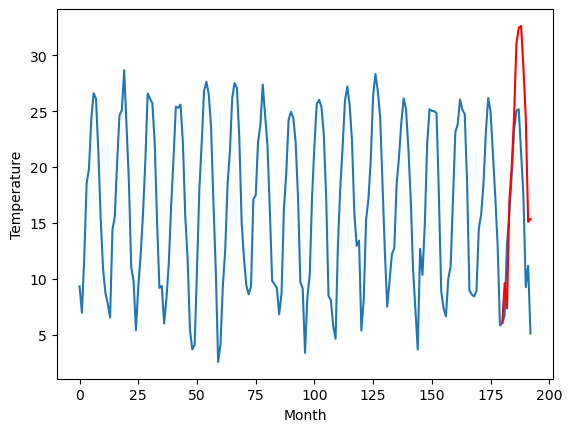

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.36		0.71
4.04		6.09		2.05
16.31		15.68		-0.63
18.21		18.75		0.54
22.25		23.30		1.05
28.55		29.78		1.23
29.84		31.24		1.40
30.36		31.41		1.05
27.32		27.60		0.28
21.55		23.15		1.60
13.61		13.86		0.25
15.07		14.12		-0.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 8.361321635246277, 6.094164080619812, 15.681874461174012, 18.750578589439392, 23.29783410549164, 29.775703139305115, 31.238227553367615, 31.406669445037842, 27.60441023826599, 23.152428693771363, 13.855427808761597, 14.115295745134354]


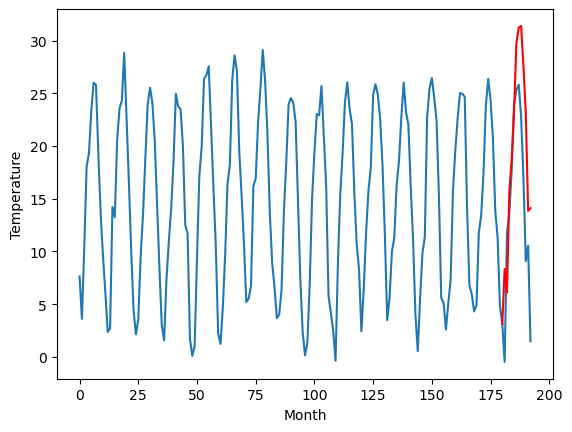

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.68		0.62
2.70		4.41		1.71
14.67		14.00		-0.67
18.32		17.07		-1.25
22.73		21.62		-1.11
29.97		28.10		-1.87
30.54		29.56		-0.98
31.40		29.73		-1.67
27.91		25.92		-1.99
22.56		21.47		-1.09
11.70		12.18		0.48
12.02		12.44		0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 6.681419744491577, 4.4143034362792966, 14.00193084716797, 17.07082332611084, 21.618102684020997, 28.095767631530762, 29.558164491653443, 29.726555361747742, 25.92428637981415, 21.472348704338074, 12.175462260246277, 12.435324295759202]


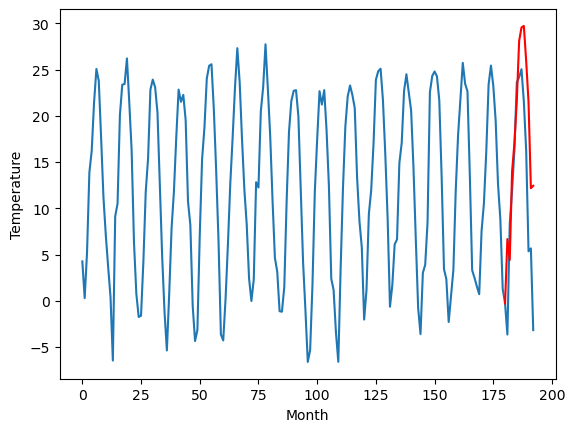

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		3.30		1.07
-2.21		1.03		3.24
11.65		10.62		-1.03
15.36		13.69		-1.67
20.14		18.24		-1.90
27.53		24.72		-2.81
27.24		26.18		-1.06
27.52		26.35		-1.17
24.41		22.54		-1.87
18.95		18.09		-0.86
8.64		8.80		0.16
8.39		9.06		0.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 3.3014217114448545, 1.0342798924446104, 10.622005531787872, 13.690902063846588, 18.238222429752348, 24.715979406833647, 26.178421447277067, 26.346863338947294, 22.544618914127348, 18.09267170190811, 8.795741388797758, 9.055664280652998]


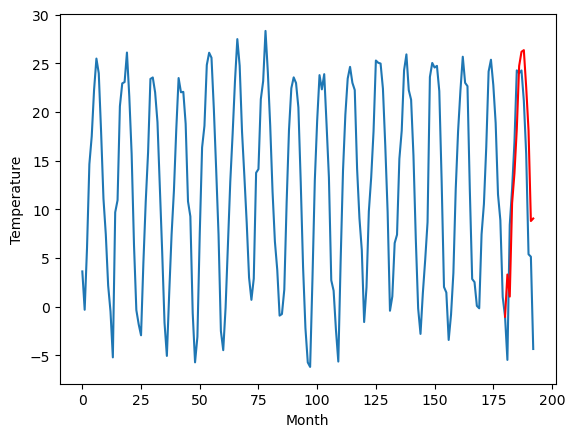

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.66		0.96
-0.54		0.39		0.93
9.35		9.98		0.63
13.15		13.05		-0.10
17.68		17.60		-0.08
24.57		24.08		-0.49
24.73		25.54		0.81
25.93		25.71		-0.22
21.64		21.90		0.26
18.11		17.45		-0.66
7.71		8.16		0.45
6.85		8.42		1.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 2.6614168238639833, 0.3943181586265565, 9.98191886663437, 13.050834949016572, 17.598118121623994, 24.075741584300996, 25.538112933635713, 25.70648419380188, 21.904218311309815, 17.452287788391114, 8.155418510437013, 8.415274674892427]


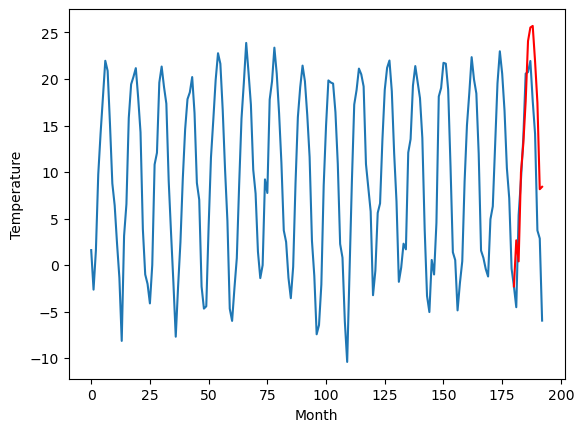

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.661360
1                 1    5.59   3.931102
2                 2   15.41  14.421211
3                 3   10.57  10.531140
4                 4   10.71  10.351126
5                 5   10.59  10.730994
6                 6   10.79   9.601233
7                 7    7.65   8.361322
8                 8    6.06   6.681420
9                 9    2.23   3.301422
10               10    1.70   2.661417


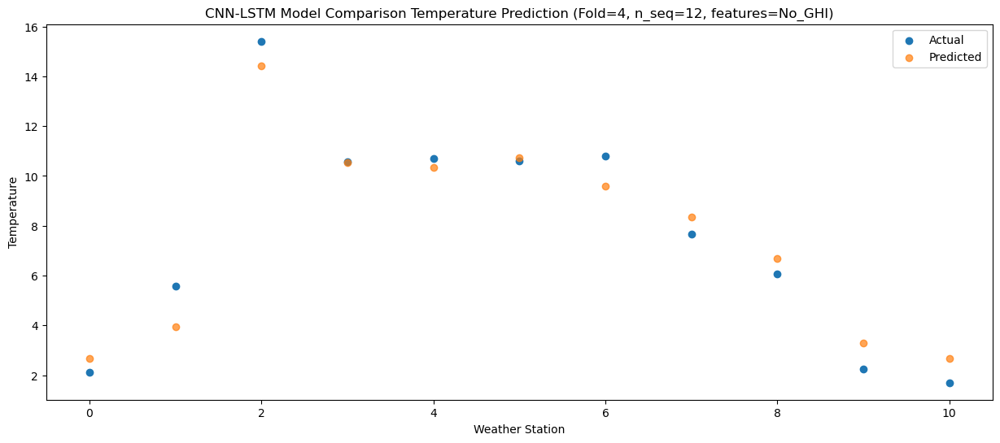

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02   0.394189
1                 1    9.02   1.663948
2                 2   13.49  12.154059
3                 3    7.11   8.263936
4                 4    6.82   8.083906
5                 5    9.02   8.463746
6                 6   11.46   7.334096
7                 7    4.04   6.094164
8                 8    2.70   4.414303
9                 9   -2.21   1.034280
10               10   -0.54   0.394318


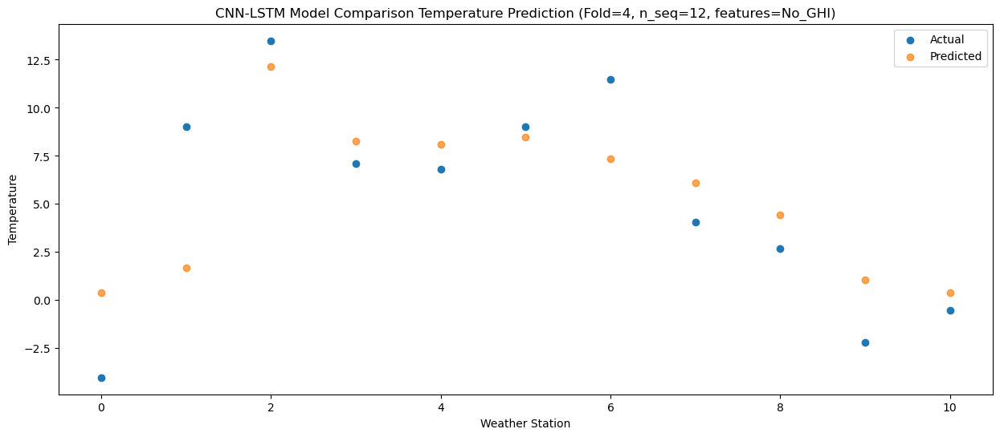

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71   9.981994
1                 1   10.62  11.251431
2                 2   22.82  21.741675
3                 3   18.07  17.851740
4                 4   17.74  17.671742
5                 5   18.27  18.051594
6                 6   17.86  16.921684
7                 7   16.31  15.681874
8                 8   14.67  14.001931
9                 9   11.65  10.622006
10               10    9.35   9.981919


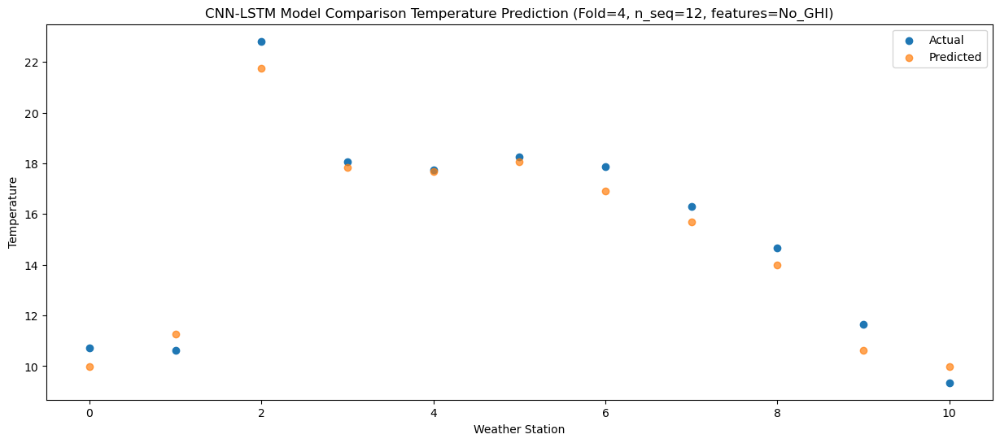

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.050760
1                 1   12.06  14.319707
2                 2   23.89  24.810164
3                 3   19.76  20.920080
4                 4   19.92  20.740044
5                 5   20.50  21.119633
6                 6   20.59  19.990219
7                 7   18.21  18.750579
8                 8   18.32  17.070823
9                 9   15.36  13.690902
10               10   13.15  13.050835


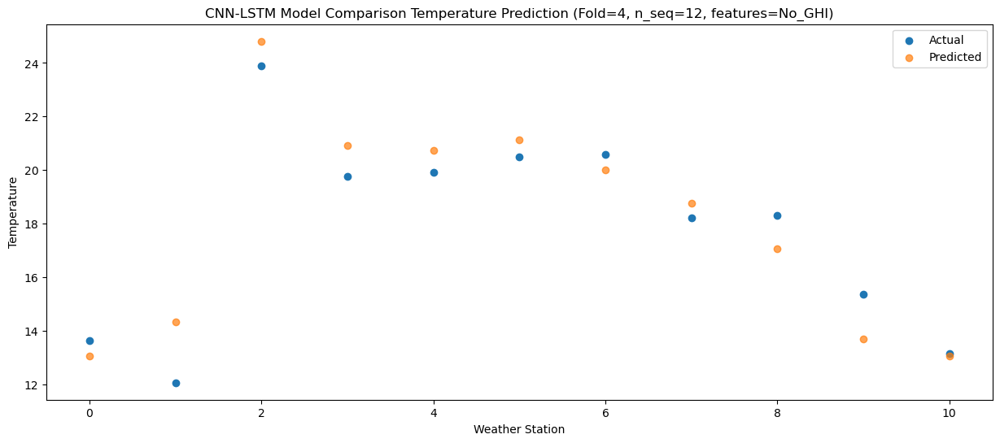

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  17.598071
1                 1   16.10  18.866729
2                 2   28.36  29.357297
3                 3   23.92  25.467245
4                 4   23.45  25.287215
5                 5   25.99  25.666728
6                 6   24.04  24.537359
7                 7   22.25  23.297834
8                 8   22.73  21.618103
9                 9   20.14  18.238222
10               10   17.68  17.598118


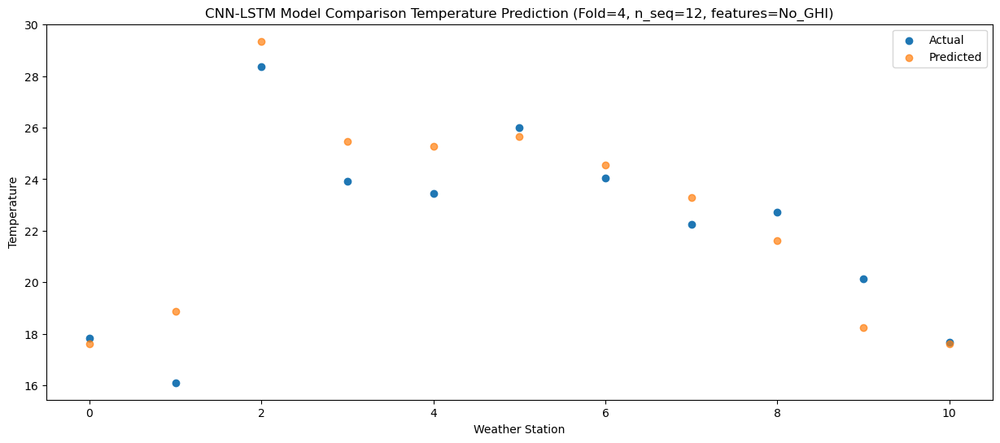

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  24.075993
1                 1   17.73  25.344623
2                 2   32.62  35.835190
3                 3   29.60  31.945401
4                 4   30.30  31.765426
5                 5   30.95  32.145109
6                 6   28.06  31.015189
7                 7   28.55  29.775703
8                 8   29.97  28.095768
9                 9   27.53  24.715979
10               10   24.57  24.075742


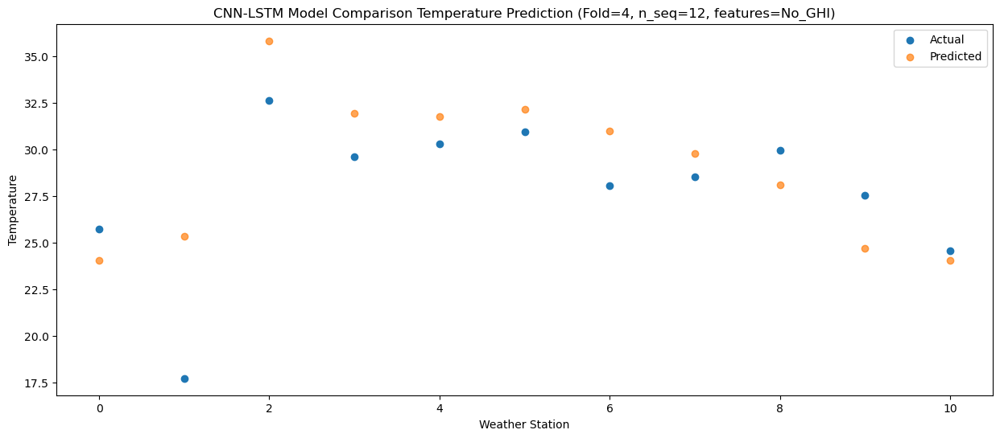

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  25.538529
1                 1   18.10  26.807246
2                 2   33.28  37.297763
3                 3   31.19  33.408115
4                 4   31.79  33.228168
5                 5   30.69  33.607981
6                 6   29.80  32.477729
7                 7   29.84  31.238228
8                 8   30.54  29.558164
9                 9   27.24  26.178421
10               10   24.73  25.538113


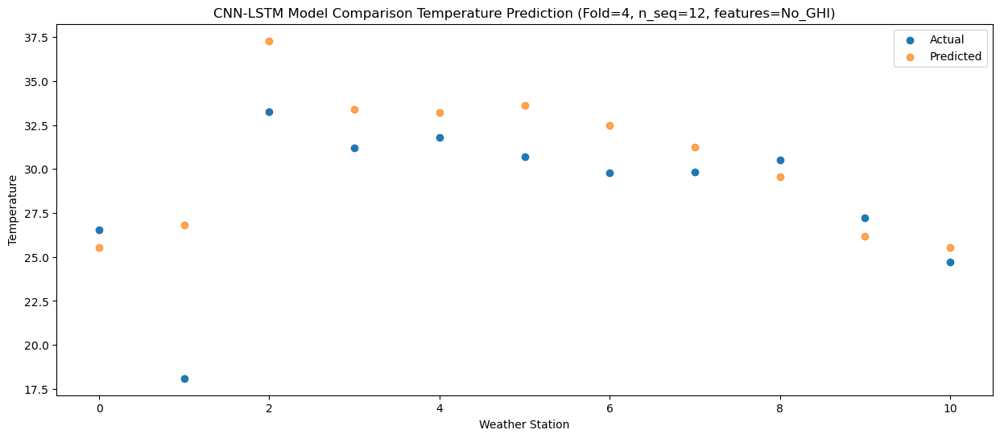

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  25.707018
1                 1   18.38  26.975586
2                 2   33.93  37.466178
3                 3   31.56  33.576638
4                 4   32.16  33.396708
5                 5   31.01  33.776536
6                 6   29.93  32.646126
7                 7   30.36  31.406669
8                 8   31.40  29.726555
9                 9   27.52  26.346863
10               10   25.93  25.706484


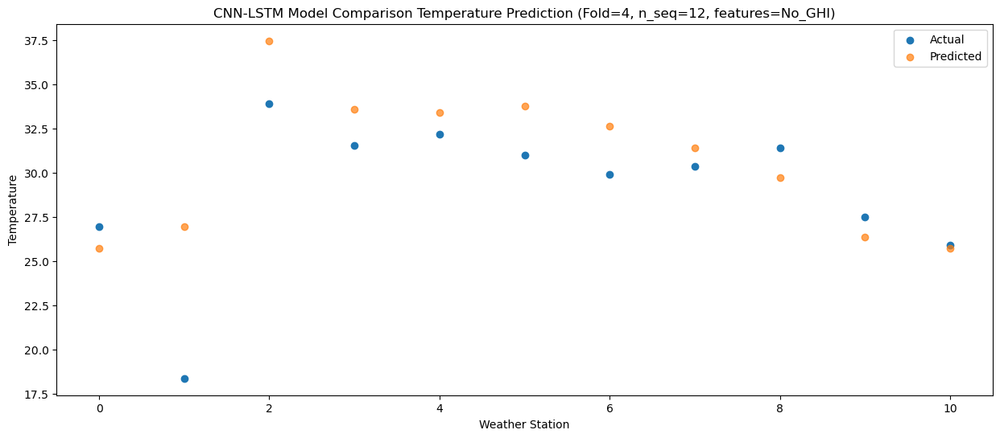

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  21.904785
1                 1   17.09  23.173252
2                 2   30.81  33.663875
3                 3   28.77  29.774370
4                 4   28.73  29.594450
5                 5   30.32  29.974267
6                 6   25.96  28.843823
7                 7   27.32  27.604410
8                 8   27.91  25.924286
9                 9   24.41  22.544619
10               10   21.64  21.904218


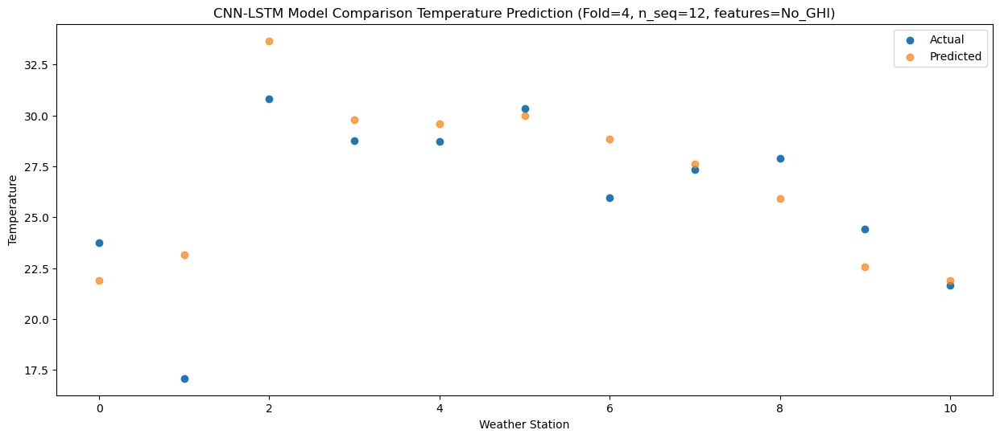

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  17.452804
1                 1   15.25  18.721212
2                 2   27.42  29.211863
3                 3   24.12  25.322310
4                 4   23.86  25.142381
5                 5   24.62  25.522149
6                 6   22.16  24.391825
7                 7   21.55  23.152429
8                 8   22.56  21.472349
9                 9   18.95  18.092672
10               10   18.11  17.452288


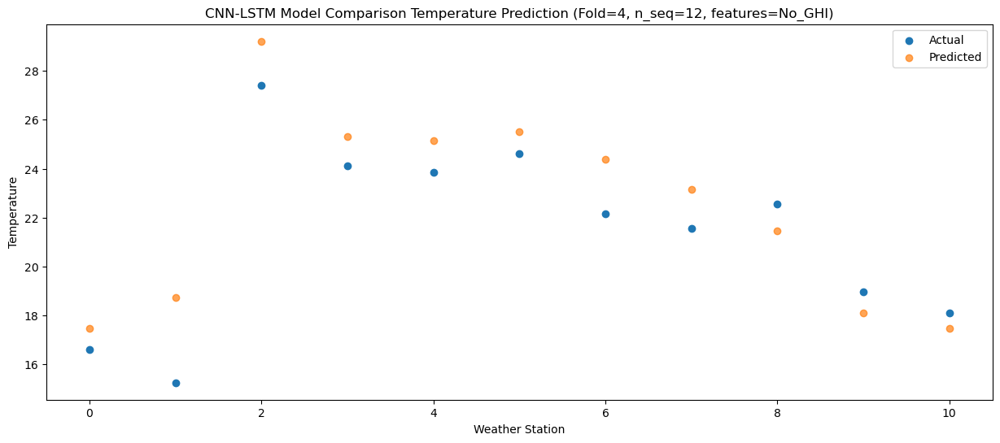

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   8.155785
1                 1    8.09   9.424136
2                 2   18.75  19.914826
3                 3   16.12  16.025137
4                 4   16.02  15.845180
5                 5   17.68  16.224837
6                 6   14.00  15.094819
7                 7   13.61  13.855428
8                 8   11.70  12.175462
9                 9    8.64   8.795741
10               10    7.71   8.155419


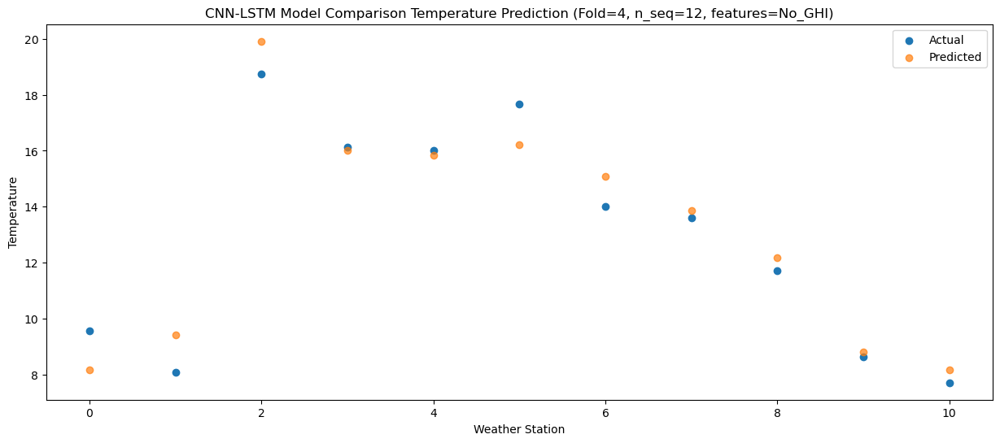

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77   8.415733
1                 1    9.89   9.683749
2                 2   22.26  20.174563
3                 3   18.12  16.284950
4                 4   17.76  16.105007
5                 5   18.09  16.484605
6                 6   15.91  15.354547
7                 7   15.07  14.115296
8                 8   12.02  12.435324
9                 9    8.39   9.055664
10               10    6.85   8.415275


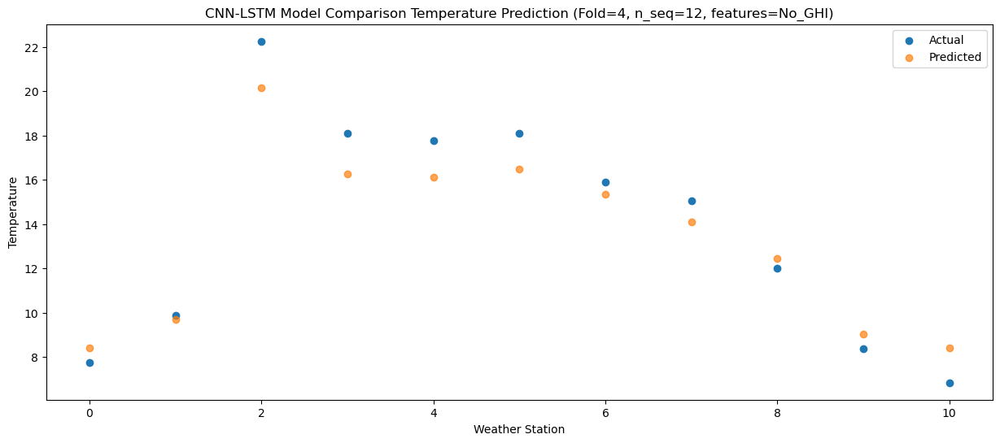

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 2.6613599   3.93110187 14.42121077 10.53114014 10.35112643 10.73099399
   9.60123336  8.36132164  6.68141974  3.30142171  2.66141682]
 [ 0.39418876  1.66394837 12

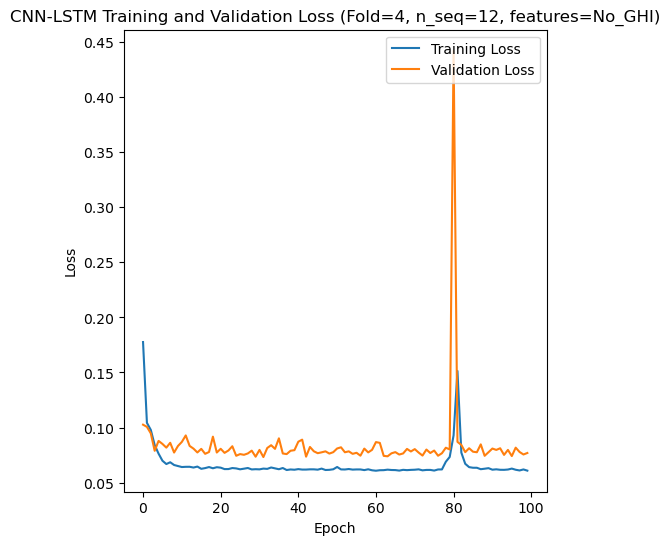

[[3.181429324438228], [2.6436005028964926], [3.6721295150461084], [2.9267447444583703], [2.170213402910126]]
[[array(3.18142932)], [array(2.6436005)], [array(3.67212952)], [array(2.92674474)], [array(2.1702134)]]
[[2.6191474499982417], [2.0889882365410974], [2.5803401713931198], [2.076548108061154], [1.5369452155449177]]
[[0.19828794944021486], [0.12317548140612837], [0.18233381309986757], [0.4042599858195611], [0.13164374227961584]]
[[0.8364172078076264], [0.875417407898197], [0.8191730437618304], [0.8927285495604194], [0.9397018581591016]]
[[array(0.11959162)], [array(0.12317548)], [array(0.18233381)], [array(0.02363516)], [array(0.06654866)]]
[[array(0.94164343)], [array(0.93430066)], [array(0.86876631)], [array(0.90129892)], [array(0.94851252)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.34 17

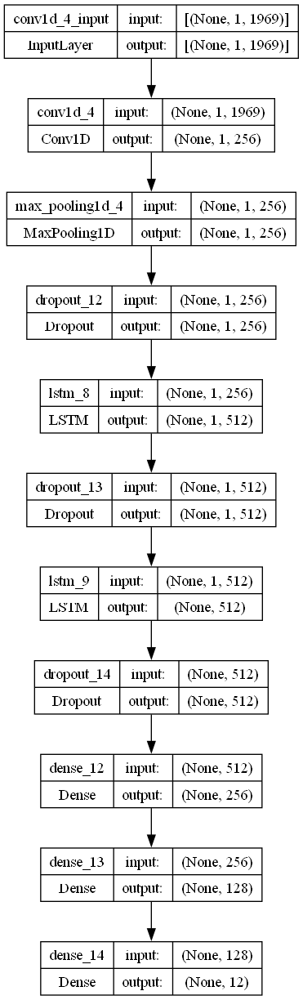

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 256
    lr = 0.0012502657102749708
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.33547357378065584

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)